In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.graphics.gofplots import qqplot
from statsmodels.tsa.stattools import adfuller
from tqdm import tqdm_notebook
from itertools import product
from typing import Union

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [ ]:
import yfinance as yf
tickers = ["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]
data1 = yf.download(tickers, start="2002-01-01", end="2025-11-24", auto_adjust=True)
data1.to_csv("core_market_dataset1.csv")


[*********************100%***********************]  6 of 6 completed


In [ ]:
data1

Price            Close                                                 \
Ticker            AAPL       EBAY         MCD        MSFT        NVDA   
Date                                                                    
2002-01-02    0.349395   6.218078   14.364335   20.475889    0.514220   
2002-01-03    0.353594   6.390044   14.527007   21.144789    0.547915   
2002-01-04    0.355244   6.437031   14.635462   21.043999    0.531947   
2002-01-07    0.343398   6.277279   14.749341   20.940145    0.517658   
2002-01-08    0.339049   6.346817   14.836091   21.190601    0.523771   
...                ...        ...         ...         ...         ...   
2025-11-17  267.459991  82.160004  304.899994  506.541931  186.600006   
2025-11-18  267.440002  81.830002  304.589996  492.867554  181.360001   
2025-11-19  268.559998  81.279999  302.739990  486.209991  186.520004   
2025-11-20  266.250000  80.050003  304.160004  478.429993  180.639999   
2025-11-21  271.489990  80.839996  309.350006  472.119995  178.880005   

Price                        High                                     ...  \
Ticker           SBUX        AAPL       EBAY         MCD        MSFT  ...   
Date                                                                  ...   
2002-01-02   3.642586    0.349395   6.224656   14.445673   20.497269  ...   
2002-01-03   3.812489    0.356144   6.415416   14.619189   21.150896  ...   
2002-01-04   4.128017    0.359143   6.531001   14.667997   21.352482  ...   
2002-01-07   4.077607    0.359892   6.501871   14.895749   21.386070  ...   
2002-01-08   4.236303    0.345647   6.347757   14.901161   21.337208  ...   
...               ...         ...        ...         ...         ...  ...   
2025-11-17  83.690002  270.489990  84.440002  307.700012  511.163287  ...   
2025-11-18  83.330002  270.709991  82.860001  308.440002  502.040388  ...   
2025-11-19  83.680000  272.209991  81.889999  304.839996  494.264923  ...   
2025-11-20  82.620003  275.429993  82.959999  305.640015  493.570007  ...   
2025-11-21  85.349998  273.329987  81.639999  310.540009  478.920013  ...   

Price             Open                                        Volume  \
Ticker             MCD        MSFT        NVDA       SBUX       AAPL   
Date                                                                   
2002-01-02   14.353490   20.356772    0.513380   3.567905  529496800   
2002-01-03   14.380598   20.497280    0.515290   3.657525  612007200   
2002-01-04   14.630039   21.150898    0.555174   4.053335  409976000   
2002-01-07   14.640890   21.303606    0.534086   4.122416  444584000   
2002-01-08   14.830668   20.979858    0.516589   4.085073  450038400   
...                ...         ...         ...        ...        ...   
2025-11-17  307.170013  507.500160  185.970001  85.190002   45018300   
2025-11-18  305.679993  494.444589  183.380005  83.610001   45677300   
2025-11-19  304.589996  489.184435  184.789993  83.260002   40424500   
2025-11-20  302.450012  492.709991  195.949997  84.029999   45823600   
2025-11-21  306.269989  478.500000  181.240005  82.519997   58784100   

Price                                                          
Ticker          EBAY      MCD      MSFT        NVDA      SBUX  
Date                                                           
2002-01-02  59122483  3855800  48124000  1298904000  11298400  
2002-01-03  50394960  4813300  67590800  1414752000  25148400  
2002-01-04  44531942  4883600  52731400   936288000  62756400  
2002-01-07  42132182  3683800  58508800   973068000  23204000  
2002-01-08  52871702  3326000  47736400   774360000  21871600  
...              ...      ...       ...         ...       ...  
2025-11-17   4105000  2435700  19092800   173628900   8547200  
2025-11-18   3305000  2773800  33815100   213598900   7189400  
2025-11-19   4034100  2008300  23245300   247246400   6195100  
2025-11-20   4609600  4205100  26802500   343504800   8966300  
2025-11-21   4441500  3346200  31699600   346068500  1022

In [ ]:
data1.tail()

Price            Close                                                 \
Ticker            AAPL       EBAY         MCD        MSFT        NVDA   
Date                                                                    
2025-11-17  267.459991  82.160004  304.899994  506.541931  186.600006   
2025-11-18  267.440002  81.830002  304.589996  492.867554  181.360001   
2025-11-19  268.559998  81.279999  302.739990  486.209991  186.520004   
2025-11-20  266.250000  80.050003  304.160004  478.429993  180.639999   
2025-11-21  271.489990  80.839996  309.350006  472.119995  178.880005   

Price                        High                                     ...  \
Ticker           SBUX        AAPL       EBAY         MCD        MSFT  ...   
Date                                                                  ...   
2025-11-17  83.690002  270.489990  84.440002  307.700012  511.163287  ...   
2025-11-18  83.330002  270.709991  82.860001  308.440002  502.040388  ...   
2025-11-19  83.680000  272.209991  81.889999  304.839996  494.264923  ...   
2025-11-20  82.620003  275.429993  82.959999  305.640015  493.570007  ...   
2025-11-21  85.349998  273.329987  81.639999  310.540009  478.920013  ...   

Price             Open                                       Volume           \
Ticker             MCD        MSFT        NVDA       SBUX      AAPL     EBAY   
Date                                                                           
2025-11-17  307.170013  507.500160  185.970001  85.190002  45018300  4105000   
2025-11-18  305.679993  494.444589  183.380005  83.610001  45677300  3305000   
2025-11-19  304.589996  489.184435  184.789993  83.260002  40424500  4034100   
2025-11-20  302.450012  492.709991  195.949997  84.029999  45823600  4609600   
2025-11-21  306.269989  478.500000  181.240005  82.519997  58784100  4441500   

Price                                               
Ticker          MCD      MSFT       NVDA      SBUX  
Date                                                
2025-11-17  2435700  19092800  173628900   8547200  
2025-11-18  2773800  33815100  213598900   7189400  
2025-11-19  2008300  23245300  247246400   6195100  
2025-11-20  4205100  26802500  343504800   8966300  
2025-11-21  3346200  31699600  346068500  10226600  

[5 rows x 30 columns]

In [ ]:
print(data1.columns)


MultiIndex([( 'Close', 'AAPL'),
            ( 'Close', 'EBAY'),
            ( 'Close',  'MCD'),
            ( 'Close', 'MSFT'),
            ( 'Close', 'NVDA'),
            ( 'Close', 'SBUX'),
            (  'High', 'AAPL'),
            (  'High', 'EBAY'),
            (  'High',  'MCD'),
            (  'High', 'MSFT'),
            (  'High', 'NVDA'),
            (  'High', 'SBUX'),
            (   'Low', 'AAPL'),
            (   'Low', 'EBAY'),
            (   'Low',  'MCD'),
            (   'Low', 'MSFT'),
            (   'Low', 'NVDA'),
            (   'Low', 'SBUX'),
            (  'Open', 'AAPL'),
            (  'Open', 'EBAY'),
            (  'Open',  'MCD'),
            (  'Open', 'MSFT'),
            (  'Open', 'NVDA'),
            (  'Open', 'SBUX'),
            ('Volume', 'AAPL'),
            ('Volume', 'EBAY'),
            ('Volume',  'MCD'),
            ('Volume', 'MSFT'),
            ('Volume', 'NVDA'),
            ('Volume', 'SBUX')],
           names=['Price', 'Ticker'])


In [ ]:
prices = data1['Close'].copy()
prices


Ticker,AAPL,EBAY,MCD,MSFT,NVDA,SBUX
Date,,,,,,
2002-01-02,0.349395,6.218078,14.364335,20.475889,0.514220,3.642586
2002-01-03,0.353594,6.390044,14.527007,21.144789,0.547915,3.812489
2002-01-04,0.355244,6.437031,14.635462,21.043999,0.531947,4.128017
2002-01-07,0.343398,6.277279,14.749341,20.940145,0.517658,4.077607
2002-01-08,0.339049,6.346817,14.836091,21.190601,0.523771,4.236303
...,...,...,...,...,...,...
2025-11-17,267.459991,82.160004,304.899994,506.541931,186.600006,83.690002
2025-11-18,267.440002,81.830002,304.589996,492.867554,181.360001,83.330002
2025-11-19,268.559998,81.279999,302.739990,486.209991,186.520004,83.680000


In [ ]:
prices.describe()


Ticker,AAPL,EBAY,MCD,MSFT,NVDA,SBUX
count,6013.000000,6013.000000,6013.000000,6013.000000,6013.000000,6013.000000
mean,51.393698,25.996026,106.075173,104.078401,14.484459,39.145674
std,69.416461,18.705262,90.384989,131.940883,35.863105,32.998834
min,0.196742,3.860339,6.806714,11.138551,0.056312,2.677329
25%,3.586029,11.716334,33.444630,19.067562,0.295715,9.693652
50%,18.084602,20.117363,70.902275,30.441183,0.504440,29.149679
75%,62.504238,35.718315,172.074646,141.767059,6.294265,68.895264
max,275.250000,100.455086,317.674530,541.057373,207.039993,113.565292


# ***ARCH/GARCH::***

# **ARCH**

In [ ]:
!pip install arch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 10.8 MB/s eta 0:00:00


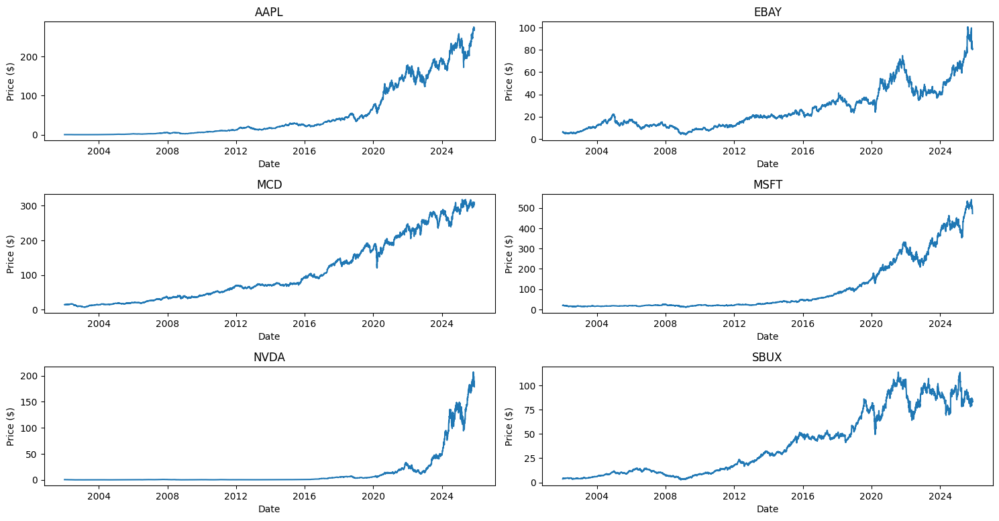

In [ ]:
# Import libraries
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from arch import arch_model
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.diagnostic import acorr_ljungbox
import numpy as np

import warnings
warnings.filterwarnings("ignore")

prices = data1['Close']

# Plot each stock
plt.figure(figsize=(15,10))
for i, t in enumerate(prices.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(prices.index, prices[t], label=t)
    plt.title(t)
    plt.xlabel("Date")
    plt.ylabel("Price ($)")
    plt.tight_layout()

plt.show()


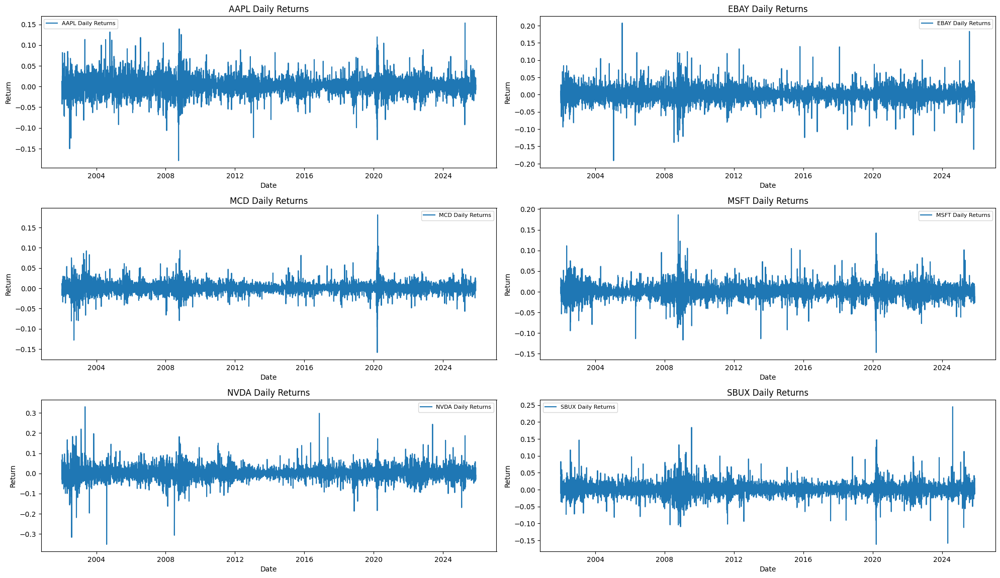

In [ ]:
# Compute daily returns for all tickers
returns = prices.pct_change().dropna()

# Plot each stock's returns
plt.figure(figsize=(20,15))
for i, t in enumerate(returns.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(returns.index, returns[t], label=f'{t} Daily Returns')
    plt.title(f'{t} Daily Returns')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.legend(fontsize=8)
    plt.tight_layout()

plt.show()


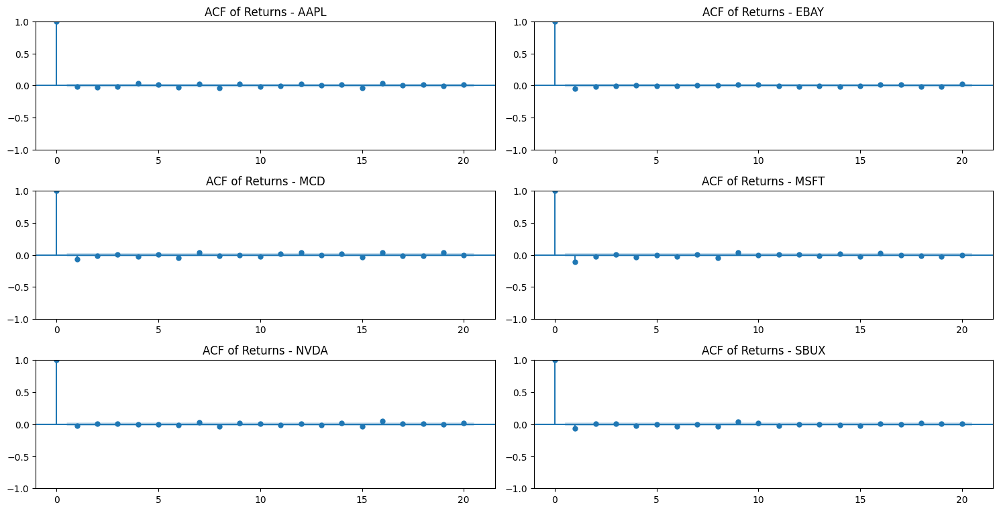

In [ ]:
plt.figure(figsize=(15,10))
for i, t in enumerate(returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(returns[t], lags=20, ax=ax)
    plt.title(f'ACF of Returns - {t}')

plt.tight_layout()
plt.show()




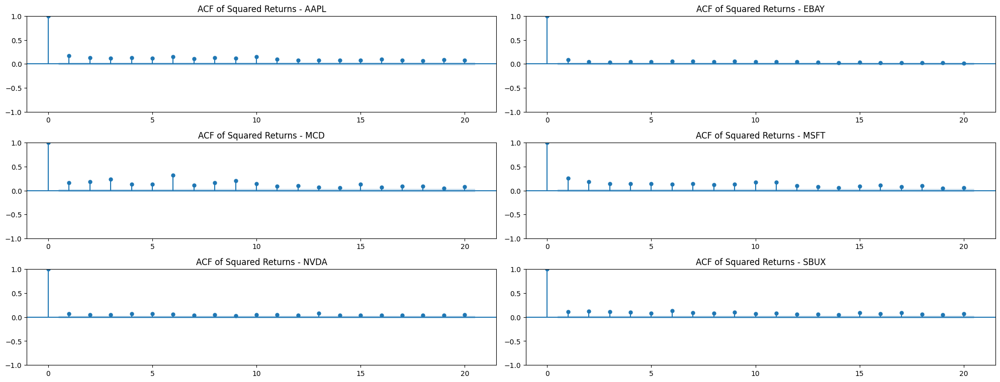

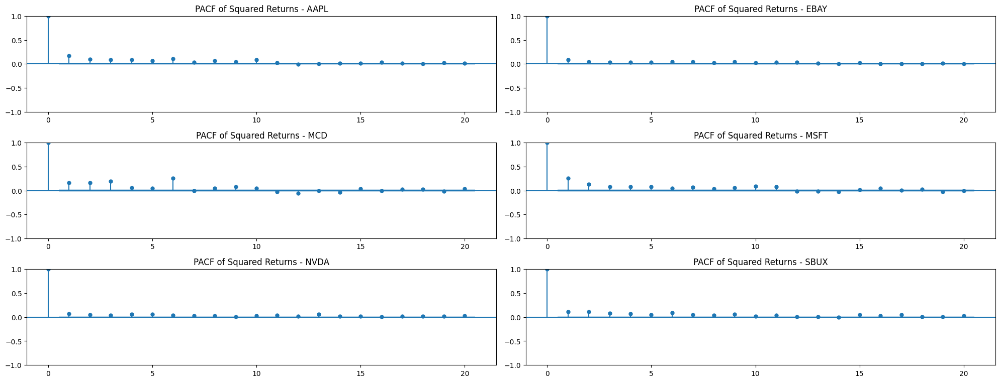

In [ ]:
# ACF of squared returns (for each stock)
squared_returns = returns ** 2

plt.figure(figsize=(20,10))
for i, t in enumerate(squared_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(squared_returns[t], lags=20, ax=ax)
    plt.title(f'ACF of Squared Returns - {t}')

plt.tight_layout()
plt.show()

# PACF of squared returns (for each stock)
plt.figure(figsize=(20,10))
for i, t in enumerate(squared_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_pacf(squared_returns[t], lags=20, ax=ax, method='ywm')
    plt.title(f'PACF of Squared Returns - {t}')

plt.tight_layout()
plt.show()


In [ ]:
# Find optimal ARCH order using AIC for each stock

for t in returns.columns:
    print(f"\n===== Testing ARCH order for {t} =====")
    best_aic = np.inf
    best_order = None

    for p in range(1, 30):  # ARCH(1) to ARCH(29)
        model = arch_model(returns[t] * 100, vol='ARCH', p=p)
        result = model.fit(disp='off')
        print(f"ARCH({p}) AIC: {result.aic:.4f}")

        if result.aic < best_aic:
            best_aic = result.aic
            best_order = p

    print(f"Selected ARCH order for {t}: {best_order}  (lowest AIC = {best_aic:.4f})")



===== Testing ARCH order for AAPL =====
ARCH(1) AIC: 25708.3497
ARCH(2) AIC: 25508.8523
ARCH(3) AIC: 25395.4000
ARCH(4) AIC: 25328.6425
ARCH(5) AIC: 25192.8982
ARCH(6) AIC: 25136.8276
ARCH(7) AIC: 25104.8927
ARCH(8) AIC: 25057.5283
ARCH(9) AIC: 25053.6233
ARCH(10) AIC: 25049.5663
ARCH(11) AIC: 25044.7279
ARCH(12) AIC: 25042.8506
ARCH(13) AIC: 25028.6085
ARCH(14) AIC: 25019.7587
ARCH(15) AIC: 25008.4716
ARCH(16) AIC: 25000.0382
ARCH(17) AIC: 25000.8694
ARCH(18) AIC: 24965.5162
ARCH(19) AIC: 24967.0291
ARCH(20) AIC: 24962.3643
ARCH(21) AIC: 24964.3643
ARCH(22) AIC: 24965.3807
ARCH(23) AIC: 24963.2608
ARCH(24) AIC: 24963.5618
ARCH(25) AIC: 24963.9731
ARCH(26) AIC: 24959.2581
ARCH(27) AIC: 24937.1942
ARCH(28) AIC: 24934.1764
ARCH(29) AIC: 24923.7554
Selected ARCH order for AAPL: 29  (lowest AIC = 24923.7554)

===== Testing ARCH order for EBAY =====
ARCH(1) AIC: 25992.1508
ARCH(2) AIC: 25957.6644
ARCH(3) AIC: 25943.5150
ARCH(4) AIC: 25913.5315
ARCH(5) AIC: 25905.4421
ARCH(6) AIC: 25893.140

In [ ]:
# Fit best ARCH model for each stock and compute standardized residuals
arch_results = {}
std_resid_all = {}
squared_resid_all = {}

for t in returns.columns:
    print(f"\n===== Fitting ARCH({best_order}) for {t} =====")

    # Fit model
    model = arch_model(returns[t] * 100, vol='ARCH', p=best_order)
    res = model.fit(disp='off')
    arch_results[t] = res

    # Standardized residuals
    std_resid = res.resid / res.conditional_volatility
    squared_resid = std_resid ** 2

    std_resid_all[t] = std_resid
    squared_resid_all[t] = squared_resid

    print(res.summary())



===== Fitting ARCH(23) for AAPL =====
                      Constant Mean - ARCH Model Results                      
Dep. Variable:                   AAPL   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       ARCH   Log-Likelihood:               -12456.6
Distribution:                  Normal   AIC:                           24963.3
Method:            Maximum Likelihood   BIC:                           25130.8
                                        No. Observations:                 6012
Date:                Sat, Nov 22 2025   Df Residuals:                     6011
Time:                        14:14:46   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
mu             0.1889  2.405e-0


===== Residual diagnostics for AAPL =====


<Figure size 600x600 with 0 Axes>

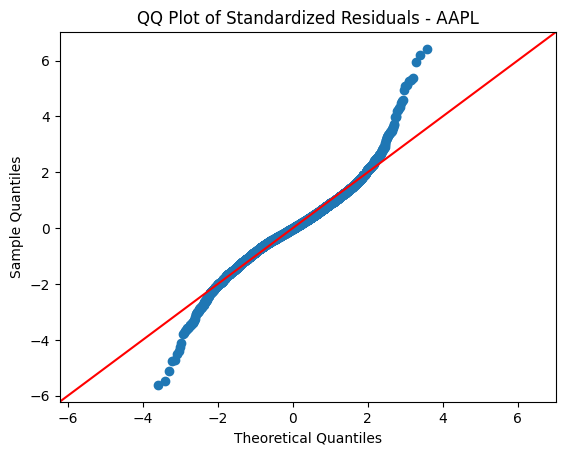

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1    1.432635   0.231335
2    2.759601   0.251629
3    4.600917   0.203463
4   11.191210   0.024497
5   11.719011   0.038848
6   12.751449   0.047157
7   13.799338   0.054868
8   20.582292   0.008344
9   20.613563   0.014481
10  20.669587   0.023519
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.313847   0.575329
2   0.477185   0.787736
3   0.691457   0.875212
4   0.816701   0.936195
5   1.652608   0.894815
6   2.207377   0.899672
7   2.483707   0.928319
8   2.669926   0.953336
9   2.779440   0.972401
10  2.874259   0.984230

===== Residual diagnostics for EBAY =====


<Figure size 600x600 with 0 Axes>

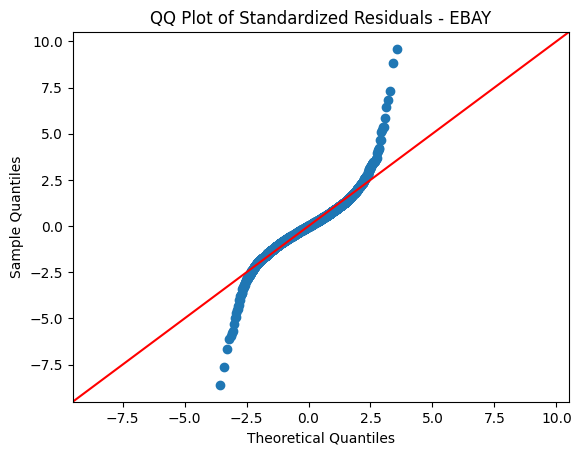

Ljung–Box Test on Standardized Residuals:
     lb_stat  lb_pvalue
1   6.844219   0.008893
2   7.409333   0.024608
3   7.849264   0.049232
4   7.851677   0.097165
5   7.861605   0.164030
6   8.148478   0.227426
7   8.469055   0.293053
8   8.696109   0.368577
9   9.374115   0.403481
10  9.477212   0.487490
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.616440   0.432373
2   0.634333   0.728210
3   0.667471   0.880827
4   1.351868   0.852516
5   1.384275   0.926026
6   1.396233   0.966087
7   2.169767   0.949849
8   2.176802   0.975106
9   2.199230   0.987911
10  2.414601   0.992063

===== Residual diagnostics for MCD =====


<Figure size 600x600 with 0 Axes>

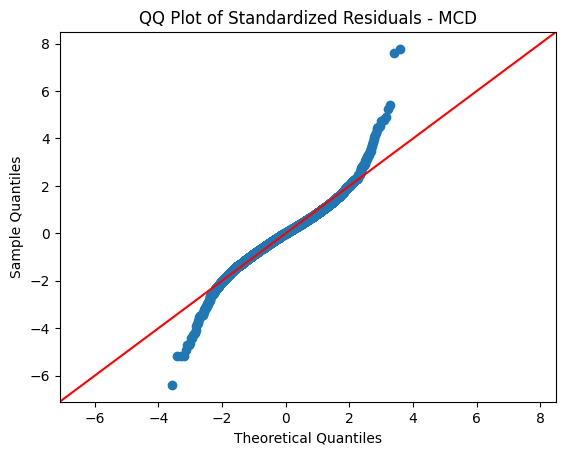

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1    5.796912   0.016054
2    8.661425   0.013158
3    8.831109   0.031623
4   10.709386   0.030032
5   10.842905   0.054585
6   11.252762   0.080872
7   11.281174   0.126816
8   11.760552   0.162211
9   13.230385   0.152456
10  13.426480   0.200794
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.657713   0.417368
2   0.968783   0.616072
3   1.310111   0.726734
4   1.575835   0.813129
5   1.576858   0.904034
6   1.975956   0.921897
7   2.007880   0.959403
8   2.012985   0.980611
9   2.015642   0.991218
10  2.075171   0.995731

===== Residual diagnostics for MSFT =====


<Figure size 600x600 with 0 Axes>

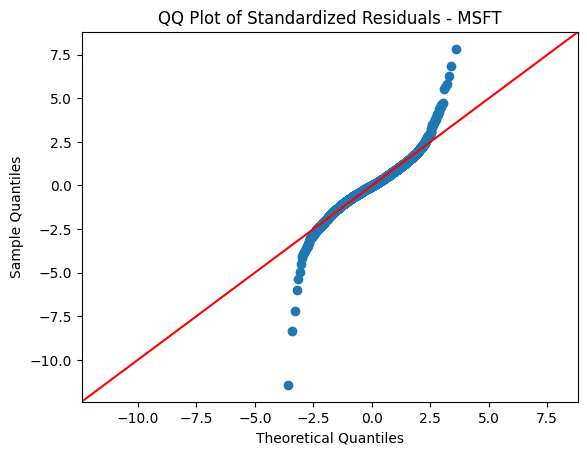

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1   10.542800   0.001166
2   11.841562   0.002683
3   11.854602   0.007898
4   12.626364   0.013253
5   14.952504   0.010567
6   18.176980   0.005805
7   18.502546   0.009897
8   23.389880   0.002898
9   23.503630   0.005159
10  25.075819   0.005204
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.429021   0.512470
2   0.710928   0.700848
3   0.716725   0.869263
4   1.371489   0.849135
5   1.756100   0.881758
6   2.034195   0.916527
7   2.674833   0.913367
8   3.195535   0.921494
9   3.209061   0.955426
10  3.235732   0.975320

===== Residual diagnostics for NVDA =====


<Figure size 600x600 with 0 Axes>

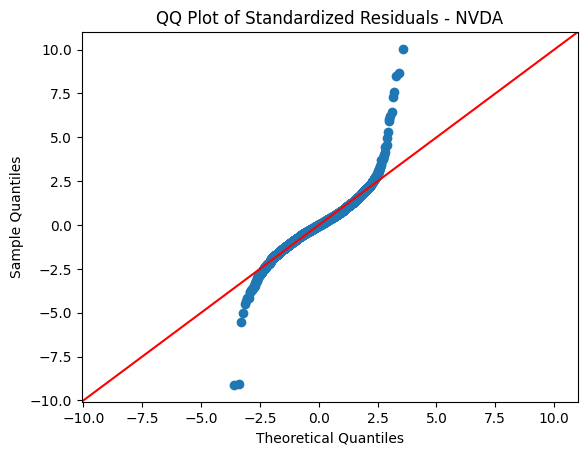

Ljung–Box Test on Standardized Residuals:
     lb_stat  lb_pvalue
1   0.332327   0.564292
2   0.532143   0.766384
3   0.654743   0.883794
4   0.688542   0.952734
5   1.585564   0.902990
6   1.802133   0.936967
7   3.371528   0.848640
8   4.068212   0.850917
9   4.988317   0.835325
10  7.200046   0.706434
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.200012   0.654711
2   0.201886   0.903985
3   0.247691   0.969546
4   0.707574   0.950392
5   0.940845   0.967195
6   1.775100   0.939177
7   2.106724   0.953698
8   3.134204   0.925655
9   3.960757   0.913976
10  3.989158   0.947835

===== Residual diagnostics for SBUX =====


<Figure size 600x600 with 0 Axes>

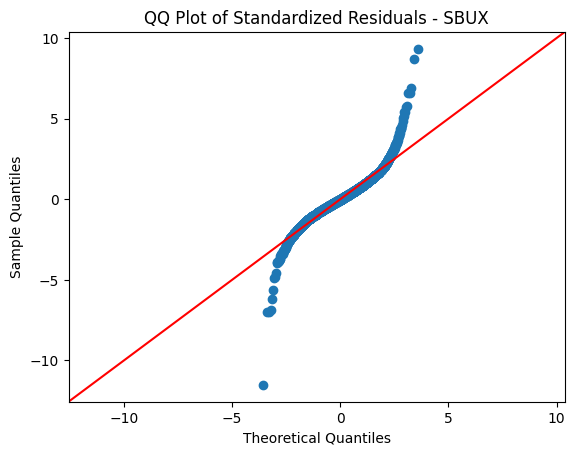

Ljung–Box Test on Standardized Residuals:
      lb_stat  lb_pvalue
1    2.579518   0.108255
2    2.730735   0.255287
3    4.907034   0.178733
4    6.155807   0.187811
5    6.277587   0.280138
6    8.153309   0.227085
7   10.684727   0.152975
8   12.129414   0.145523
9   14.555583   0.103889
10  17.143830   0.071241
Ljung–Box Test on Squared Standardized Residuals:
     lb_stat  lb_pvalue
1   0.294539   0.587326
2   0.781994   0.676382
3   0.803986   0.848513
4   0.893234   0.925530
5   1.677250   0.891753
6   2.219265   0.898469
7   2.251150   0.944643
8   2.290733   0.970776
9   2.296595   0.985863
10  2.473742   0.991253


In [ ]:
# Residual analysis for each stock (minimal changes, same style)

for t in std_resid_all.keys():
    print(f"\n===== Residual diagnostics for {t} =====")
    sr = std_resid_all[t].dropna()
    sr2 = (sr ** 2)

    # QQ Plot
    plt.figure(figsize=(6,6))
    qqplot(sr, line='45', fit=True)
    plt.title(f'QQ Plot of Standardized Residuals - {t}')
    plt.show()

    # Ljung-Box test on standardized residuals
    lb_resid = acorr_ljungbox(sr, lags=10, return_df=True)
    print("Ljung–Box Test on Standardized Residuals:")
    print(lb_resid)

    # Ljung-Box test on squared standardized residuals
    lb_sq = acorr_ljungbox(sr2, lags=10, return_df=True)
    print("Ljung–Box Test on Squared Standardized Residuals:")
    print(lb_sq)


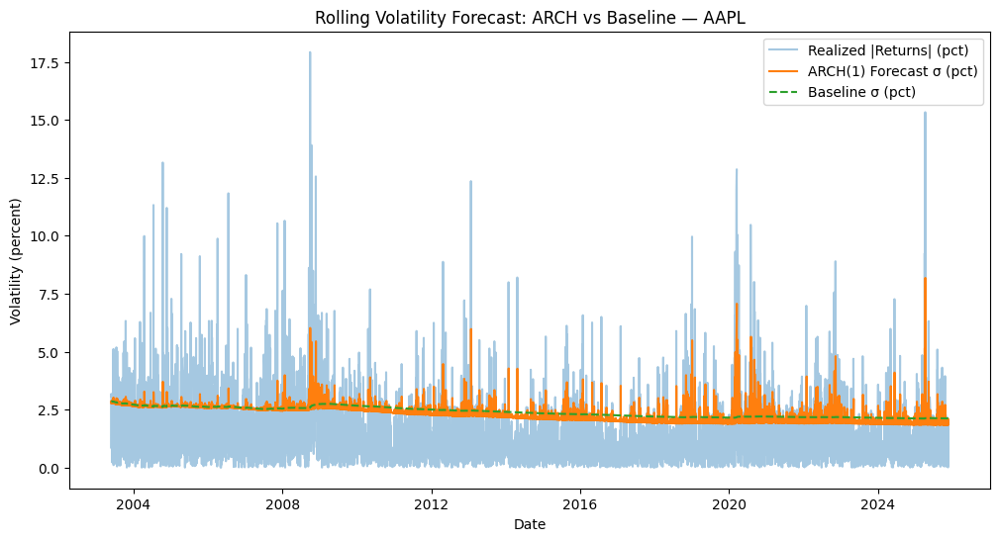

AAPL: RMSE ARCH(1) = 1.674248 | RMSE Baseline = 1.738882 | Improvement = 3.72%


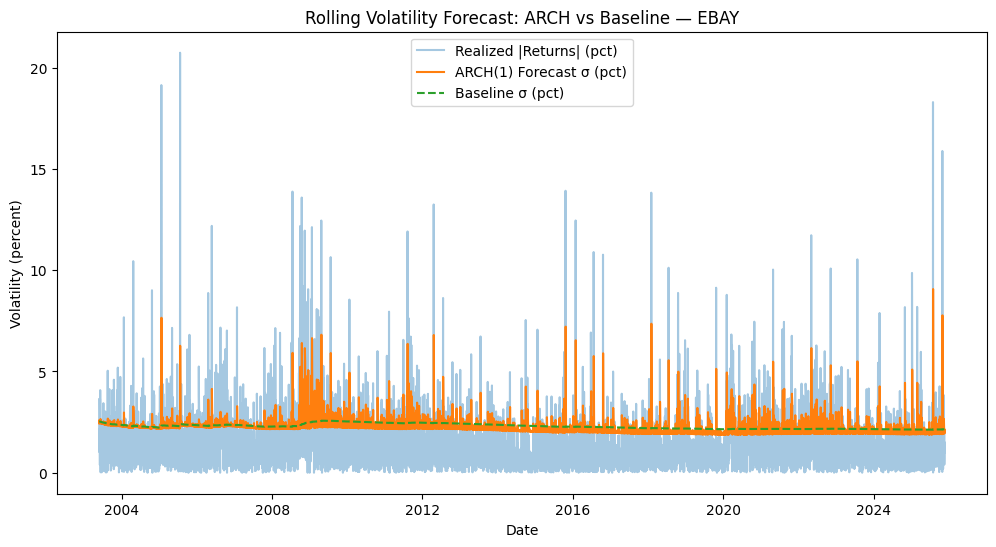

EBAY: RMSE ARCH(1) = 1.709147 | RMSE Baseline = 1.735968 | Improvement = 1.55%


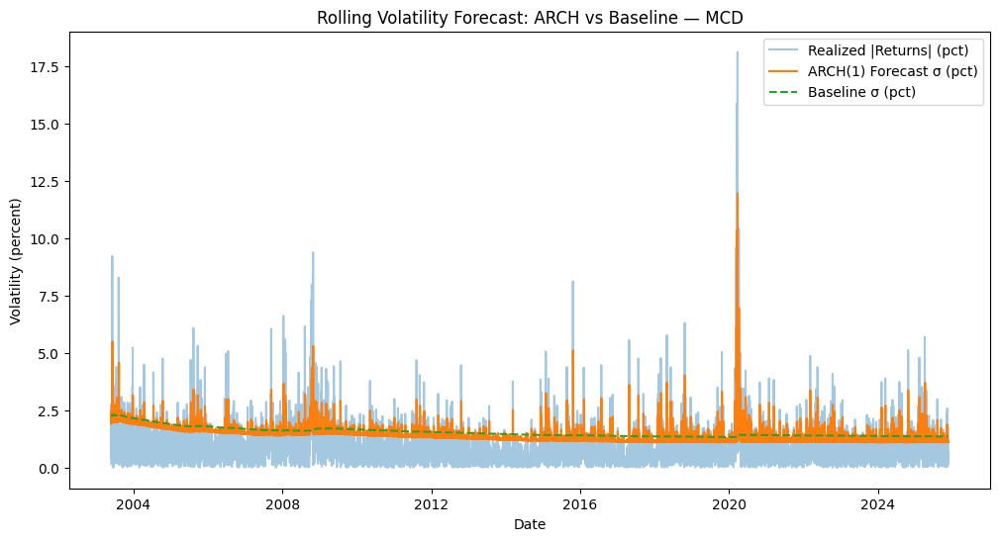

MCD: RMSE ARCH(1) = 1.096103 | RMSE Baseline = 1.149718 | Improvement = 4.66%


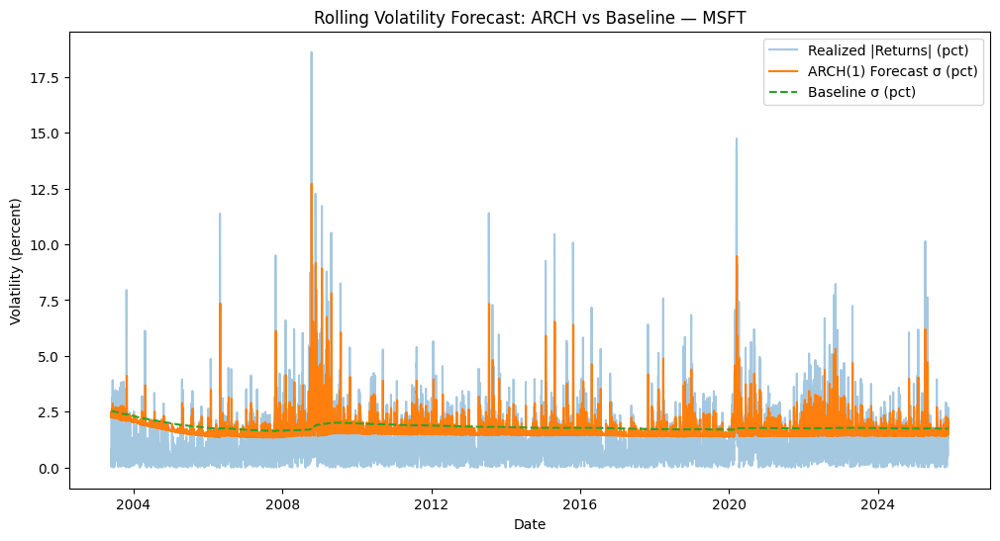

MSFT: RMSE ARCH(1) = 1.366323 | RMSE Baseline = 1.425723 | Improvement = 4.17%


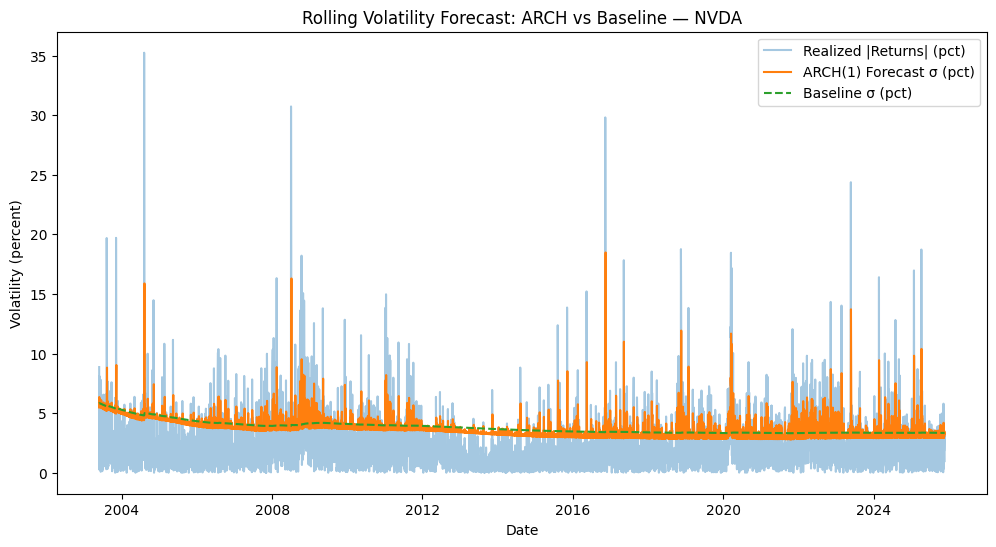

NVDA: RMSE ARCH(1) = 2.737653 | RMSE Baseline = 2.802734 | Improvement = 2.32%


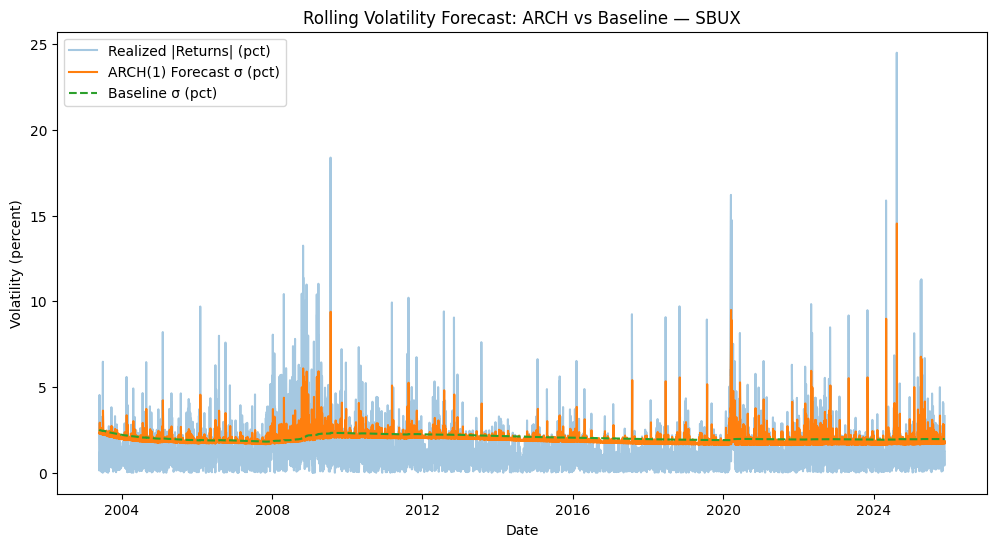

SBUX: RMSE ARCH(1) = 1.594193 | RMSE Baseline = 1.629834 | Improvement = 2.19%

Summary (percent units):
      rmse_arch  rmse_baseline  improvement_%
AAPL   1.674248       1.738882       3.716972
EBAY   1.709147       1.735968       1.545056
MCD    1.096103       1.149718       4.663319
MSFT   1.366323       1.425723       4.166295
NVDA   2.737653       2.802734       2.322052
SBUX   1.594193       1.629834       2.186772


In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from arch import arch_model

# returns is a DataFrame with columns = tickers
# We'll run the exact same rolling ARCH forecast for each ticker.
window = 350

results = {}  # store RMSEs per ticker

for t in returns.columns:
    r = returns[t].dropna()                 # Series
    r_pct = r * 100                         # scale for ARCH (percent)

    rolling_vol = []
    baseline_vol = []
    realized_vol = []

    for i in range(window, len(r_pct)):
        train = r_pct.iloc[:i]              # training series in percent
        test = r_pct.iloc[i]                # one-step ahead actual (percent)

        # === Baseline forecast: constant σ from training window ===
        baseline_std = train.std(ddof=1)
        baseline_vol.append(baseline_std)

        # === ARCH rolling forecast ===
        model = arch_model(train, vol='ARCH', p=1)
        res = model.fit(disp='off')
        f = res.forecast(horizon=1)
        arch_forecast = np.sqrt(f.variance.values[-1, 0])  # σ̂_{t+1} in percent
        rolling_vol.append(arch_forecast)

        # === Realized volatility proxy: |return| (percent)
        realized_vol.append(abs(test))

    # Convert lists to Series with aligned dates
    forecast_dates = r.index[window:]
    rolling_vol_series = pd.Series(rolling_vol, index=forecast_dates)
    baseline_series    = pd.Series(baseline_vol, index=forecast_dates)
    realized_series    = pd.Series(realized_vol, index=forecast_dates)

    # === Plot per ticker ===
    plt.figure(figsize=(12,6))
    plt.plot(realized_series, alpha=0.4, label='Realized |Returns| (pct)')
    plt.plot(rolling_vol_series, label='ARCH(1) Forecast σ (pct)')
    plt.plot(baseline_series, linestyle='--', label='Baseline σ (pct)')
    plt.title(f'Rolling Volatility Forecast: ARCH vs Baseline — {t}')
    plt.xlabel('Date'); plt.ylabel('Volatility (percent)')
    plt.legend(); plt.show()

    # === RMSEs (on percent scale, consistent across series) ===
    rmse_arch = np.sqrt(mean_squared_error(realized_series, rolling_vol_series))
    rmse_base = np.sqrt(mean_squared_error(realized_series, baseline_series))
    improvement = (1 - rmse_arch / rmse_base) * 100

    print(f"{t}: RMSE ARCH(1) = {rmse_arch:.6f} | RMSE Baseline = {rmse_base:.6f} | Improvement = {improvement:.2f}%")
    results[t] = {"rmse_arch": rmse_arch, "rmse_baseline": rmse_base, "improvement_%": improvement}

# Optional: quick summary table
summary = pd.DataFrame(results).T
print("\nSummary (percent units):")
print(summary)


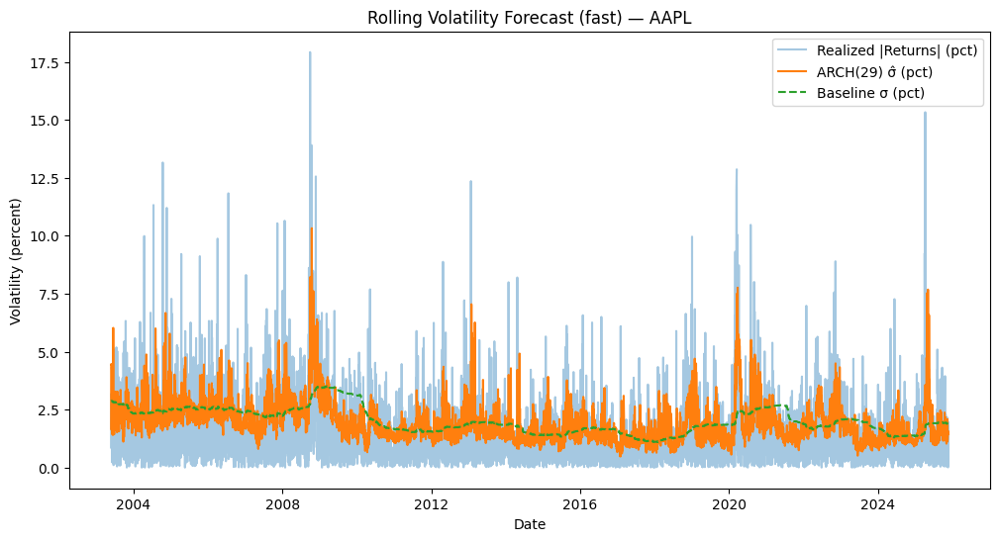

AAPL: RMSE ARCH(29)=1.570914 | Baseline=1.571696 | +0.05%


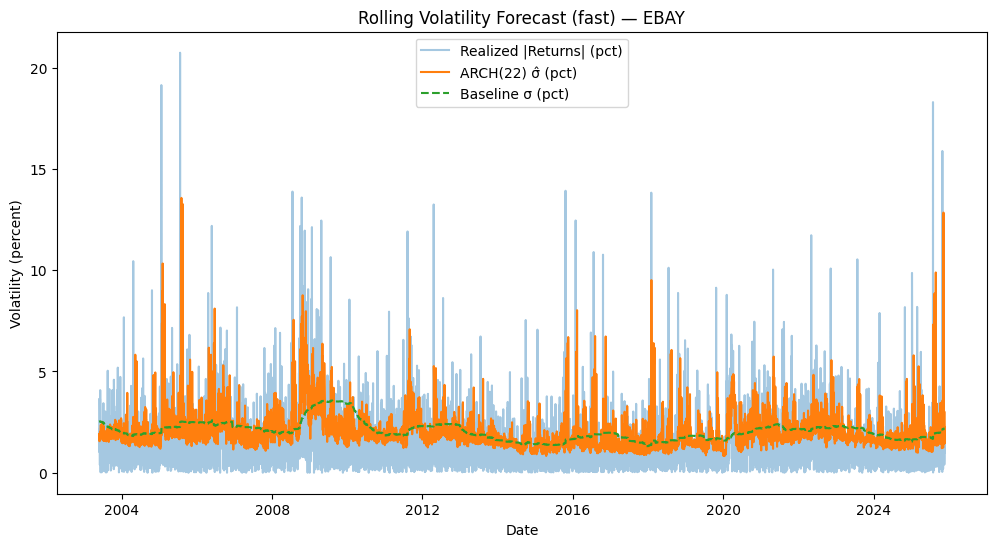

EBAY: RMSE ARCH(22)=1.724345 | Baseline=1.640591 | +-5.11%


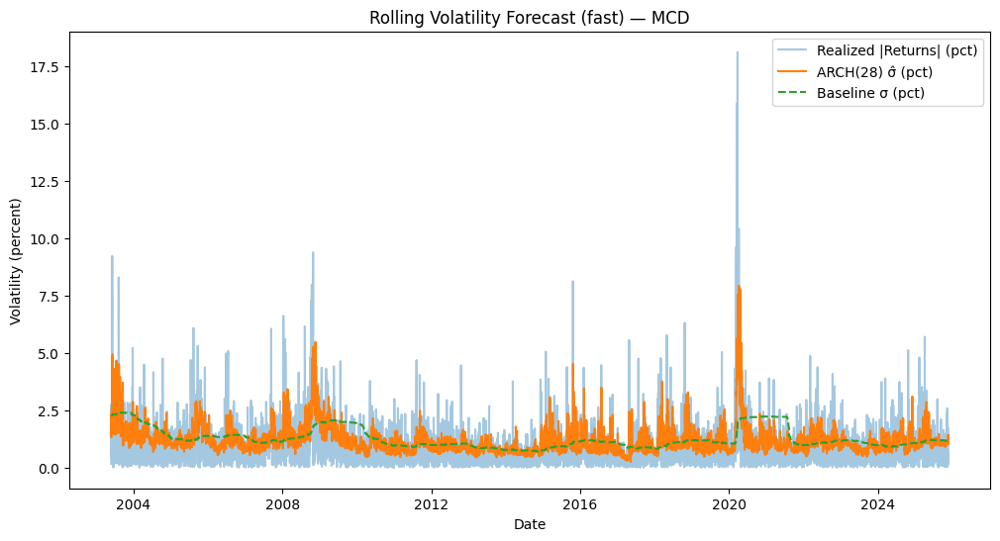

MCD: RMSE ARCH(28)=0.982483 | Baseline=1.046506 | +6.12%


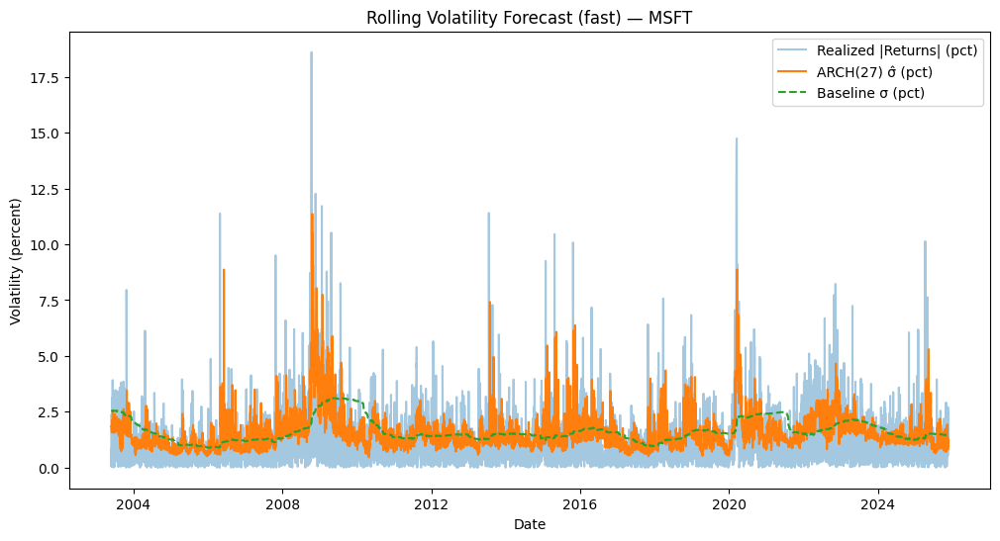

MSFT: RMSE ARCH(27)=1.321034 | Baseline=1.358755 | +2.78%


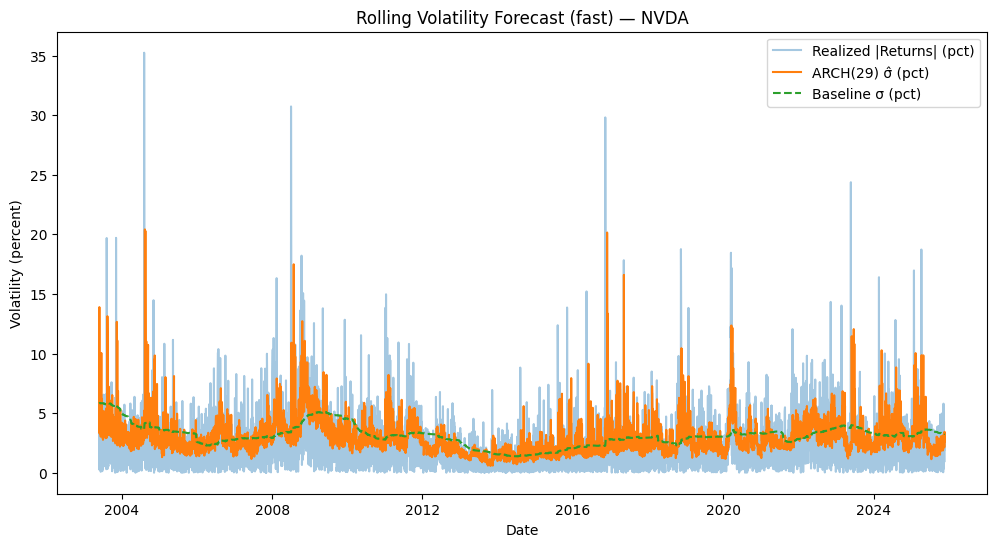

NVDA: RMSE ARCH(29)=2.506535 | Baseline=2.458249 | +-1.96%


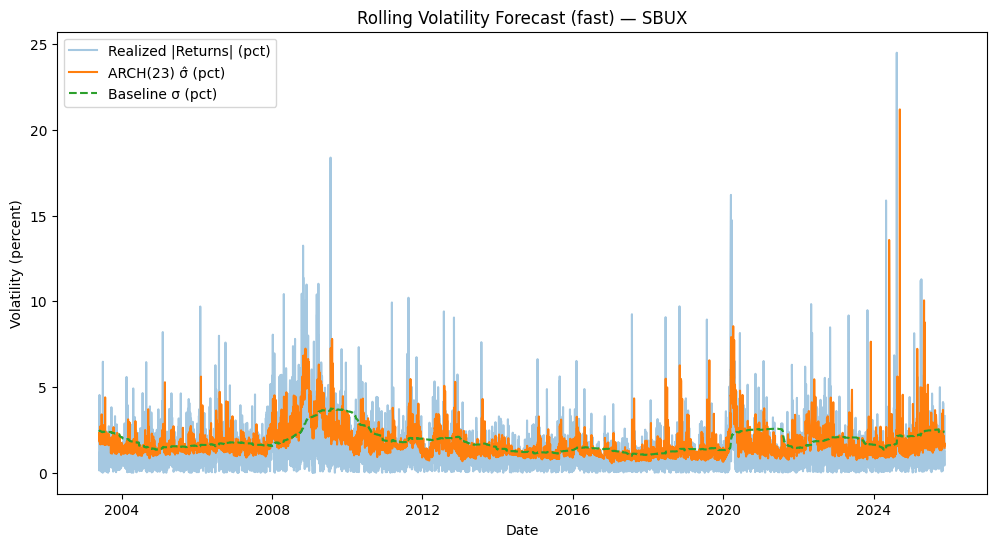

SBUX: RMSE ARCH(23)=1.537341 | Baseline=1.551858 | +0.94%

Summary (percent units):
      rmse_arch  rmse_baseline  improvement_%
AAPL   1.570914       1.571696       0.049720
EBAY   1.724345       1.640591      -5.105109
MCD    0.982483       1.046506       6.117818
MSFT   1.321034       1.358755       2.776163
NVDA   2.506535       2.458249      -1.964221
SBUX   1.537341       1.551858       0.935486


In [ ]:
from collections import deque
best_p = {
    'SBUX': 23, 'NVDA': 29, 'MSFT': 27, 'EBAY': 22,
    'MCD': 28, 'CMG': 16, 'AAPL': 29
}

window = 350
refit_every = 20  # try 20–60 for speed/accuracy tradeoff

results = {}

for t in returns.columns:
    p = best_p.get(t, 1)  # fallback p=1 if missing
    r = returns[t].dropna()
    r_pct = r * 100  # scale for ARCH

    # --- initial fit on the first window ---
    init = r_pct.iloc[:window]
    am = arch_model(init, mean='Constant', vol='ARCH', p=p, dist='normal')
    res = am.fit(disp='off')

    # params
    mu = res.params.get('mu', 0.0)
    omega = res.params['omega']
    alphas = np.array([res.params[f'alpha[{j}]'] for j in range(1, p+1)])

    # keep last p squared residuals in a deque (most recent last)
    eps = res.resid  # in percent units
    eps_sq_hist = deque((eps.tail(p).values**2).tolist(), maxlen=p)

    rolling_vol, baseline_vol, realized_vol = [], [], []

    for i in range(window, len(r_pct)):
        # periodic refit on the latest window points
        if (i - window) % refit_every == 0:
            train = r_pct.iloc[i-window:i]
            am = arch_model(train, mean='Constant', vol='ARCH', p=p, dist='normal')
            res = am.fit(disp='off')
            mu = res.params.get('mu', 0.0)
            omega = res.params['omega']
            alphas = np.array([res.params[f'alpha[{j}]'] for j in range(1, p+1)])
            eps = res.resid
            eps_sq_hist = deque((eps.tail(p).values**2).tolist(), maxlen=p)

        # baseline (constant sigma) from rolling window
        baseline_vol.append(r_pct.iloc[i-window:i].std(ddof=1))

        # fast 1-step ARCH(p) forecast via recursion
        # sigma_{t+1}^2 = omega + sum_{j=1..p} alpha_j * eps_{t+1-j}^2
        sigma2_next = omega + np.dot(alphas, np.array(list(eps_sq_hist))[::-1])
        sigma_next = float(np.sqrt(sigma2_next))
        rolling_vol.append(sigma_next)

        # realized proxy = |r_{t+1}|
        rt1 = float(r_pct.iloc[i])
        realized_vol.append(abs(rt1))

        # update residual history with new epsilon^2
        eps_new = rt1 - mu
        eps_sq_hist.append(eps_new**2)

    # align to dates
    dates = r_pct.index[window:]
    rolling_series  = pd.Series(rolling_vol, index=dates)
    baseline_series = pd.Series(baseline_vol, index=dates)
    realized_series = pd.Series(realized_vol, index=dates)

    # plot
    plt.figure(figsize=(12,6))
    plt.plot(realized_series, alpha=0.4, label='Realized |Returns| (pct)')
    plt.plot(rolling_series, label=f'ARCH({p}) σ̂ (pct)')
    plt.plot(baseline_series, linestyle='--', label='Baseline σ (pct)')
    plt.title(f'Rolling Volatility Forecast (fast) — {t}')
    plt.xlabel('Date'); plt.ylabel('Volatility (percent)'); plt.legend(); plt.show()

    # RMSEs
    rmse_arch = np.sqrt(mean_squared_error(realized_series, rolling_series))
    rmse_base = np.sqrt(mean_squared_error(realized_series, baseline_series))
    improvement = (1 - rmse_arch / rmse_base) * 100

    print(f"{t}: RMSE ARCH({p})={rmse_arch:.6f} | Baseline={rmse_base:.6f} | +{improvement:.2f}%")
    results[t] = {"rmse_arch": rmse_arch, "rmse_baseline": rmse_base, "improvement_%": improvement}

summary = pd.DataFrame(results).T
print("\nSummary (percent units):")
print(summary)

# **GARCH**

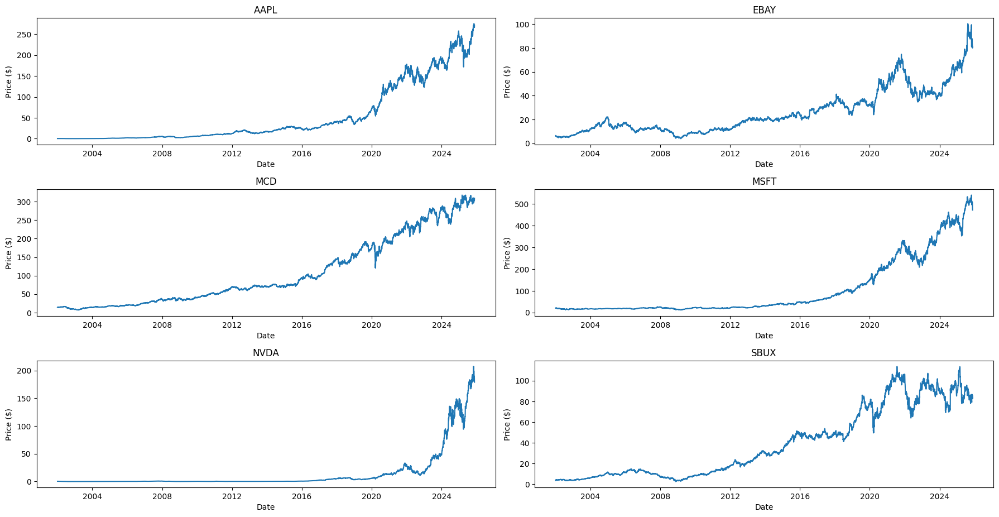

In [ ]:
# Plot each stock
plt.figure(figsize=(18,12))
for i, t in enumerate(prices.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(prices.index, prices[t], label=t)
    plt.title(t)
    plt.xlabel("Date")
    plt.ylabel("Price ($)")
    plt.tight_layout()

plt.show()

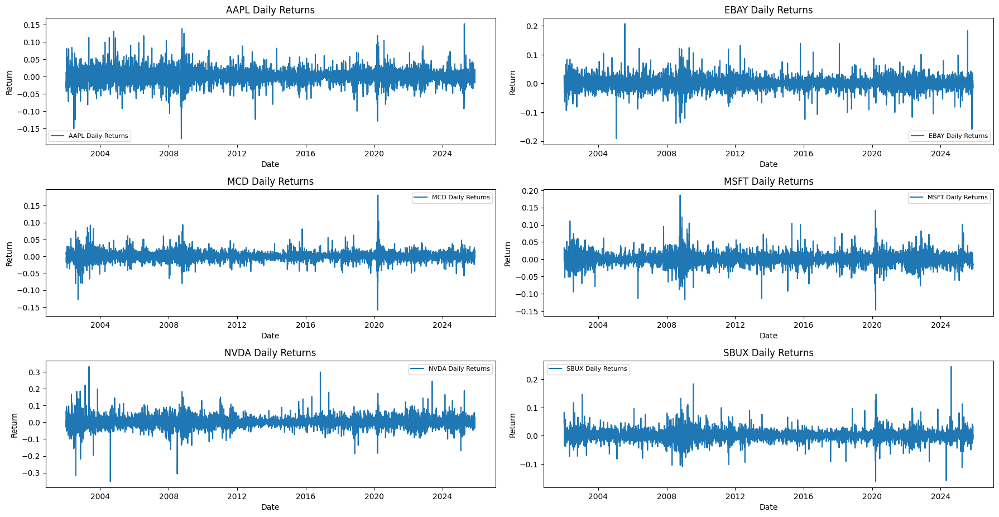

In [ ]:
# Compute daily returns for all tickers
returns = prices.pct_change().dropna()

# Plot each stock's returns
plt.figure(figsize=(18,12))
for i, t in enumerate(returns.columns, 1):
    plt.subplot(4, 2, i)
    plt.plot(returns.index, returns[t], label=f'{t} Daily Returns')
    plt.title(f'{t} Daily Returns')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.legend(fontsize=8)
    plt.tight_layout()

plt.show()

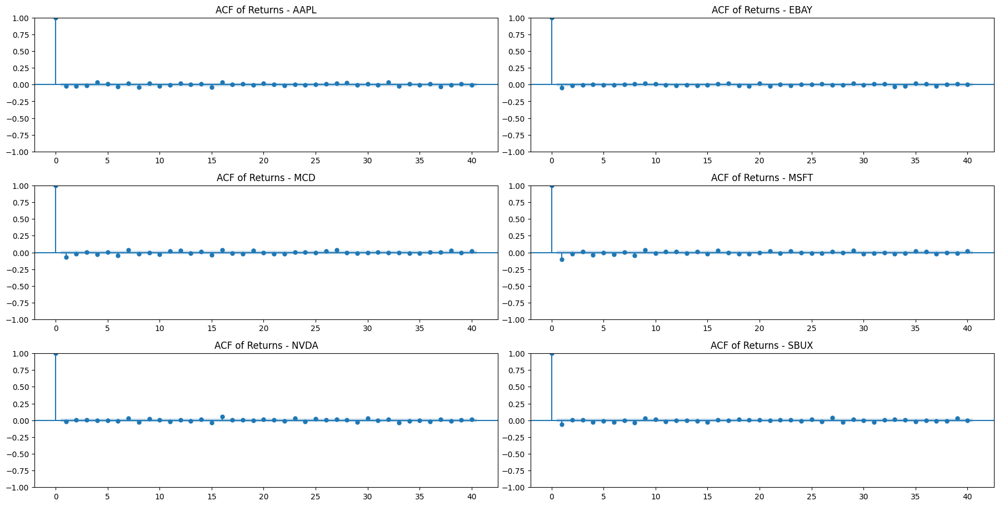

In [ ]:
# Plot ACF of returns for all tickers
plt.figure(figsize=(18,12))
for i, t in enumerate(returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(returns[t].dropna(), lags=40, alpha=0.05, ax=ax)
    plt.title(f"ACF of Returns - {t}")

plt.tight_layout()
plt.show()


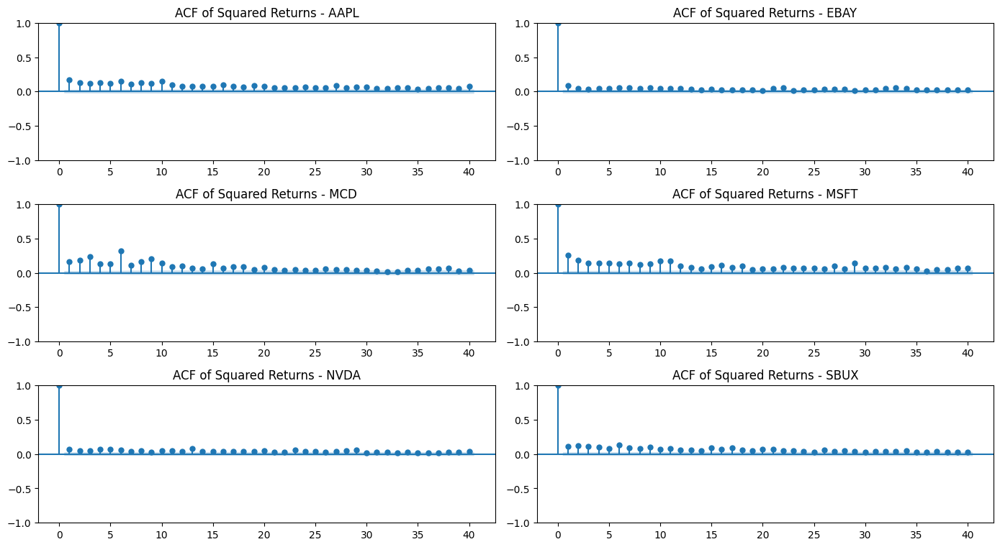

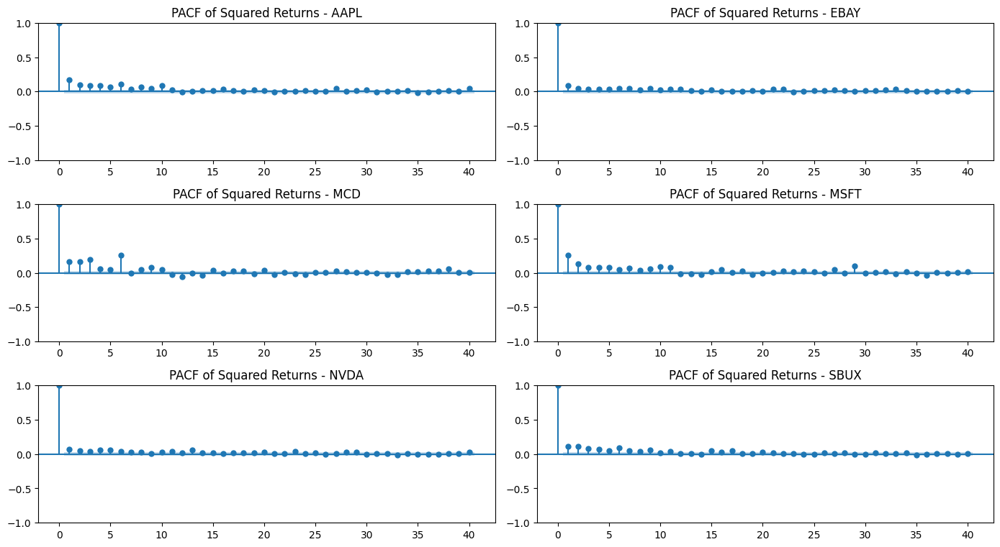

In [ ]:
# ACF and PACF of squared returns for all tickers

sq_returns = (returns ** 2).dropna()

# ACF subplots
plt.figure(figsize=(14,10))
for i, t in enumerate(sq_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_acf(sq_returns[t], lags=40, alpha=0.05, ax=ax)
    plt.title(f"ACF of Squared Returns - {t}")
plt.tight_layout()
plt.show()

# PACF subplots
plt.figure(figsize=(14,10))
for i, t in enumerate(sq_returns.columns, 1):
    ax = plt.subplot(4, 2, i)
    plot_pacf(sq_returns[t], lags=40, alpha=0.05, method='ywm', ax=ax)
    plt.title(f"PACF of Squared Returns - {t}")
plt.tight_layout()
plt.show()


In [ ]:
# Split train/test for ALL tickers (column-wise)
train_frac = 0.80
n = len(returns)
n_train = int(np.floor(train_frac * n))
n_test = n - n_train

print(f"Total obs: {n}, Train: {n_train}, Test: {n_test}")

returns_train = returns.iloc[:n_train, :]    # all tickers
returns_test  = returns.iloc[n_train:, :]    # all tickers


Total obs: 6012, Train: 4809, Test: 1203



===== Searching best ARCH(q) for AAPL =====

AIC results for ARCH(1..10):
             AIC
q               
1   20990.082725
2   20824.194271
3   20737.144276
4   20699.286280
5   20587.447153
6   20537.602871
7   20508.268045
8   20465.330764
9   20464.723018
10  20458.416313
Best ARCH order for AAPL: q = 10 (AIC = 20458.416)


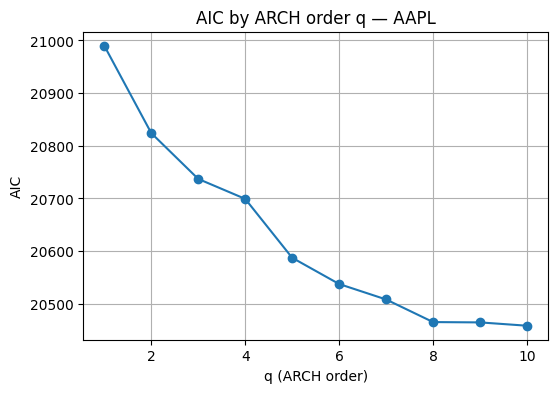


===== Searching best ARCH(q) for EBAY =====

AIC results for ARCH(1..10):
             AIC
q               
1   20816.302171
2   20775.852173
3   20759.117473
4   20734.447029
5   20719.017685
6   20698.458431
7   20673.949678
8   20644.472264
9   20626.585971
10  20606.439295
Best ARCH order for EBAY: q = 10 (AIC = 20606.439)


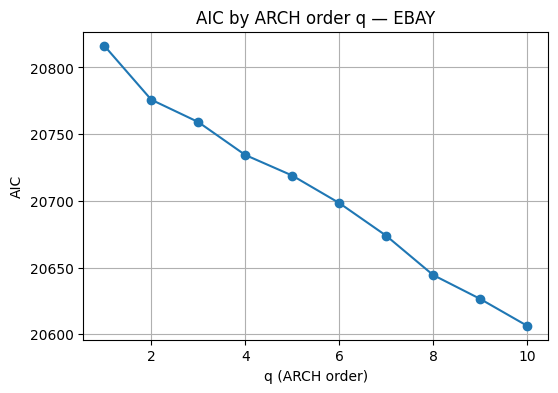


===== Searching best ARCH(q) for MCD =====

AIC results for ARCH(1..10):
             AIC
q               
1   16252.215203
2   15966.238288
3   15792.939205
4   15758.127933
5   15735.429083
6   15689.209828
7   15671.336022
8   15646.668382
9   15620.508329
10  15607.812989
Best ARCH order for MCD: q = 10 (AIC = 15607.813)


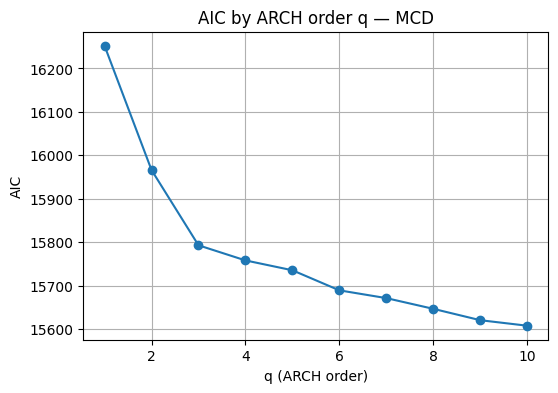


===== Searching best ARCH(q) for MSFT =====

AIC results for ARCH(1..10):
             AIC
q               
1   18420.809357
2   18281.959509
3   18175.788483
4   18047.667554
5   17979.739369
6   17931.025465
7   17901.392688
8   17881.365884
9   17883.327354
10  17879.596015
Best ARCH order for MSFT: q = 10 (AIC = 17879.596)


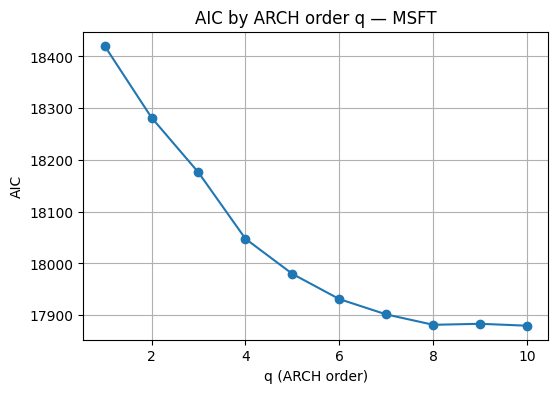


===== Searching best ARCH(q) for NVDA =====

AIC results for ARCH(1..10):
             AIC
q               
1   24928.588575
2   24835.379759
3   24768.218000
4   24634.167785
5   24451.637694
6   24404.075719
7   24380.230544
8   24295.973969
9   24297.335521
10  24293.210349
Best ARCH order for NVDA: q = 10 (AIC = 24293.210)


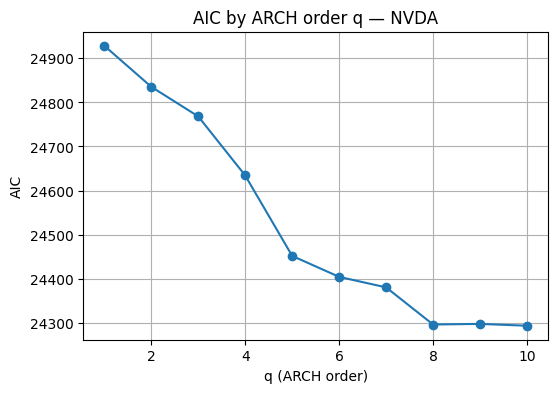


===== Searching best ARCH(q) for SBUX =====

AIC results for ARCH(1..10):
             AIC
q               
1   19674.336459
2   19312.244023
3   19236.479651
4   19174.953851
5   19039.546107
6   18998.374290
7   18983.802173
8   18977.097452
9   18975.228796
10  18965.062876
Best ARCH order for SBUX: q = 10 (AIC = 18965.063)


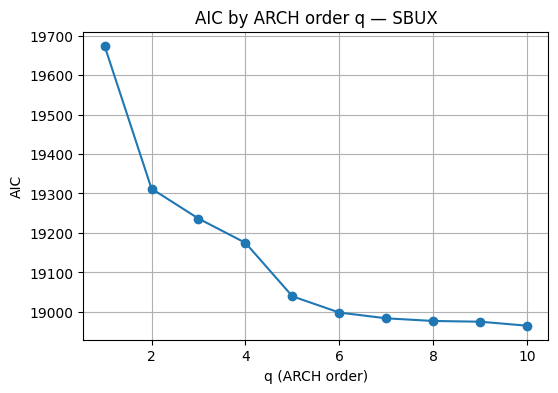


==== Summary of best ARCH orders per ticker ====
AAPL: q=10, AIC=20458.416
EBAY: q=10, AIC=20606.439
MCD: q=10, AIC=15607.813
MSFT: q=10, AIC=17879.596
NVDA: q=10, AIC=24293.210
SBUX: q=10, AIC=18965.063


In [ ]:
# Find best ARCH(q) order by AIC for each ticker separately

best_arch_orders = {}

for t in returns_train.columns:
    print(f"\n===== Searching best ARCH(q) for {t} =====")

    best_aic = np.inf
    best_q = None
    aic_results = []

    # Try q = 1 … 10
    for q in range(1, 11):
        try:
            am = arch_model(returns_train[t] * 100, mean='Zero', vol='ARCH', p=q)
            res = am.fit(disp='off')
            aic = res.aic
            aic_results.append((q, aic))

            if aic < best_aic:
                best_aic = aic
                best_q = q

        except Exception as e:
            print(f"ARCH({q}) fit failed for {t}: {e}")

    # store and print results for this ticker
    best_arch_orders[t] = (best_q, best_aic)

    print("\nAIC results for ARCH(1..10):")
    print(pd.DataFrame(aic_results, columns=['q','AIC']).set_index('q'))
    print(f"Best ARCH order for {t}: q = {best_q} (AIC = {best_aic:.3f})")

    # Plot AIC vs q for this ticker
    aic_df = pd.DataFrame(aic_results, columns=['q','AIC']).set_index('q')
    plt.figure(figsize=(6,4))
    plt.plot(aic_df.index, aic_df['AIC'], marker='o')
    plt.title(f"AIC by ARCH order q — {t}")
    plt.xlabel("q (ARCH order)")
    plt.ylabel("AIC")
    plt.grid(True)
    plt.show()

print("\n==== Summary of best ARCH orders per ticker ====")
for t, (q, aic) in best_arch_orders.items():
    print(f"{t}: q={q}, AIC={aic:.3f}")


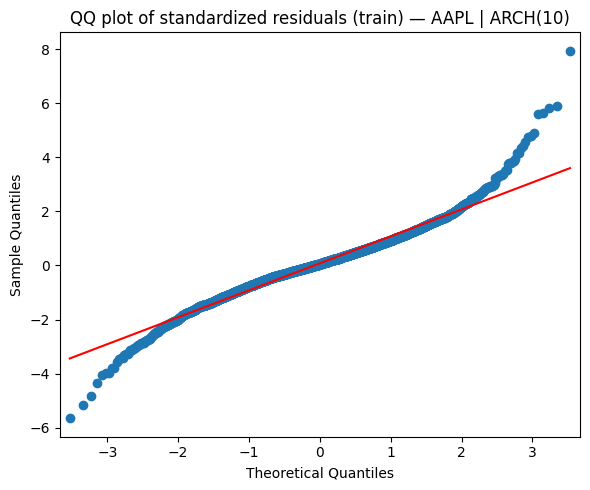


[AAPL] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1    0.701126   0.402406
2    2.062789   0.356510
3    2.623217   0.453434
4   10.518634   0.032541
5   11.109595   0.049250
6   13.785284   0.032129
7   14.917242   0.037075
8   20.935295   0.007321
9   21.040984   0.012470
10  21.052804   0.020728

[AAPL] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.304152   0.581291
2   0.472493   0.789586
3   1.000631   0.801099
4   1.002056   0.909484
5   2.501331   0.776295
6   3.459712   0.749322
7   4.945825   0.666574
8   5.952554   0.652547
9   6.410468   0.698237
10  6.974275   0.727871


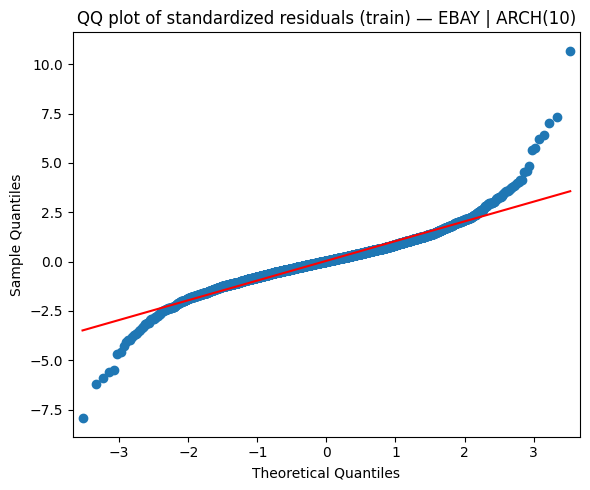


[EBAY] Ljung–Box on standardized residuals (train):
     lb_stat  lb_pvalue
1   5.789417   0.016123
2   5.858425   0.053439
3   5.898955   0.116631
4   5.962013   0.202003
5   6.124898   0.294255
6   6.202347   0.400909
7   6.570066   0.474972
8   6.657521   0.573993
9   6.770049   0.661047
10  6.772428   0.746740

[EBAY] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.737994   0.390304
2   0.806657   0.668093
3   0.838231   0.840303
4   1.131265   0.889280
5   1.162392   0.948434
6   1.628863   0.950480
7   2.211921   0.947186
8   3.214742   0.920167
9   3.823731   0.922626
10  4.836427   0.901833


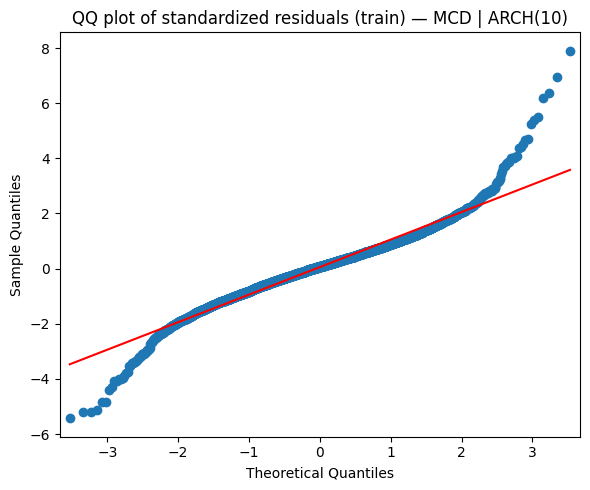


[MCD] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1    6.414077   0.011322
2    9.123808   0.010442
3    9.181537   0.026972
4    9.782324   0.044258
5   10.025074   0.074528
6   10.082504   0.121220
7   10.151996   0.180122
8   10.856391   0.209970
9   11.477710   0.244379
10  11.708797   0.305018

[MCD] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   1.212412   0.270855
2   1.938001   0.379462
3   3.514988   0.318823
4   3.812899   0.431919
5   4.714573   0.451697
6   6.033630   0.419433
7   7.075478   0.421064
8   7.812571   0.451990
9   8.716476   0.463847
10  8.784124   0.552706


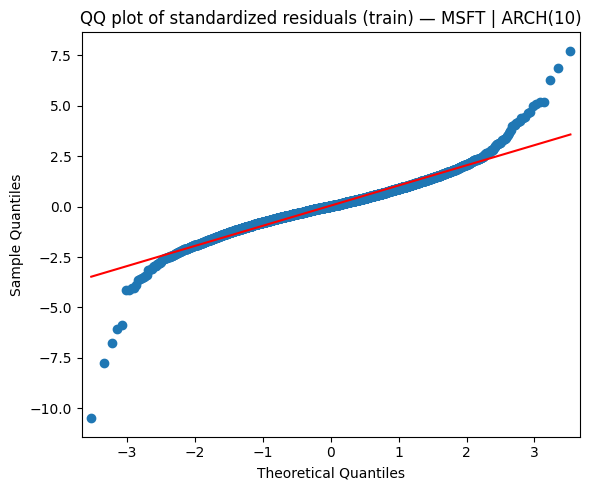


[MSFT] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1   11.006773   0.000908
2   11.018402   0.004049
3   11.224088   0.010574
4   12.605913   0.013371
5   16.230591   0.006216
6   19.076570   0.004036
7   19.740095   0.006159
8   24.288972   0.002050
9   24.289020   0.003867
10  26.340260   0.003309

[MSFT] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.792492   0.373348
2   1.034901   0.596038
3   1.094751   0.778341
4   1.872841   0.759132
5   2.669712   0.750747
6   3.413734   0.755409
7   4.052125   0.773754
8   5.264925   0.728922
9   5.444091   0.794006
10  5.632519   0.845135


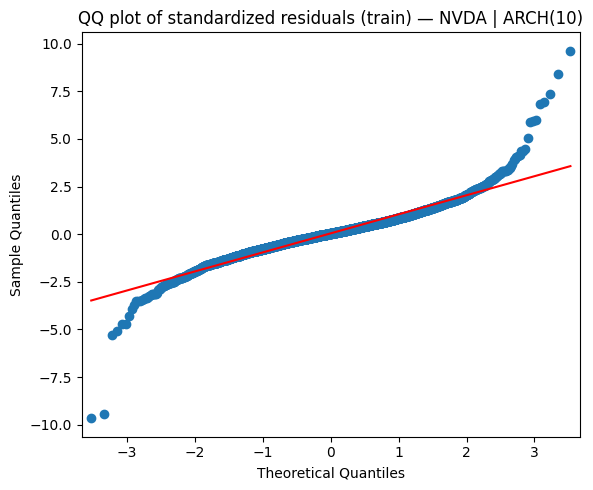


[NVDA] Ljung–Box on standardized residuals (train):
     lb_stat  lb_pvalue
1   0.165978   0.683712
2   0.182703   0.912697
3   0.976428   0.806955
4   1.128655   0.889700
5   1.642896   0.896014
6   3.074124   0.799488
7   3.856725   0.796124
8   5.136998   0.742838
9   5.340960   0.803631
10  8.664432   0.564219

[NVDA] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.242148   0.622659
2   0.509608   0.775068
3   1.222574   0.747595
4   1.870461   0.759569
5   2.176819   0.824177
6   3.564097   0.735423
7   4.937320   0.667612
8   6.371256   0.605721
9   7.448002   0.590581
10  8.318482   0.597759


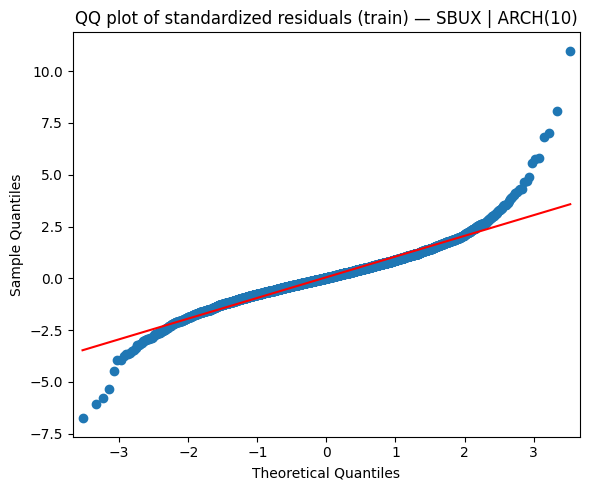


[SBUX] Ljung–Box on standardized residuals (train):
      lb_stat  lb_pvalue
1    4.531553   0.033275
2    5.151195   0.076108
3    6.178606   0.103237
4    6.461092   0.167258
5    6.548104   0.256475
6    7.278218   0.295882
7    9.835117   0.198111
8   10.770483   0.215046
9   11.616767   0.235786
10  12.144242   0.275519

[SBUX] Ljung–Box on squared standardized residuals (train):
     lb_stat  lb_pvalue
1   0.673365   0.411881
2   1.634110   0.441731
3   1.728731   0.630565
4   2.331432   0.675052
5   3.609660   0.606863
6   4.579882   0.598708
7   6.266064   0.509049
8   6.582353   0.582288
9   6.869473   0.650707
10  8.302848   0.599281


In [ ]:
# Residual diagnostics for baseline: fit chosen ARCH on full train per ticker

from statsmodels.graphics.gofplots import qqplot

# Helper: pick q for ticker t (use per-ticker dict if available, else global best_q)
def q_for(t):
    if 'best_arch_orders' in globals() and t in best_arch_orders and best_arch_orders[t][0] is not None:
        return best_arch_orders[t][0]
    return best_q  # fallback if you computed a single best_q earlier

std_resid_train = {}  # store standardized residuals per ticker

# Fit per ticker and print tests
for t in returns_train.columns:
    q = q_for(t) or 1
    arch_best = arch_model(returns_train[t] * 100, mean='Zero', vol='ARCH', p=q).fit(disp='off')

    sr = arch_best.std_resid.dropna()   # standardized residuals (train)
    std_resid_train[t] = sr

    # QQ plot (one figure per ticker, same style as yours)
    plt.figure(figsize=(6,5))
    qqplot(sr, line='s', ax=plt.gca())
    plt.title(f"QQ plot of standardized residuals (train) — {t} | ARCH({q})")
    plt.tight_layout()
    plt.show()

    # Ljung–Box tests
    lb_resid = acorr_ljungbox(sr, lags=10, return_df=True)
    lb_sq    = acorr_ljungbox(sr**2, lags=10, return_df=True)

    print(f"\n[{t}] Ljung–Box on standardized residuals (train):")
    print(lb_resid)
    print(f"\n[{t}] Ljung–Box on squared standardized residuals (train):")
    print(lb_sq)



=== Rolling forecasts for AAPL ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for EBAY ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for MCD ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for MSFT ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== Rolling forecasts for NVDA ===
Rolling forecast: ARCH(10) ...
Rolling forecast: GARCH(1,1) ...
Rolling forecast: GARCH(1,2) ...
Rolling forecast: GARCH(2,1) ...
Rolling forecast: GARCH(2,2) ...

=== R

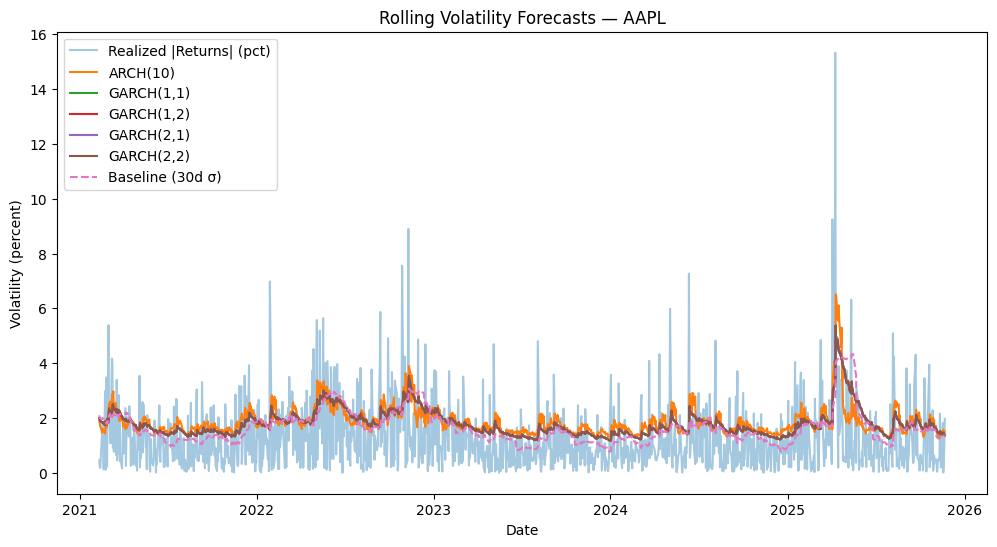


RMSE (percent units):
        Baseline(30d)  ARCH(10)  GARCH(1,1)  GARCH(1,2)  GARCH(2,1)  \
Ticker                                                                
AAPL         1.309214  1.358356    1.323915    1.321048    1.323915   
EBAY         1.642335  1.654513    1.612352    1.607786    1.612748   
MCD          0.774280  0.815073    0.788600    0.789253    0.788600   
MSFT         1.171501  1.208774    1.180244    1.179683    1.180244   
NVDA         2.377734  2.518509    2.396222    2.399010    2.396218   
SBUX         1.679728  1.678487    1.643277    1.644939    1.643275   

        GARCH(2,2)  
Ticker              
AAPL      1.321049  
EBAY      1.608001  
MCD       0.789253  
MSFT      1.179683  
NVDA      2.398982  
SBUX      1.652336  


In [ ]:


# --- 1) Define the rolling forecast function (must be defined BEFORE calling it) ---
def rolling_forecast_volatility(model_constructor, returns_series, train_size, h=1):
    """
    model_constructor: function that returns an arch_model instance with specified params, given data
    returns_series: full returns series (in percent scaling)
    train_size: number of initial observations for training
    h: forecast horizon (1)
    Returns: np.array of forecasted volatilities (std) aligned with the test index
    """
    n = len(returns_series)
    n_test = n - train_size
    fcast_vol = []
    for i in range(n_test):
        train_end = train_size + i
        train_data = returns_series.iloc[:train_end]
        try:
            am = model_constructor(train_data)
            res = am.fit(disp='off')
            fcast = res.forecast(horizon=h, reindex=False)
            var_forecast = fcast.variance.values[-1, -1]  # last forecasted variance
            vol_forecast = np.sqrt(var_forecast)          # std (same units as data)
        except Exception:
            vol_forecast = np.nan
        fcast_vol.append(vol_forecast)
    return np.array(fcast_vol)

# --- 2) Prepare percent-scaled returns per ticker ---
# 'returns' should be your DataFrame of daily returns for ALL tickers (columns = tickers)
returns_percent_df = (returns * 100).dropna()

# Train/test split fraction you already set earlier
train_frac = 0.80

# Helper to get best ARCH order per ticker (if you built best_arch_orders), else fallback to best_q
def q_for(t):
    try:
        if 'best_arch_orders' in globals() and t in best_arch_orders and best_arch_orders[t][0] is not None:
            return best_arch_orders[t][0]
    except Exception:
        pass
    return best_q  # fallback to a single global best_q if you computed only one earlier

# --- 3) Build forecasts per ticker using your model list ---
def make_model_list_for_ticker(t):
    q = q_for(t)
    return [
        (f'ARCH({q})', lambda d, q=q: arch_model(d, mean='Zero', vol='ARCH', p=q)),
        ('GARCH(1,1)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=1, q=1)),
        ('GARCH(1,2)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=1, q=2)),
        ('GARCH(2,1)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=2, q=1)),
        ('GARCH(2,2)', lambda d: arch_model(d, mean='Zero', vol='GARCH', p=2, q=2)),
    ]

fcasts_all   = {}  # dict[ticker] -> dict[model_name] -> np.array
baseline_all = {}  # dict[ticker] -> np.array (30d rolling σ)
realized_all = {}  # dict[ticker] -> pd.Series (|return| percent)
test_idx_all = {}  # dict[ticker] -> DatetimeIndex

for t in returns_percent_df.columns:
    print(f"\n=== Rolling forecasts for {t} ===")
    r_pct = returns_percent_df[t].dropna()
    n = len(r_pct)
    n_train = int(np.floor(train_frac * n))
    test_idx = r_pct.index[n_train:]
    test_idx_all[t] = test_idx

    # model list for this ticker (ARCH order may differ per ticker)
    model_list_t = make_model_list_for_ticker(t)

    # forecasts per model
    fcasts = {}
    for name, constructor in model_list_t:
        print(f"Rolling forecast: {name} ...")
        vols = rolling_forecast_volatility(constructor, r_pct, n_train, h=1)
        fcasts[name] = vols
    fcasts_all[t] = fcasts

    # realized |return| (percent) for test window
    realized_all[t] = r_pct.iloc[n_train:].abs()

    # baseline: 30-day rolling σ aligned to test
    roll_std = []
    for i in range(n_train, n):
        start = max(0, i - 30)
        window = r_pct.iloc[start:i]
        roll_std.append(window.std(ddof=0))  # population std
    baseline_all[t] = np.array(roll_std)

# --- 4) Example plot for the first ticker ---
example_t = returns_percent_df.columns[0]
plt.figure(figsize=(12,6))
plt.plot(test_idx_all[example_t], realized_all[example_t], alpha=0.4, label='Realized |Returns| (pct)')
for name, arr in fcasts_all[example_t].items():
    plt.plot(test_idx_all[example_t], arr, label=name)
plt.plot(test_idx_all[example_t], baseline_all[example_t], linestyle='--', label='Baseline (30d σ)')
plt.title(f'Rolling Volatility Forecasts — {example_t}')
plt.xlabel('Date'); plt.ylabel('Volatility (percent)')
plt.legend(); plt.show()

# --- 5) RMSE table per model per ticker ---
rmse_rows = []
for t in returns_percent_df.columns:
    y = realized_all[t].values
    row = {'Ticker': t, 'Baseline(30d)': np.sqrt(mean_squared_error(y, baseline_all[t]))}
    for name, arr in fcasts_all[t].items():
        row[name] = np.sqrt(mean_squared_error(y, arr))
    rmse_rows.append(row)

rmse_df = pd.DataFrame(rmse_rows).set_index('Ticker').round(6)
print("\nRMSE (percent units):")
print(rmse_df)


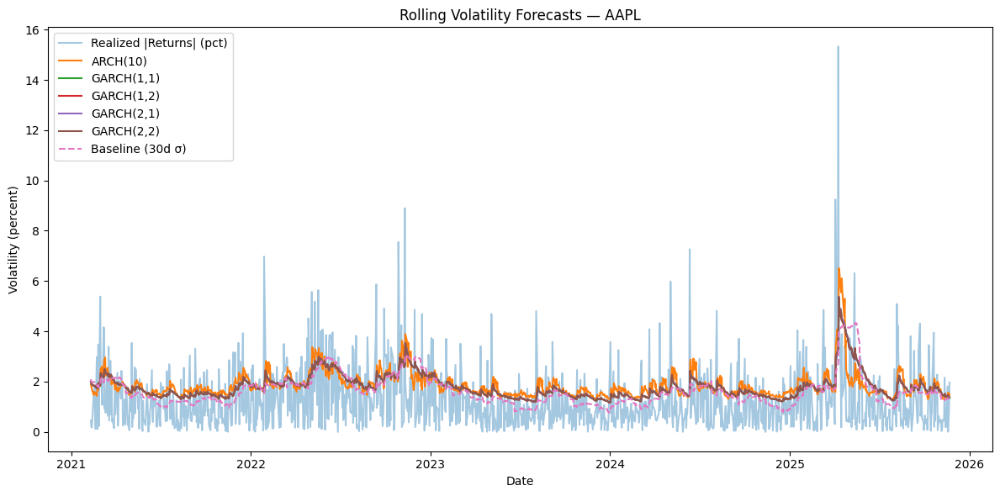

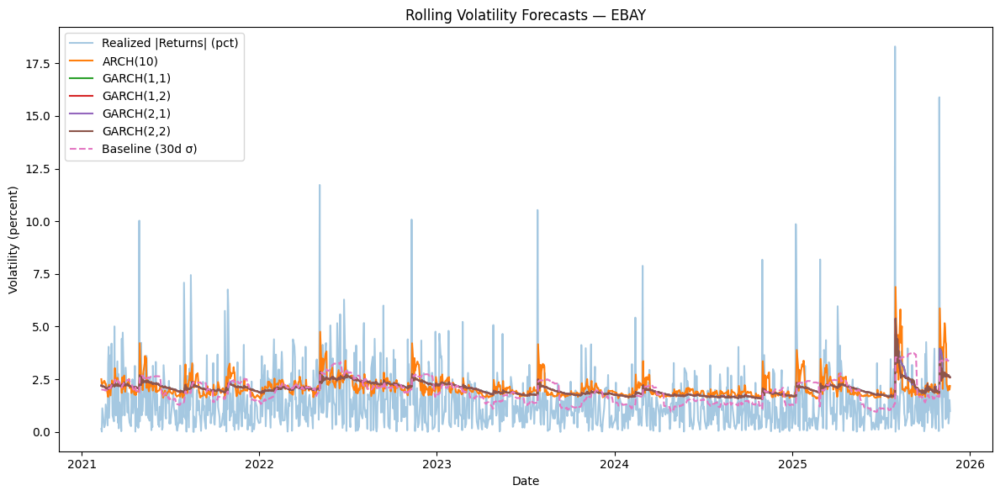

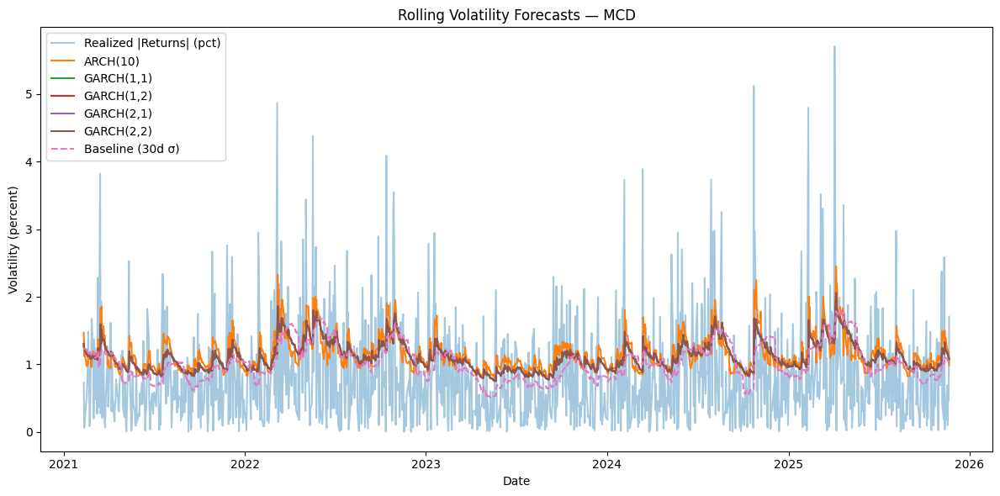

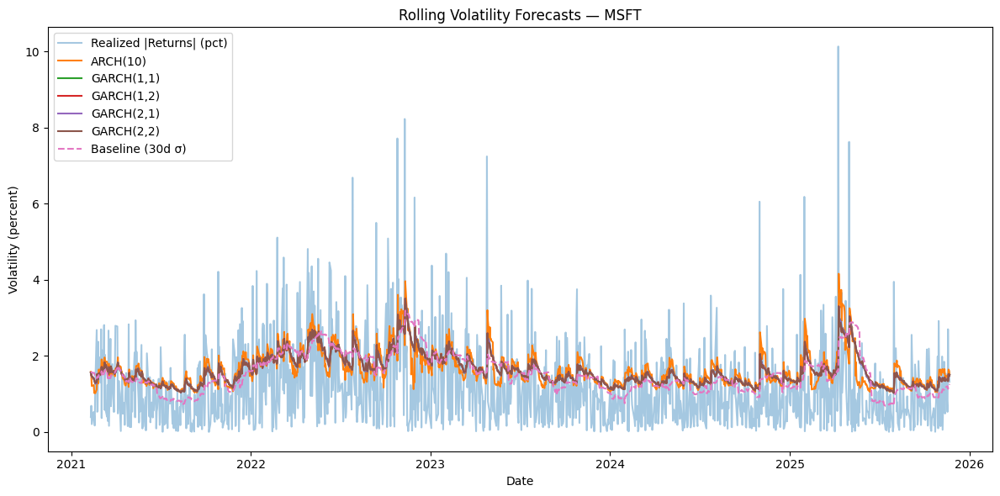

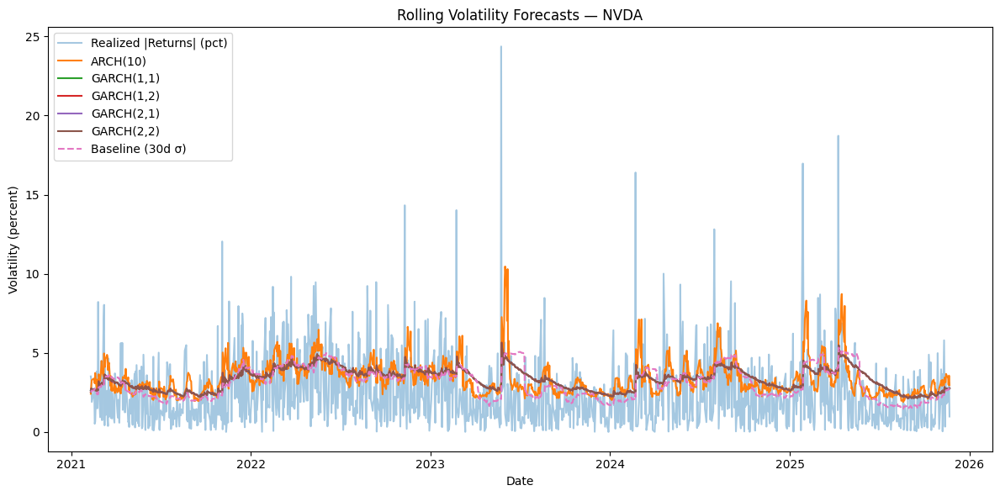

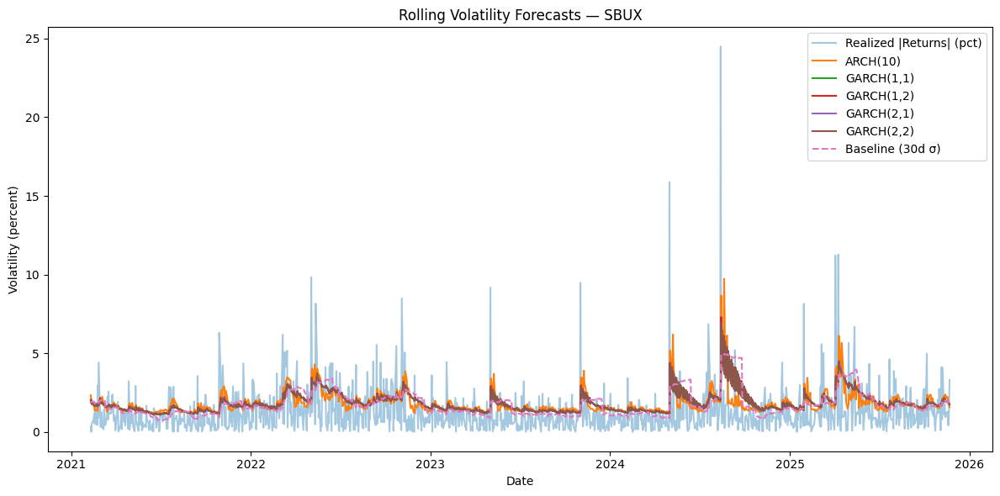

In [ ]:
for example_t in returns_percent_df.columns:
    plt.figure(figsize=(12,6))
    # Realized
    plt.plot(test_idx_all[example_t], realized_all[example_t],
             alpha=0.4, label='Realized |Returns| (pct)')

    # All forecasts (LSTM, GARCH, etc.)
    for name, arr in fcasts_all[example_t].items():
        plt.plot(test_idx_all[example_t], arr, label=name)

    # Baseline
    plt.plot(test_idx_all[example_t],
             baseline_all[example_t],
             linestyle='--', label='Baseline (30d σ)')

    plt.title(f'Rolling Volatility Forecasts — {example_t}')
    plt.xlabel('Date')
    plt.ylabel('Volatility (percent)')
    plt.legend()
    plt.tight_layout()
    plt.show()



=== Plots & metrics for AAPL ===


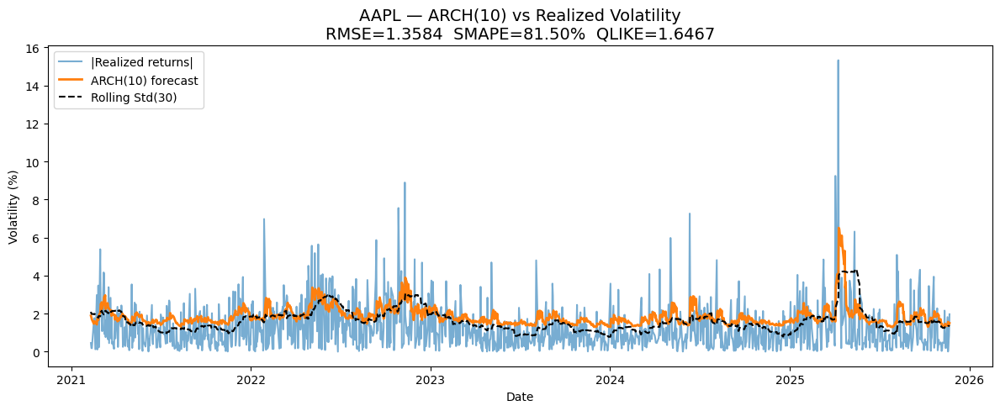

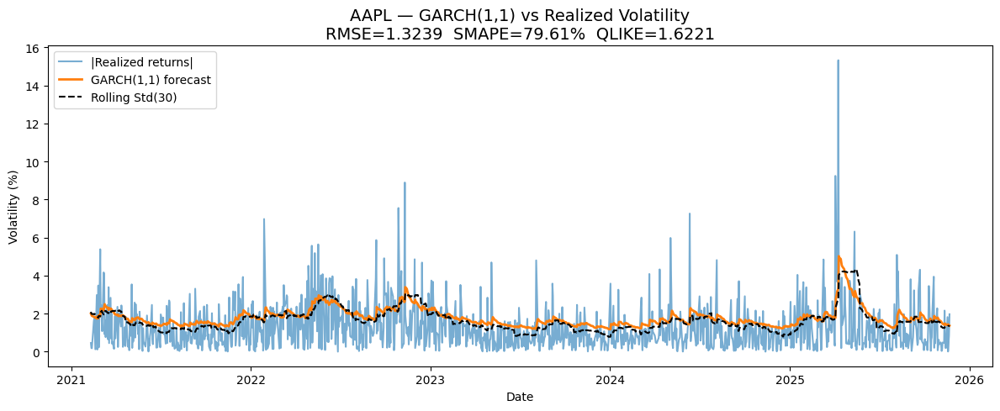

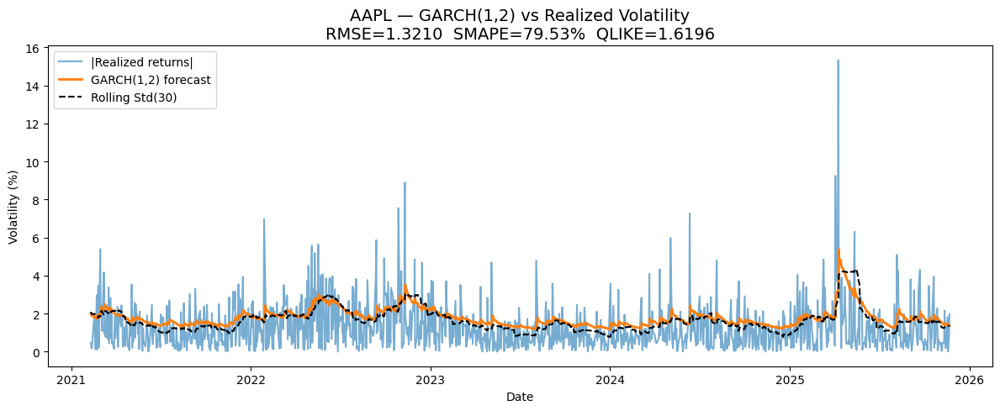

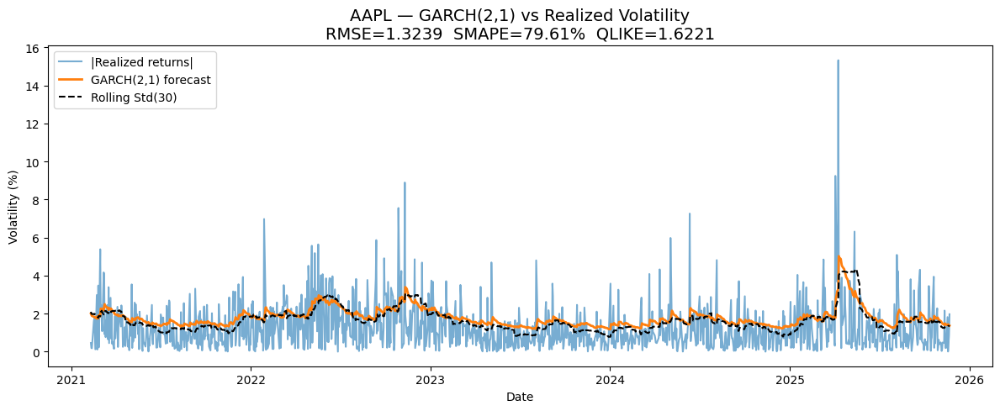

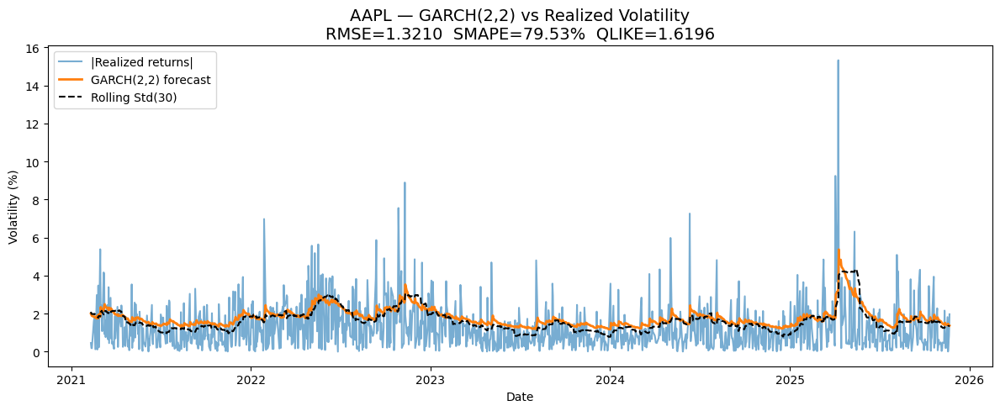


=== Plots & metrics for EBAY ===


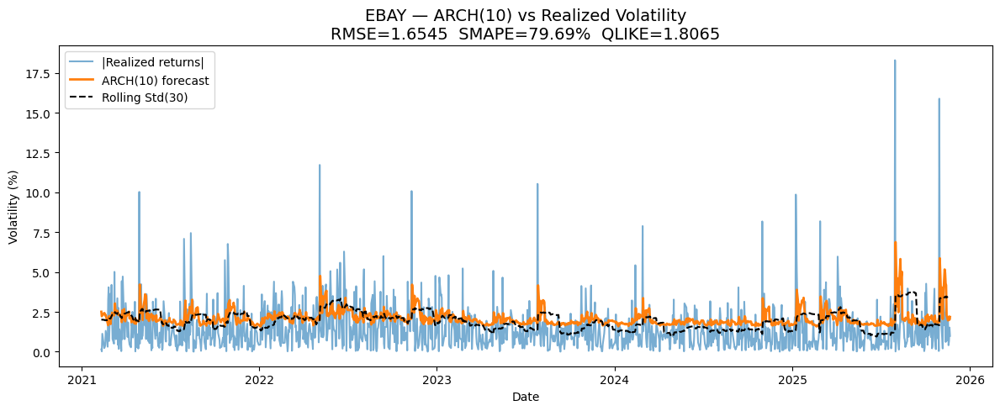

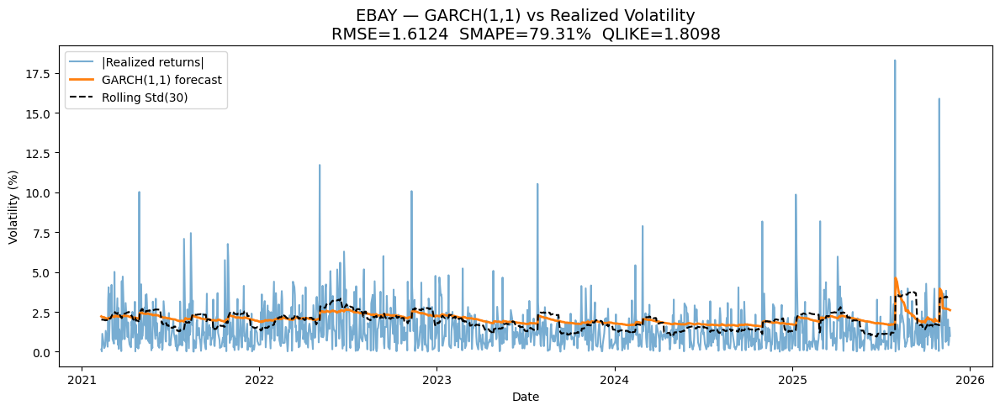

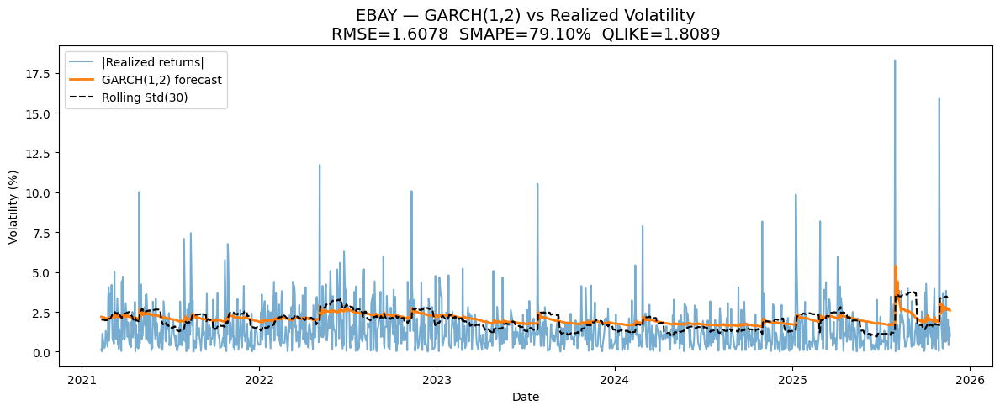

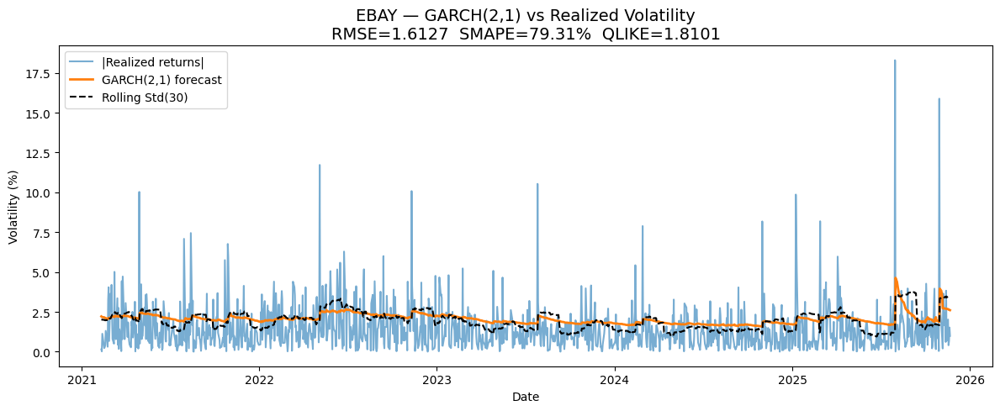

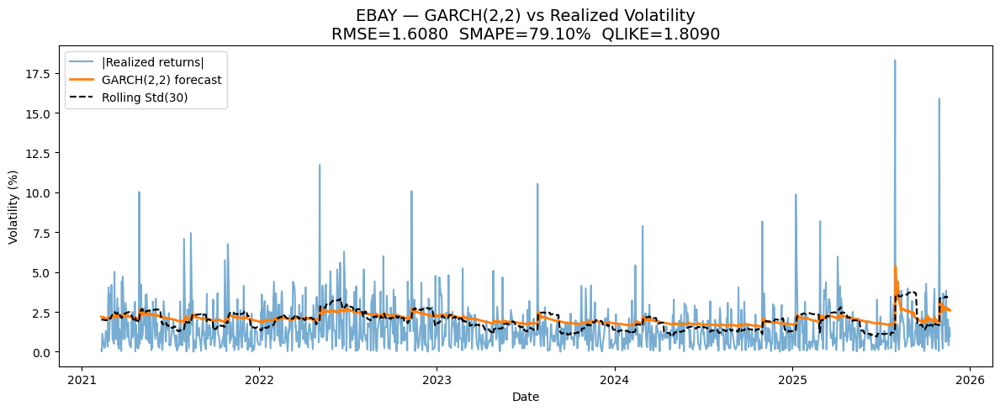


=== Plots & metrics for MCD ===


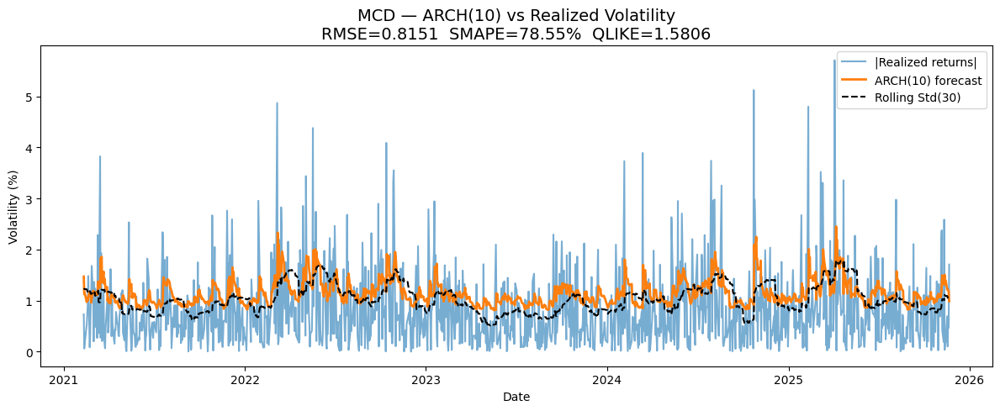

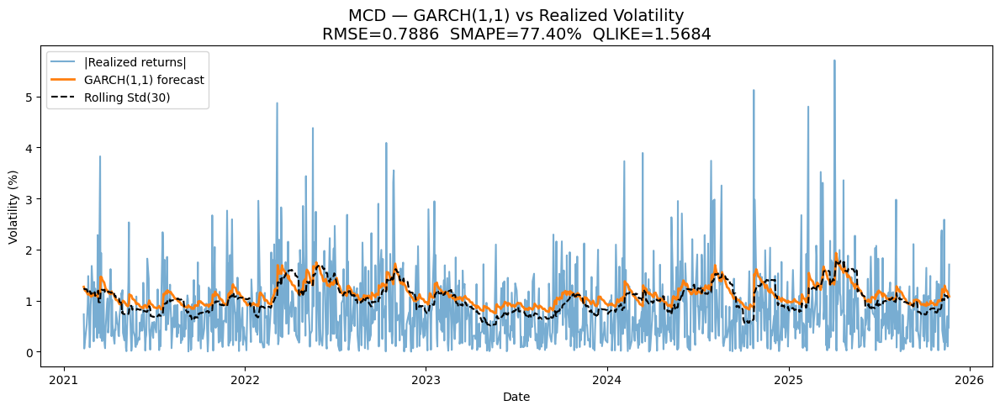

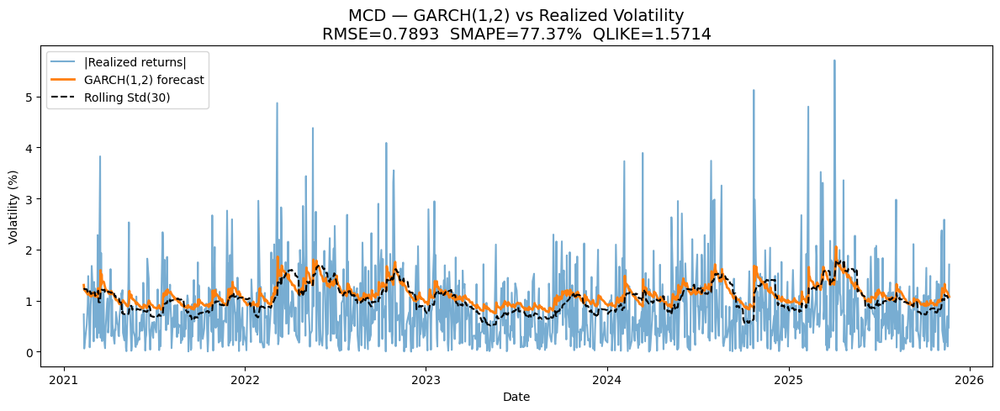

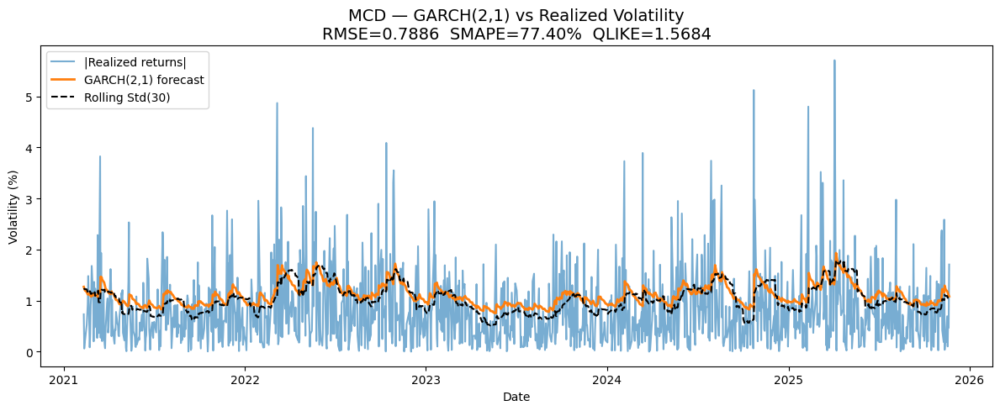

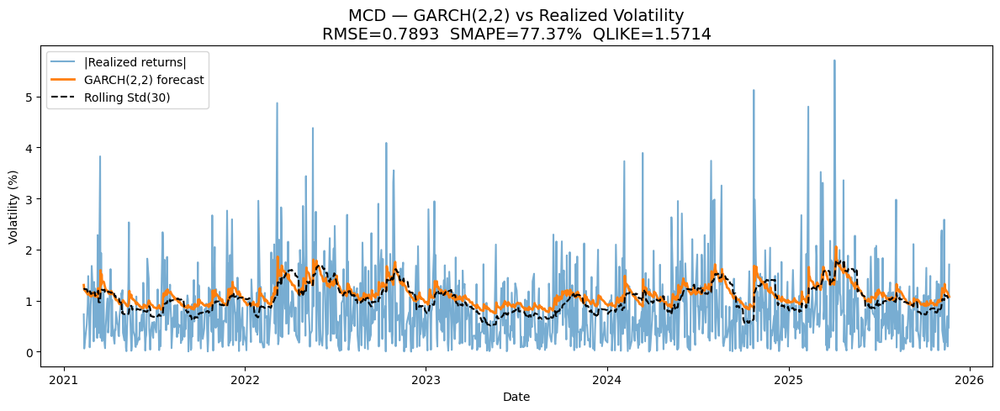


=== Plots & metrics for MSFT ===


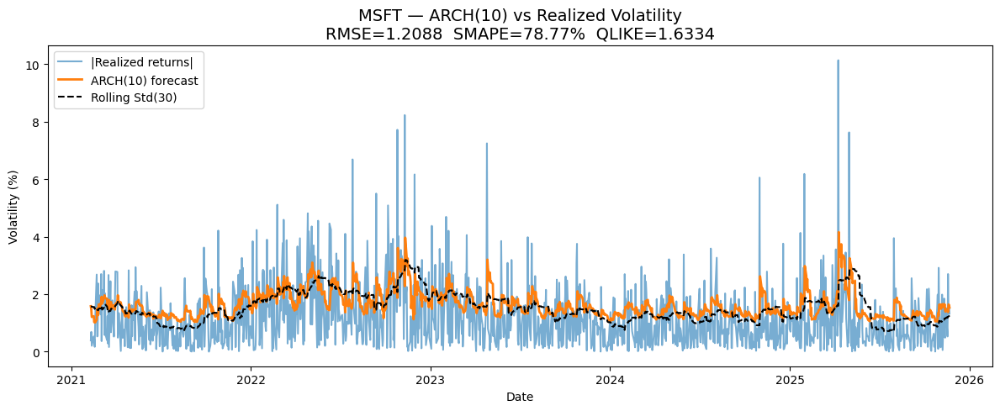

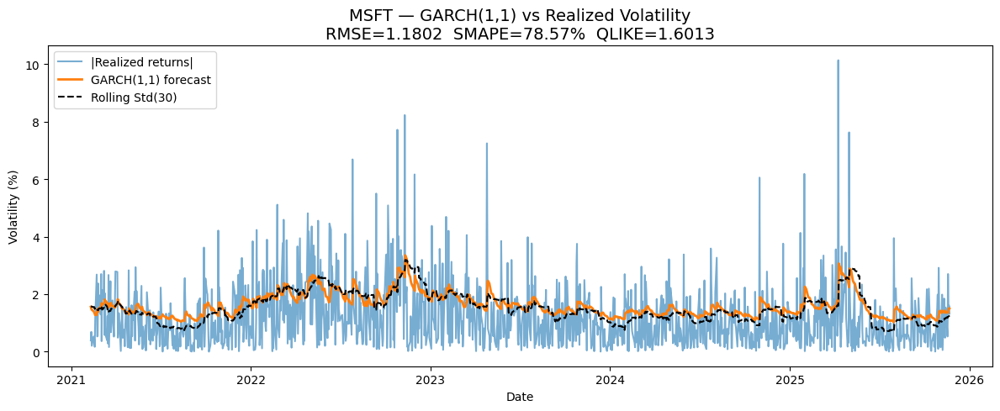

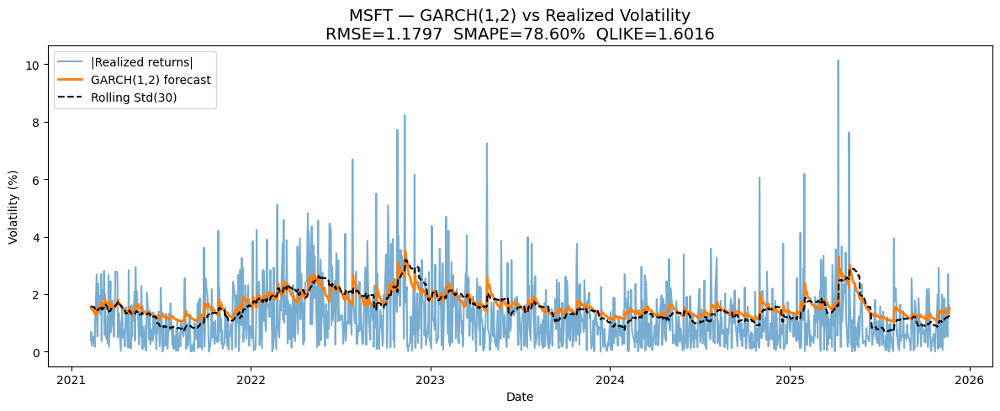

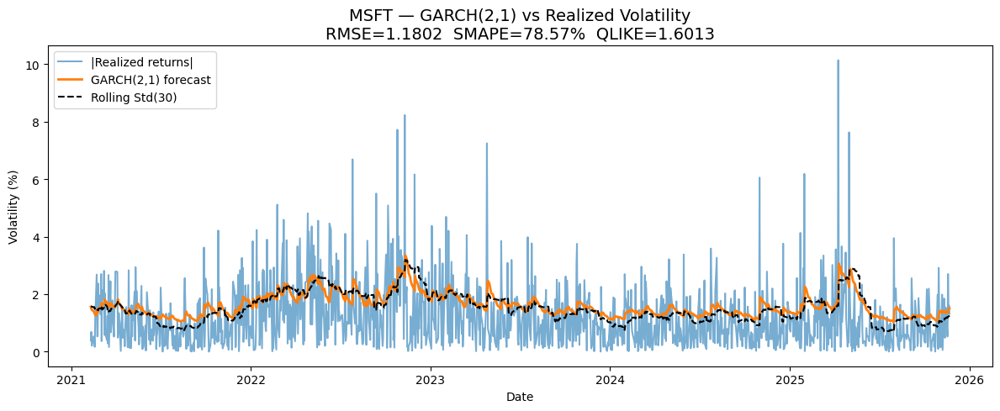

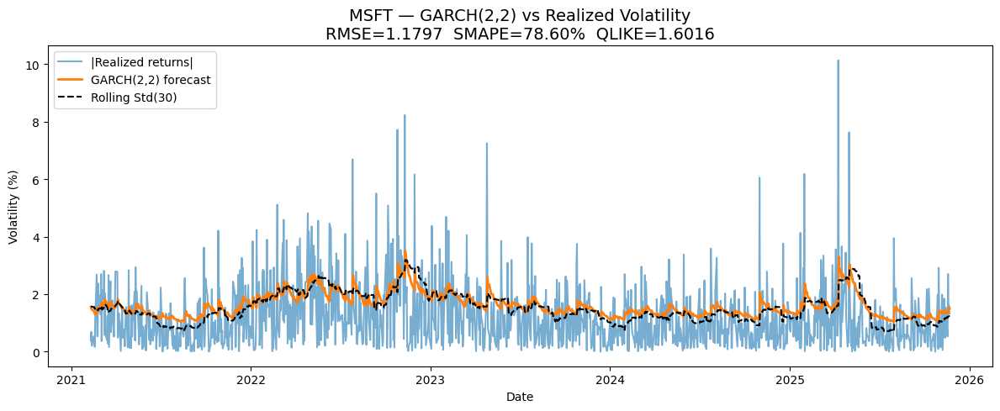


=== Plots & metrics for NVDA ===


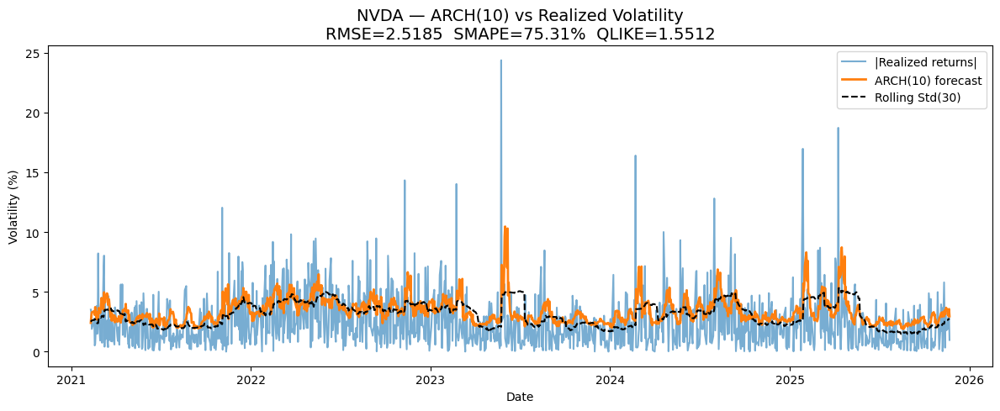

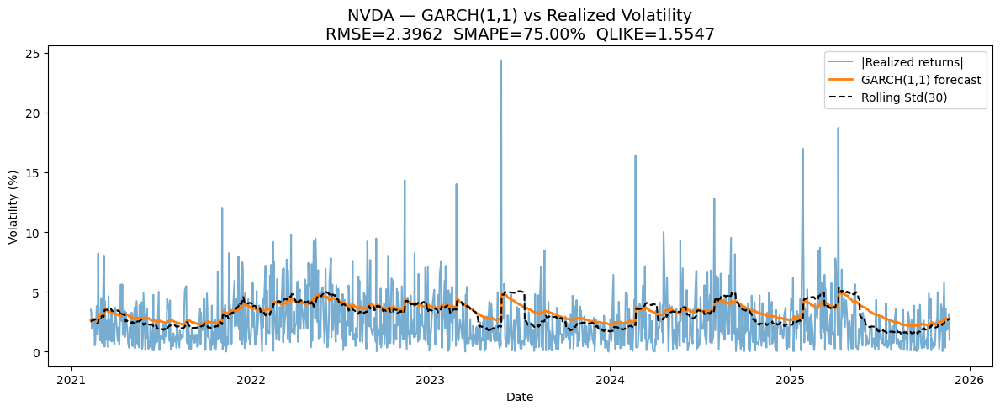

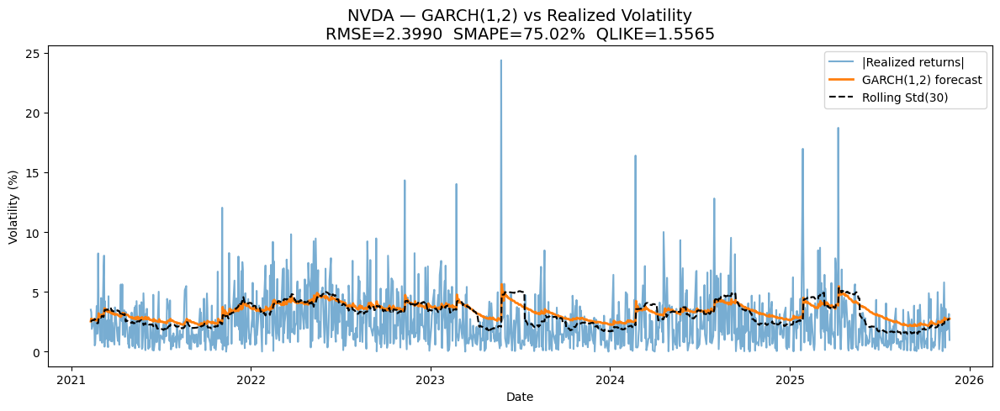

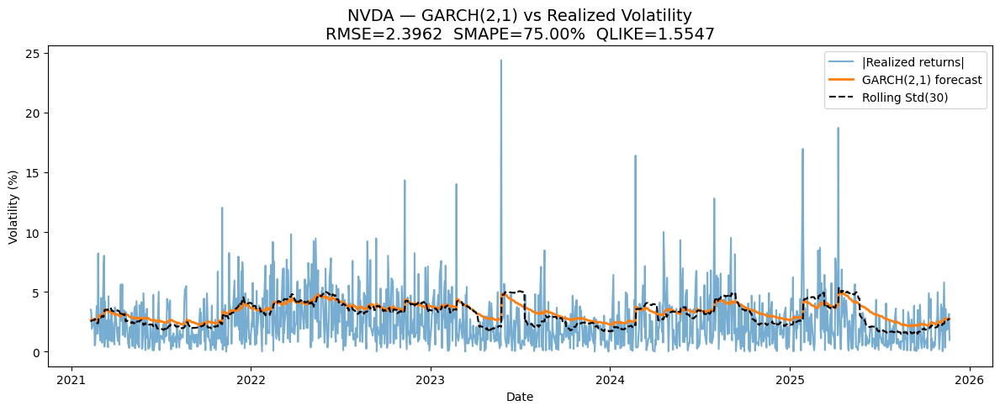

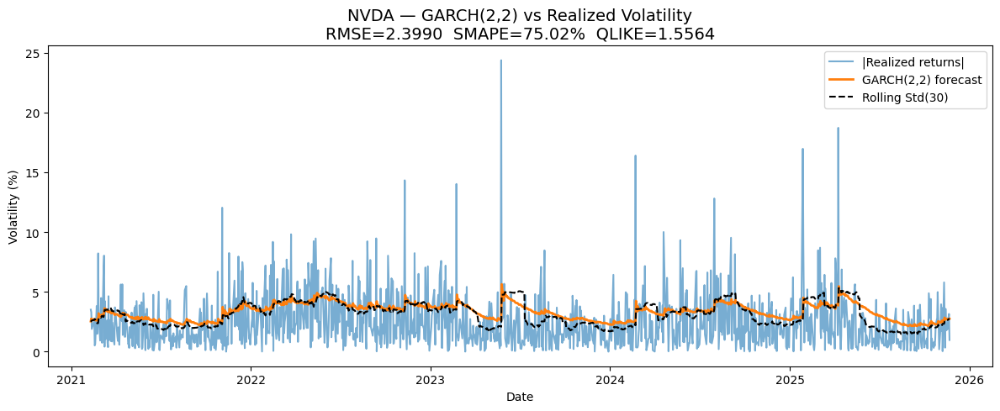


=== Plots & metrics for SBUX ===


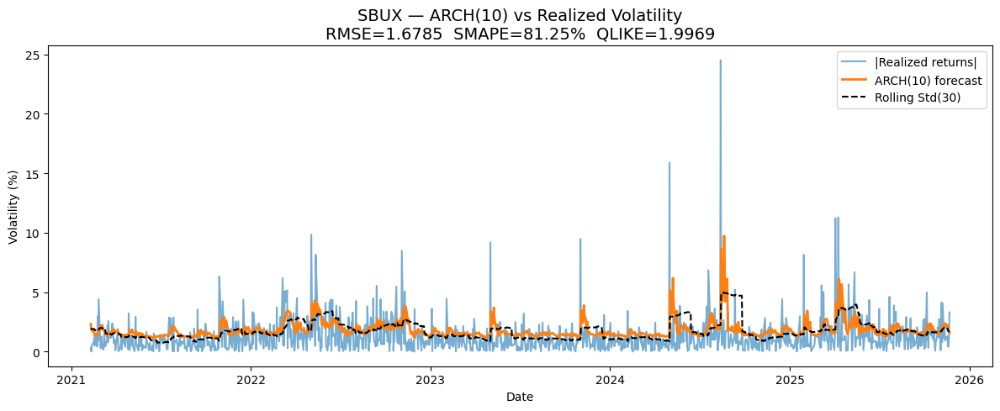

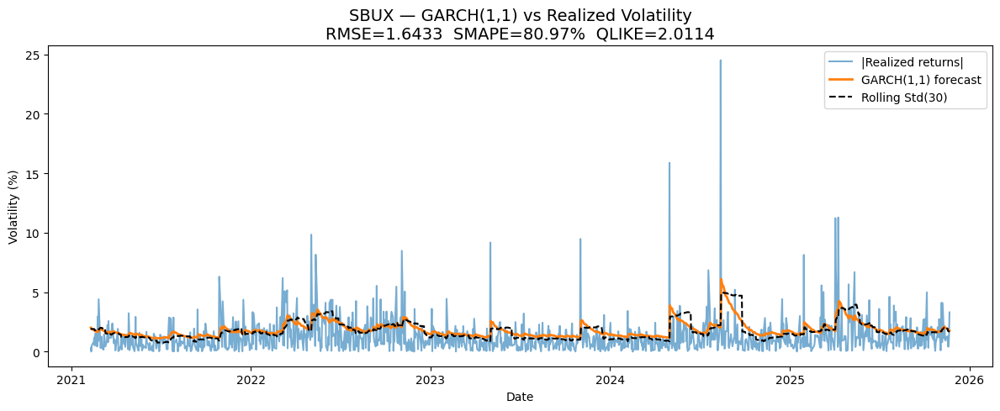

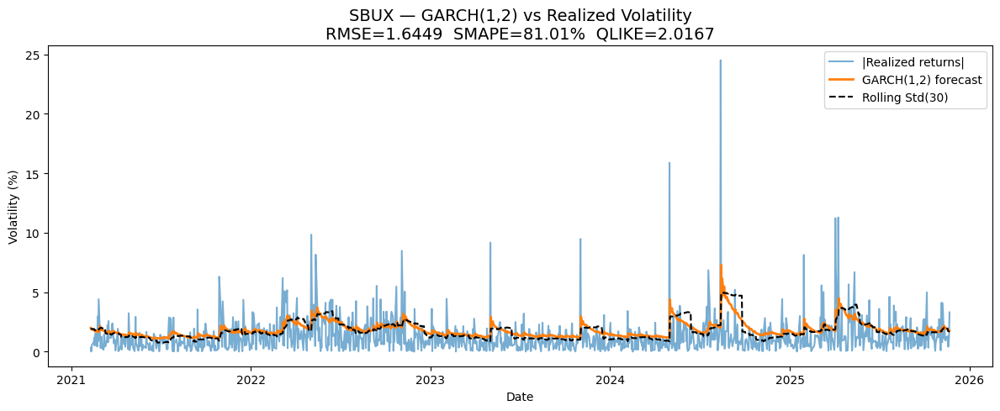

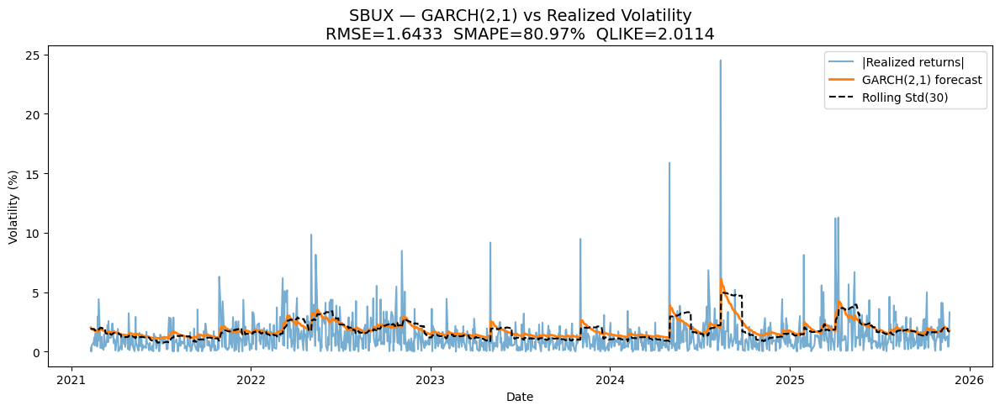

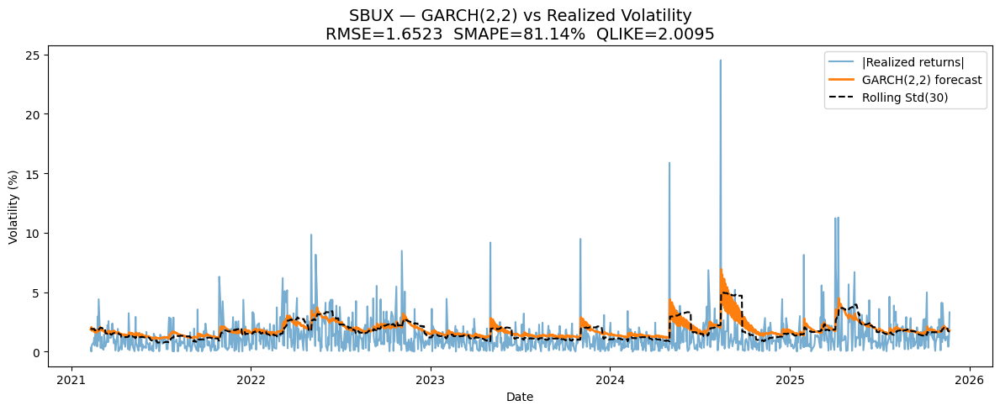

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# --- Robust metrics ---
def smape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = (np.abs(y_true) + np.abs(y_pred)) / 2.0 + eps
    return 100 * np.mean(np.abs(y_true - y_pred) / denom)

def qlike(vol_true, vol_pred, eps=1e-12):
    # Good for volatility/variance forecasting
    v_t = np.square(np.asarray(vol_true)) + eps
    v_p = np.square(np.asarray(vol_pred)) + eps
    r = v_t / v_p
    return np.mean(r - np.log(r) - 1.0)

for t in returns_percent_df.columns:
    print(f"\n=== Plots & metrics for {t} ===")
    y = realized_all[t].values                    # |returns| in percent (test)
    idx = test_idx_all[t]                         # test index
    base = baseline_all[t]                        # 30d baseline (percent)

    for name, yhat in fcasts_all[t].items():      # model -> np.array (percent)
        # Drop NaNs just in case
        mask = ~np.isnan(yhat)
        y_eval   = y[mask]
        yhat_eval = yhat[mask]
        idx_eval  = idx[mask]
        base_eval = base[mask]

        rmse  = np.sqrt(mean_squared_error(y_eval, yhat_eval))
        smape_val = smape(y_eval, yhat_eval)
        qlike_val = qlike(y_eval, yhat_eval)   # optional, but useful for vol

        plt.figure(figsize=(12,5))
        plt.plot(idx_eval, y_eval, label='|Realized returns|', alpha=0.6)
        plt.plot(idx_eval, yhat_eval, label=f'{name} forecast', linewidth=2)
        plt.plot(idx_eval, base_eval, label='Rolling Std(30)',
                 linestyle='--', color='black')

        plt.title(
            f"{t} — {name} vs Realized Volatility\n"
            f"RMSE={rmse:.4f}  SMAPE={smape_val:.2f}%  QLIKE={qlike_val:.4f}",
            fontsize=14
        )
        plt.xlabel("Date"); plt.ylabel("Volatility (%)")
        plt.legend(); plt.tight_layout(); plt.show()


In [ ]:

rows = []
for t in returns_percent_df.columns:
    y = realized_all[t].values                  # |returns| (percent)
    base = np.asarray(baseline_all[t])         # baseline (percent)

    # models
    for name, yhat in fcasts_all[t].items():
        yhat = np.asarray(yhat)
        mask = ~np.isnan(yhat)
        rmse = np.sqrt(mean_squared_error(y[mask], yhat[mask]))
        rows.append({'Ticker': t, 'Model': name, 'RMSE': rmse})

    # baseline
    L = min(len(y), len(base))
    rmse_base = np.sqrt(mean_squared_error(y[:L], base[:L]))
    rows.append({'Ticker': t, 'Model': 'RollingStd(30)', 'RMSE': rmse_base})

perf_df = pd.DataFrame(rows)
# Wide table: one row per ticker, columns = models
perf_wide = perf_df.pivot(index='Ticker', columns='Model', values='RMSE').sort_index()
print("\nRMSE (percent units):")
print(perf_wide.round(6))



RMSE (percent units):
Model   ARCH(10)  GARCH(1,1)  GARCH(1,2)  GARCH(2,1)  GARCH(2,2)  \
Ticker                                                             
AAPL    1.358356    1.323915    1.321048    1.323915    1.321049   
EBAY    1.654513    1.612352    1.607786    1.612748    1.608001   
MCD     0.815073    0.788600    0.789253    0.788600    0.789253   
MSFT    1.208774    1.180244    1.179683    1.180244    1.179683   
NVDA    2.518509    2.396222    2.399010    2.396218    2.398982   
SBUX    1.678487    1.643277    1.644939    1.643275    1.652336   

Model   RollingStd(30)  
Ticker                  
AAPL          1.309214  
EBAY          1.642335  
MCD           0.774280  
MSFT          1.171501  
NVDA          2.377734  
SBUX          1.679728  


<Figure size 1200x600 with 0 Axes>

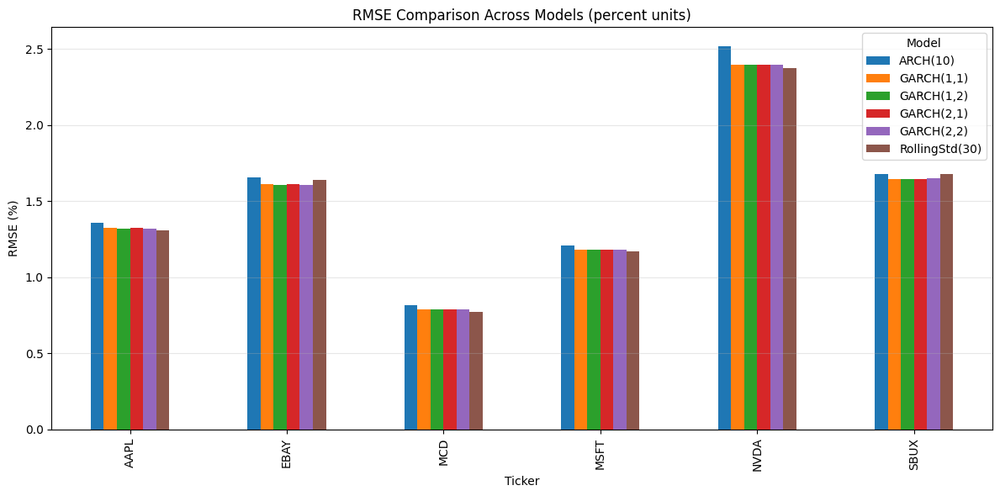

In [ ]:
import matplotlib.pyplot as plt

# perf_wide is already created above:
# perf_wide = perf_df.pivot(index='Ticker', columns='Model', values='RMSE').sort_index()

plt.figure(figsize=(12, 6))
perf_wide.plot(kind='bar', figsize=(12, 6))

plt.title('RMSE Comparison Across Models (percent units)')
plt.xlabel('Ticker')
plt.ylabel('RMSE (%)')
plt.grid(axis='y', alpha=0.3)
plt.legend(title='Model')
plt.tight_layout()
plt.show()


Move too below as appendix

# **LSTM RETURNS **

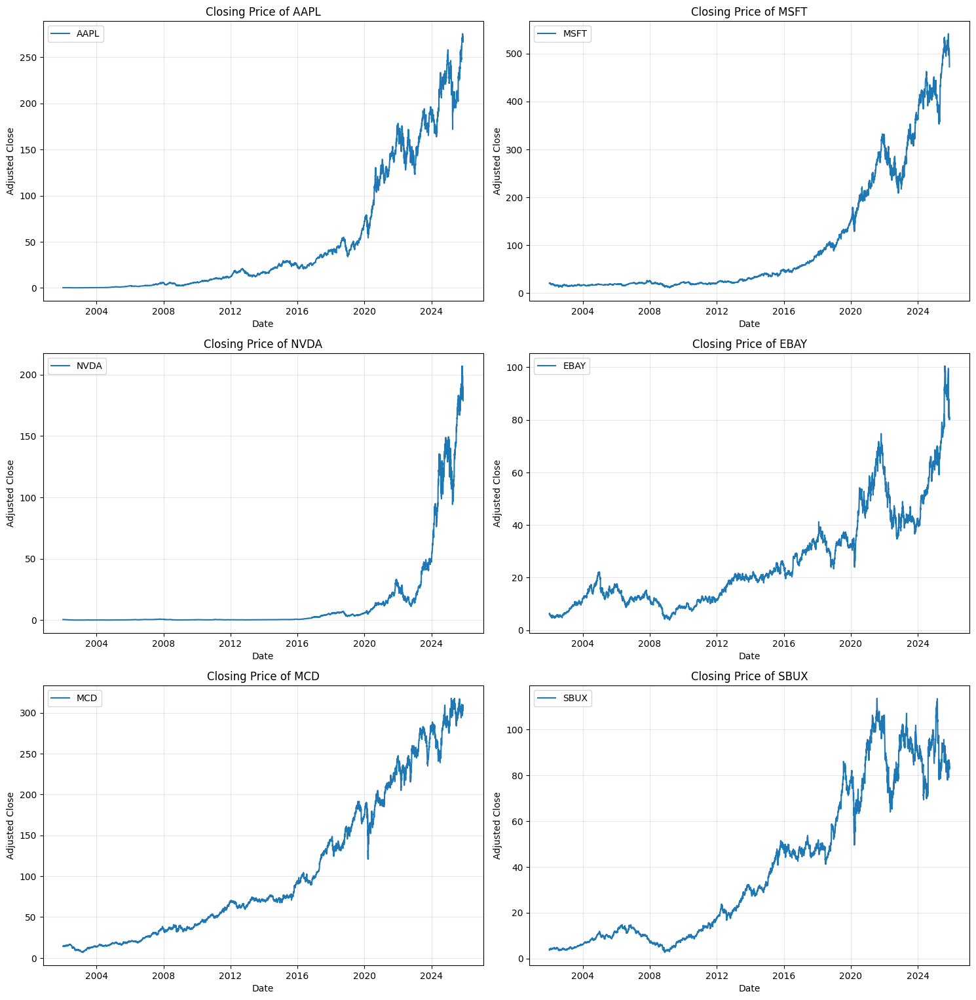

In [ ]:
# Historical view of closing prices
plt.figure(figsize=(15, 20))
plt.subplots_adjust(top=0.95, bottom=0.05, hspace=0.3)

for i, ticker in enumerate(tickers, 1):
    plt.subplot(4, 2, i)
    plt.plot(data1['Close'][ticker], label=ticker)
    plt.ylabel('Adjusted Close')
    plt.xlabel('Date')
    plt.title(f"Closing Price of {ticker}")
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# **Total trading volume for each stocks**

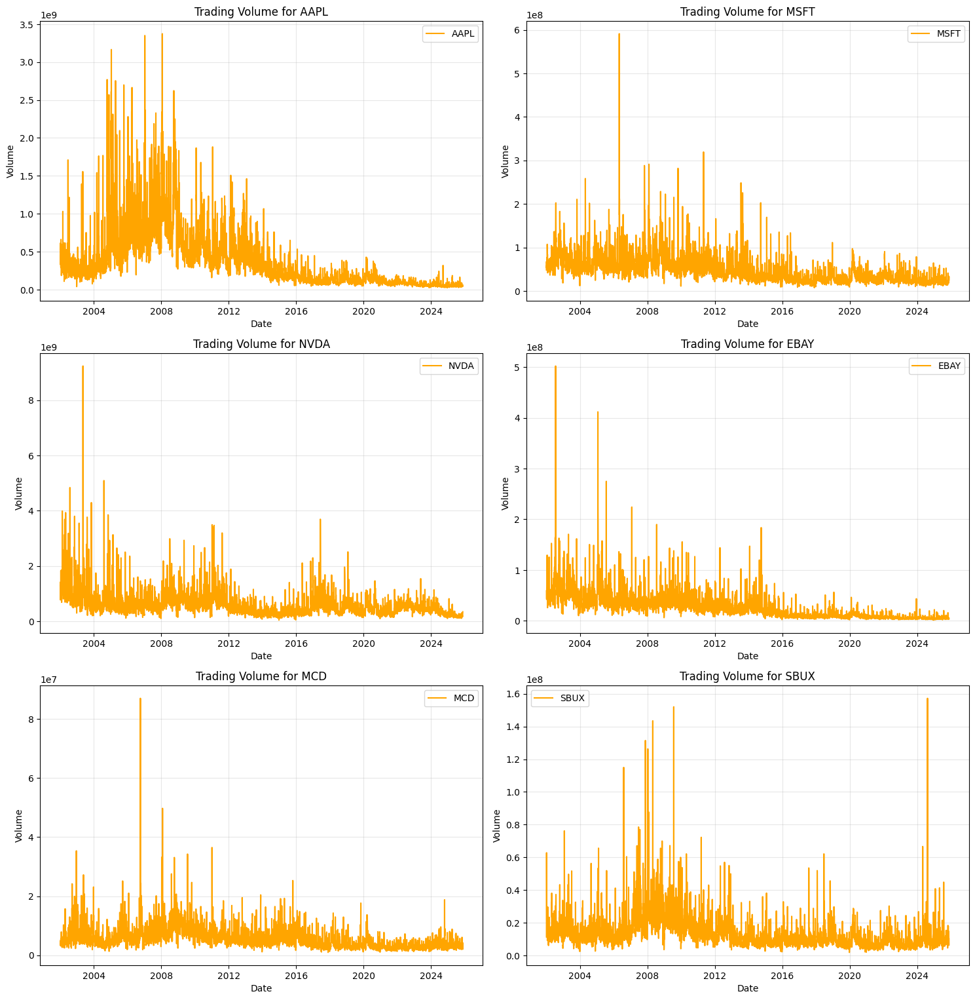

In [ ]:
# Plot total trading volume for each company
plt.figure(figsize=(15, 20))
plt.subplots_adjust(top=0.95, bottom=0.05, hspace=0.3)

for i, ticker in enumerate(tickers, 1):
    plt.subplot(4, 2, i)
    plt.plot(data1['Volume'][ticker], label=ticker, color='orange')
    plt.ylabel('Volume')
    plt.xlabel('Date')
    plt.title(f"Trading Volume for {ticker}")
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

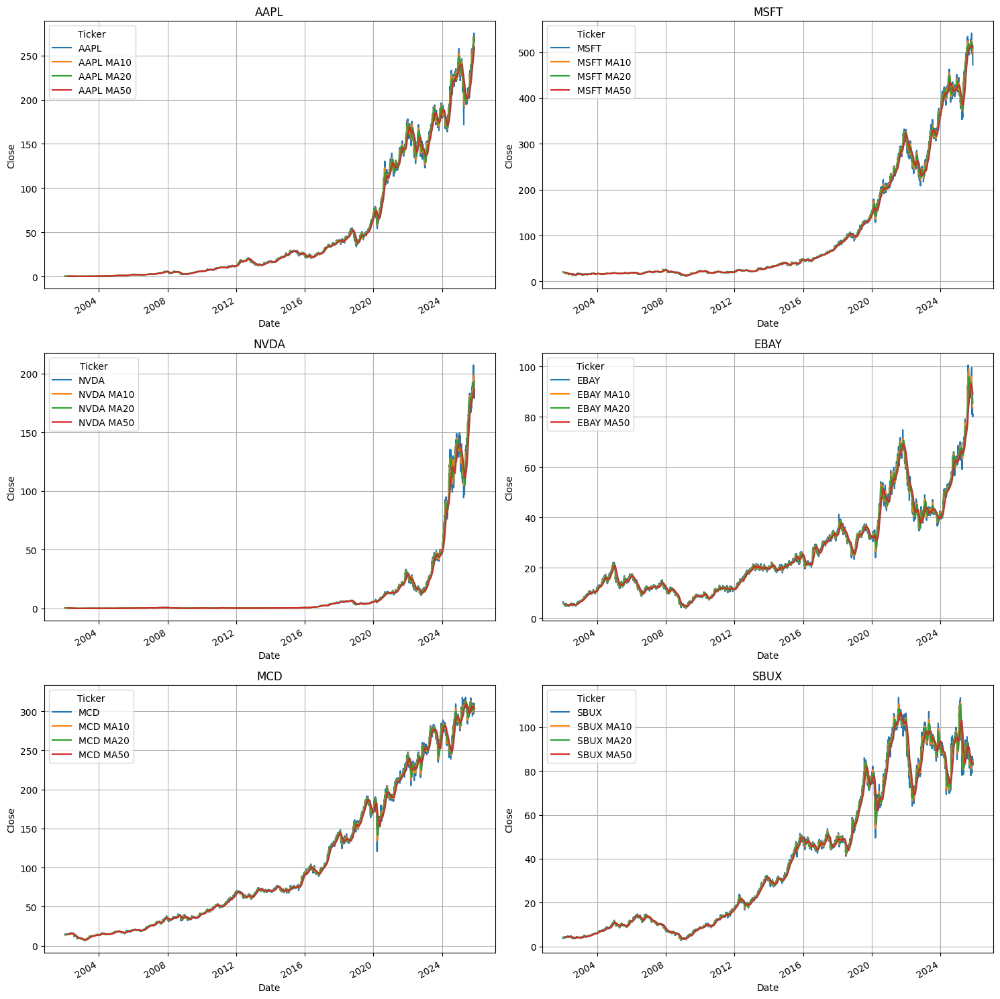

In [ ]:
# Moving average periods
ma_days = [10, 20, 50]

# Create a copy so we don't modify data1
ma_df = data1['Close'].copy()

# Compute MAs for each ticker
for ticker in ma_df.columns:
    for ma in ma_days:
        ma_df[f'{ticker} MA{ma}'] = ma_df[ticker].rolling(ma).mean()

# Plot all 7 tickers in dynamic grid
n_tickers = len(tickers)
n_cols = 2
n_rows = (n_tickers + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, ticker in enumerate(tickers):  # Use all tickers
    base = ma_df[[ticker]]
    ma_cols = [f'{ticker} MA{ma}' for ma in ma_days]
    base = pd.concat([base, ma_df[ma_cols]], axis=1)
    base.plot(ax=axes[i], title=ticker)
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('Close')
    axes[i].grid(True)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.tight_layout()
plt.show()

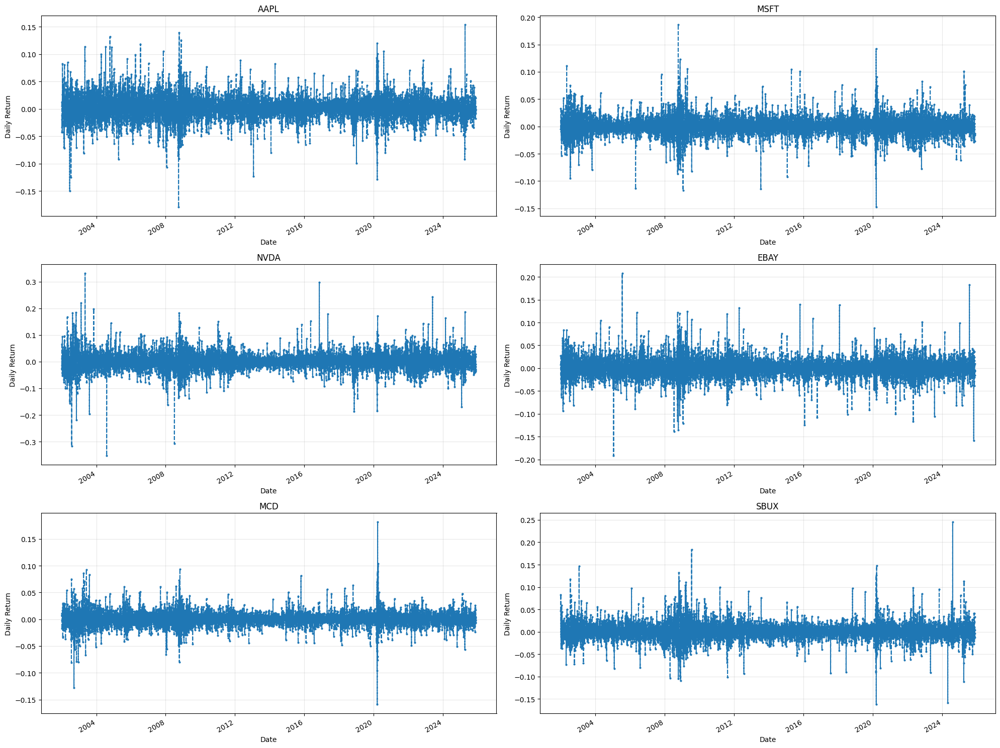

In [ ]:
# 1) Daily returns from your dataset (auto_adjust=True ⇒ use "Close")
returns = data1['Close'].pct_change().dropna()

# 2) Plot daily return percentage for all 7 tickers
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 15))
axes = axes.flatten()

for ax, ticker in zip(axes, tickers):
    returns[ticker].plot(ax=ax, legend=False, linestyle='--', marker='o', markersize=2)
    ax.set_title(ticker)
    ax.set_xlabel('Date')
    ax.set_ylabel('Daily Return')
    ax.grid(True, alpha=0.3)

fig.tight_layout()
plt.show()

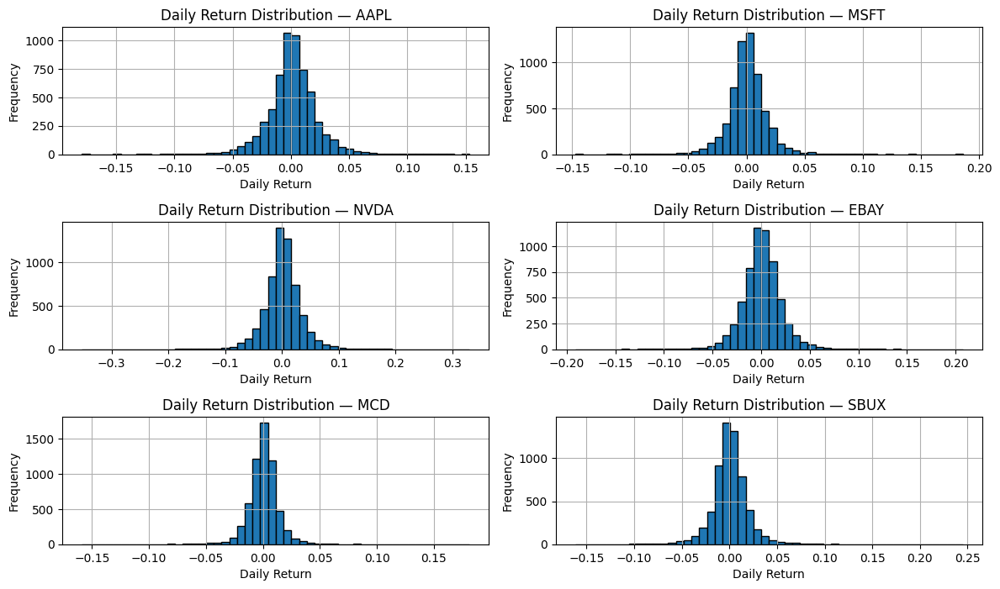

In [ ]:
# Create daily returns
returns = data1['Close'].pct_change().dropna()

# Plot histograms of daily returns for each ticker
plt.figure(figsize=(12, 9))

tickers = ["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]

for i, ticker in enumerate(tickers, 1):
    plt.subplot(4, 2, i)
    returns[ticker].hist(bins=50, edgecolor='black')
    plt.xlabel('Daily Return')
    plt.ylabel('Frequency')
    plt.title(f'Daily Return Distribution — {ticker}')

plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

# Build closing price table and daily returns from your data1
closing_df = data1['Close'].copy()

tech_rets = closing_df.pct_change().dropna()

sns.set(style="whitegrid", context="notebook")

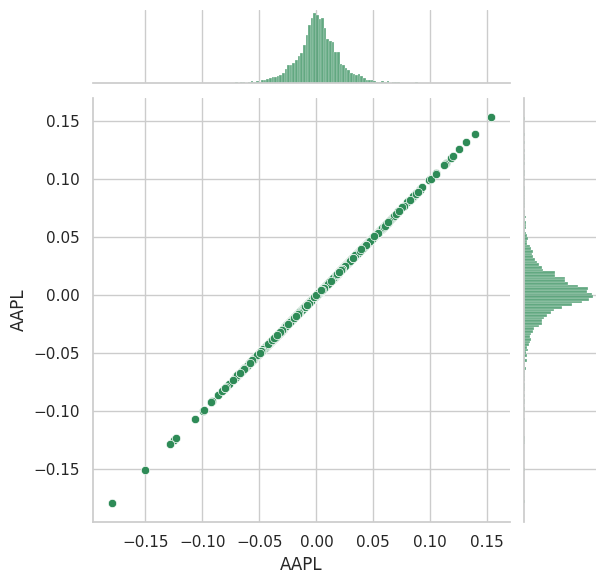

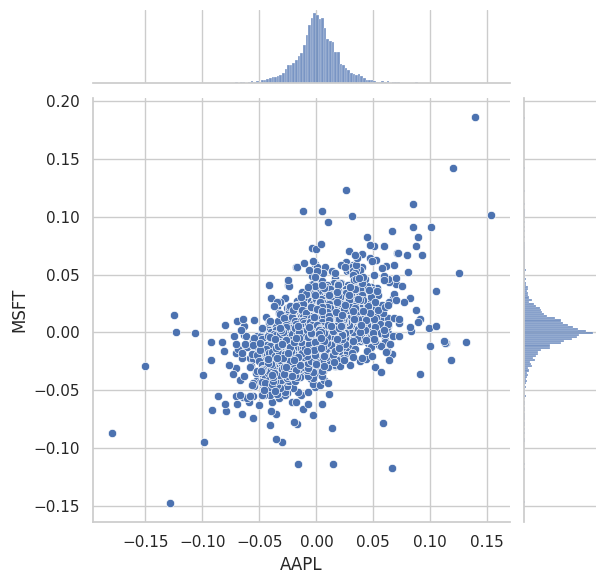

In [ ]:
# Comparing AAPL to itself (should be perfectly linear)
sns.jointplot(x='AAPL', y='AAPL', data=tech_rets, kind='scatter', color='seagreen')

# Compare AAPL vs MSFT daily returns
sns.jointplot(x='AAPL', y='MSFT', data=tech_rets, kind='scatter')


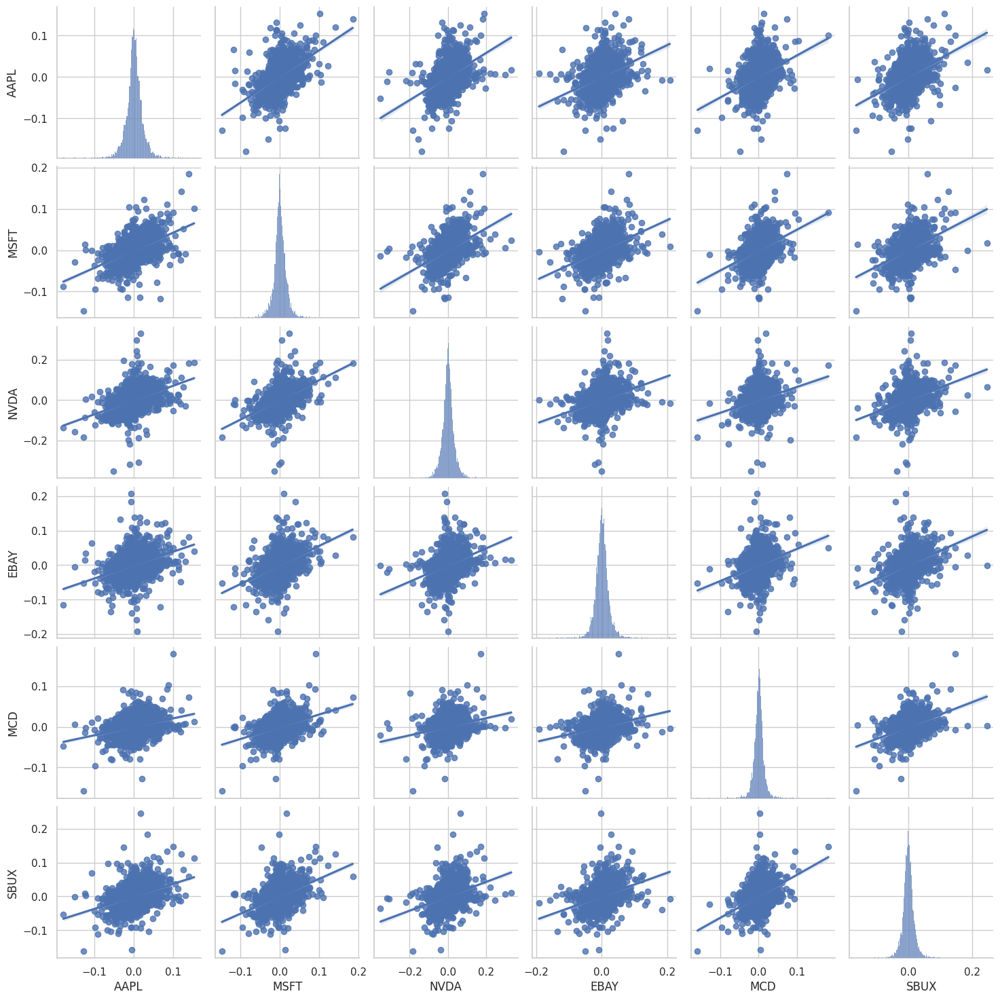

In [ ]:
sns.pairplot(tech_rets[ ["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]].dropna(), kind='reg')


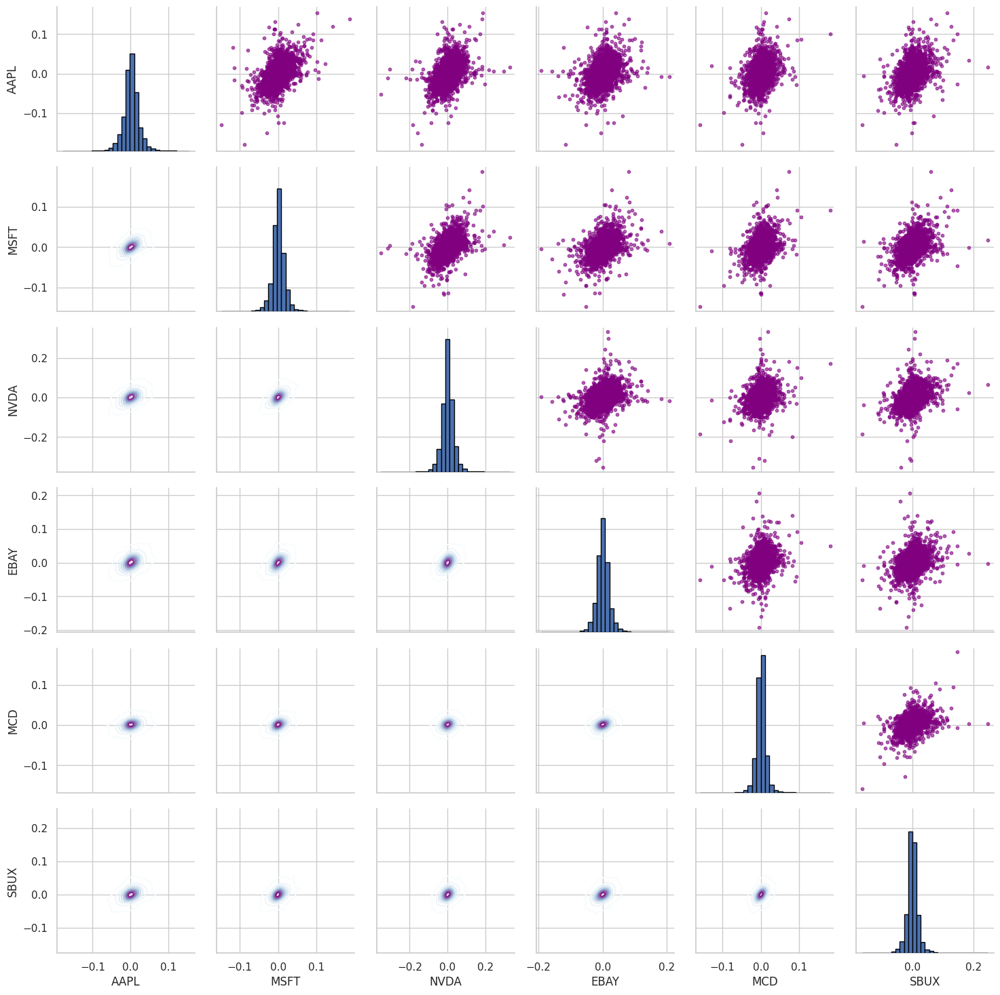

In [ ]:
return_fig = sns.PairGrid(tech_rets[["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]].dropna())
return_fig.map_upper(plt.scatter, s=10, alpha=0.6, color='purple')
return_fig.map_lower(sns.kdeplot, cmap='BuPu')   # 'cool_d' can error on some versions; 'BuPu' is safe
return_fig.map_diag(plt.hist, bins=30, edgecolor='black')


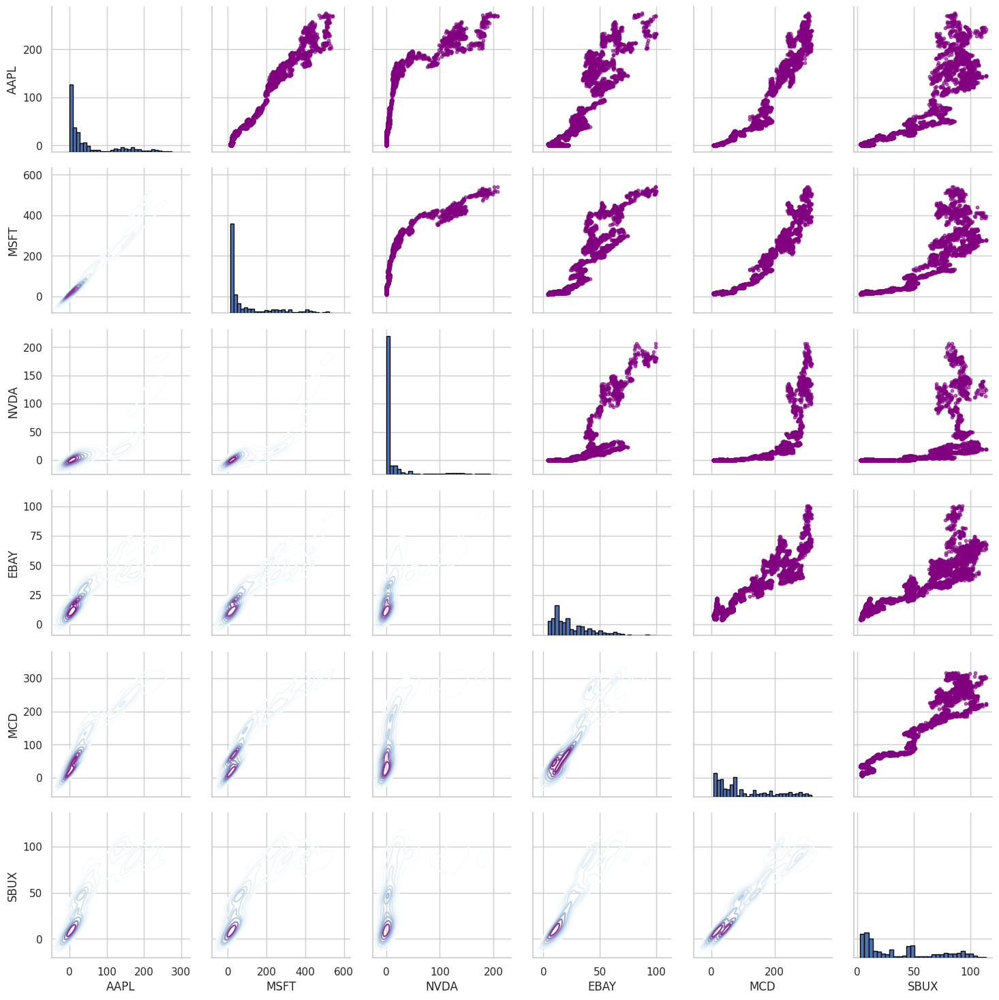

In [ ]:
returns_fig = sns.PairGrid(closing_df[["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]].dropna())
returns_fig.map_upper(plt.scatter, s=10, alpha=0.6, color='purple')
returns_fig.map_lower(sns.kdeplot, cmap='BuPu')
returns_fig.map_diag(plt.hist, bins=30, edgecolor='black')


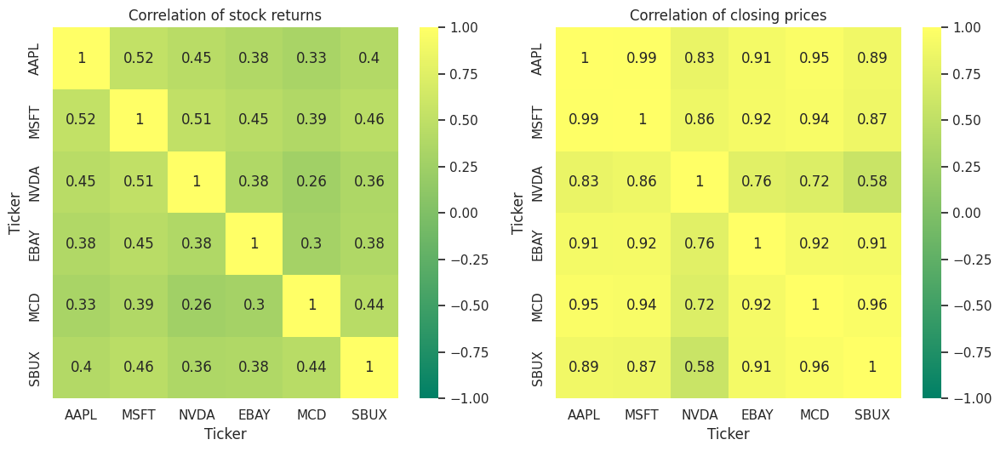

In [ ]:
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
sns.heatmap(tech_rets[["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]].corr(), annot=True, cmap='summer', vmin=-1, vmax=1)
plt.title('Correlation of stock returns')

plt.subplot(2, 2, 2)
sns.heatmap(closing_df[["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]].corr(), annot=True, cmap='summer', vmin=-1, vmax=1)
plt.title('Correlation of closing prices')

plt.tight_layout()


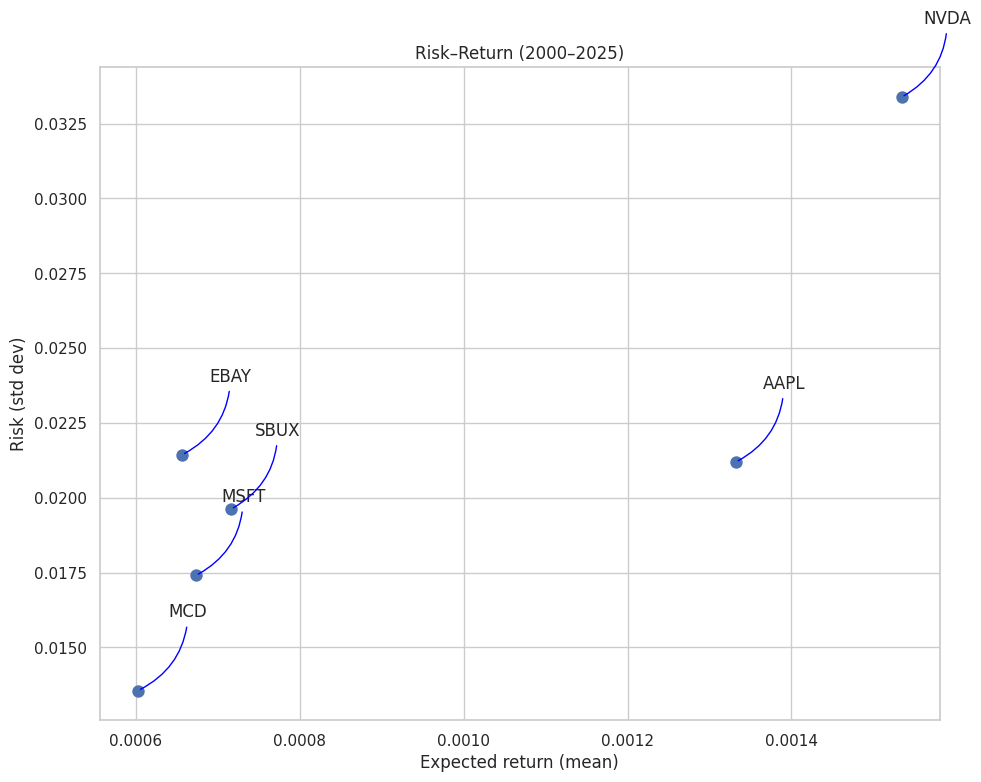

In [ ]:
rets = tech_rets[["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]].dropna()
area = np.pi * 20  # marker size

plt.figure(figsize=(10, 8))
plt.scatter(rets.mean(), rets.std(), s=area)
plt.xlabel('Expected return (mean)')
plt.ylabel('Risk (std dev)')

for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points',
                 ha='right', va='bottom',
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

plt.title('Risk–Return (2000–2025)')
plt.tight_layout()
plt.show()


# **LSTM VOLITILITY**

In [ ]:
# Uses your returns_percent_df from step 8
vol_targets = {t: returns_percent_df[t].abs().dropna() for t in tickers}


In [ ]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

lookback   = 60
train_frac = 0.80  # match your GARCH split

def make_windows_1feat(arr_2d, L):
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    return np.array(X).reshape(-1, L, 1), np.array(y).reshape(-1, 1)

Xtr_vol, Ytr_vol = {}, {}
Xte_vol, Yte_vol = {}, {}
scalers_vol      = {}
train_lens_vol   = {}
idx_tests_vol    = {}

for t in tickers:
    y_raw = vol_targets[t].values.reshape(-1,1)     # |r| in percent (>=0)
    scaler = MinMaxScaler((0,1))                    # nonnegative target
    y_sc   = scaler.fit_transform(y_raw)
    scalers_vol[t] = scaler

    N = len(y_sc)
    n_train = max(lookback+1, int(np.floor(train_frac * N)))
    train_lens_vol[t] = n_train

    Xtr, Ytr = make_windows_1feat(y_sc[:n_train, :], lookback)
    Xte, Yte = make_windows_1feat(y_sc[n_train - lookback:, :], lookback)

    Xtr_vol[t], Ytr_vol[t] = Xtr, Ytr
    Xte_vol[t], Yte_vol[t] = Xte, Yte

    # test index aligned to Yte
    idx_tests_vol[t] = vol_targets[t].index[n_train:]
    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape} | Xte{Xte.shape} Yte{Yte.shape} | N={N}, n_train={n_train}")


AAPL: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
MSFT: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
NVDA: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
EBAY: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
MCD: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
SBUX: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

models_vol = {}

for t in tickers:
    X_tr, Y_tr = Xtr_vol[t], Ytr_vol[t]
    if X_tr.size == 0:
        print(f"{t}: skipped (no train windows)")
        continue

    m = Sequential([
        LSTM(64, input_shape=(lookback,1), return_sequences=False),
        Dropout(0.2),
        Dense(1)  # predict next-day |r|% (scaled)
    ])
    m.compile(optimizer='adam', loss='mse')

    es = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)
    m.fit(X_tr, Y_tr, validation_split=0.1,
          epochs=60, batch_size=64,
          callbacks=[es], shuffle=False, verbose=0)

    models_vol[t] = m
    print(f"{t}: volatility LSTM trained")


AAPL: volatility LSTM trained
MSFT: volatility LSTM trained
NVDA: volatility LSTM trained
EBAY: volatility LSTM trained
MCD: volatility LSTM trained
SBUX: volatility LSTM trained


AAPL: LSTM volatility RMSE (|return|%): 1.198945


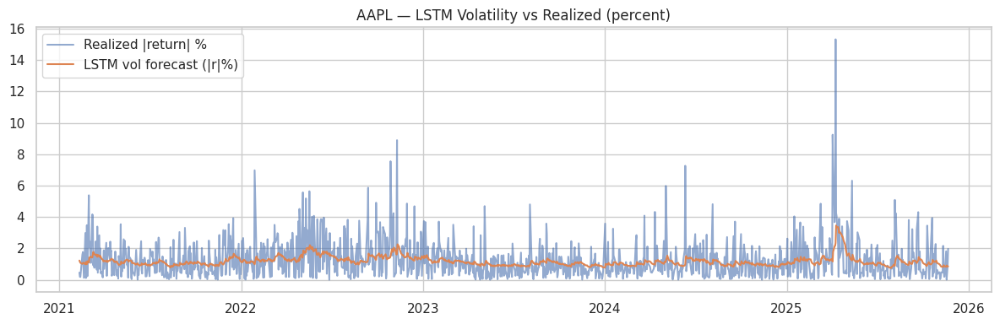

MSFT: LSTM volatility RMSE (|return|%): 1.093354


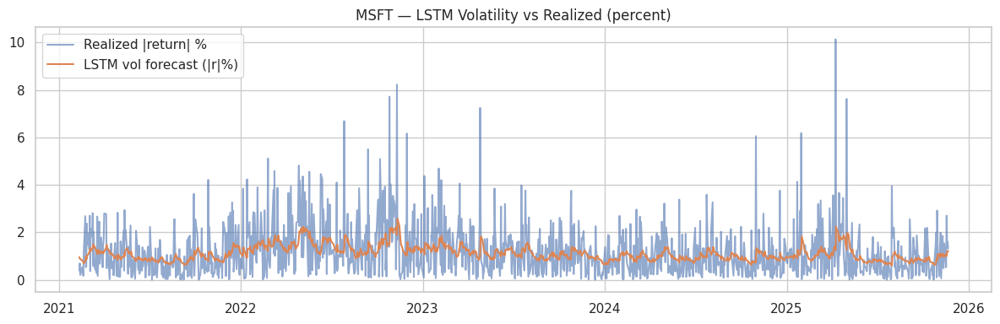

NVDA: LSTM volatility RMSE (|return|%): 2.212931


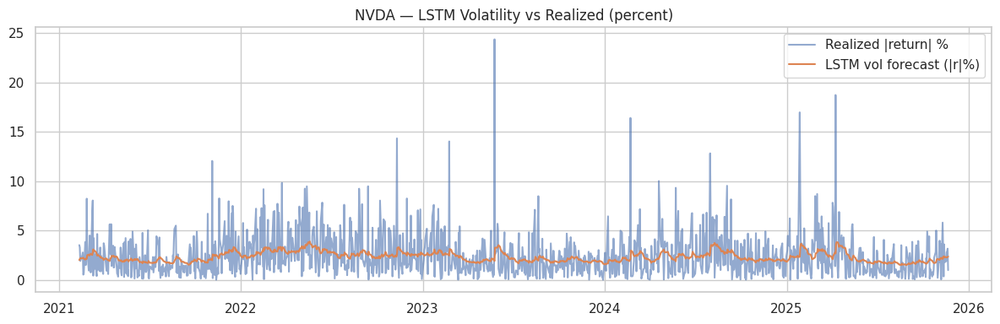

EBAY: LSTM volatility RMSE (|return|%): 1.490523


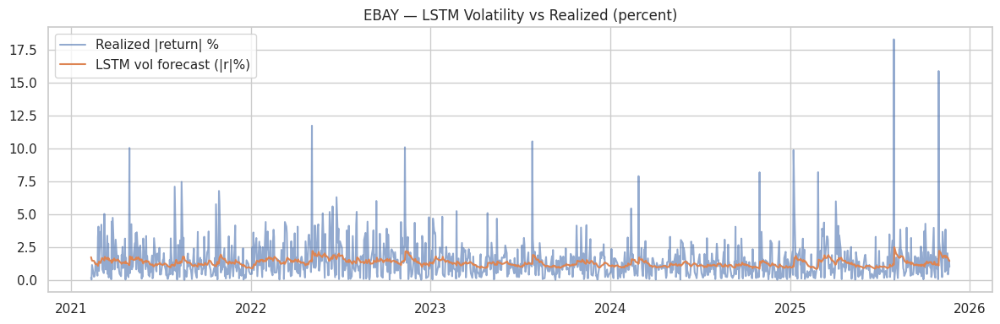

MCD: LSTM volatility RMSE (|return|%): 0.718666


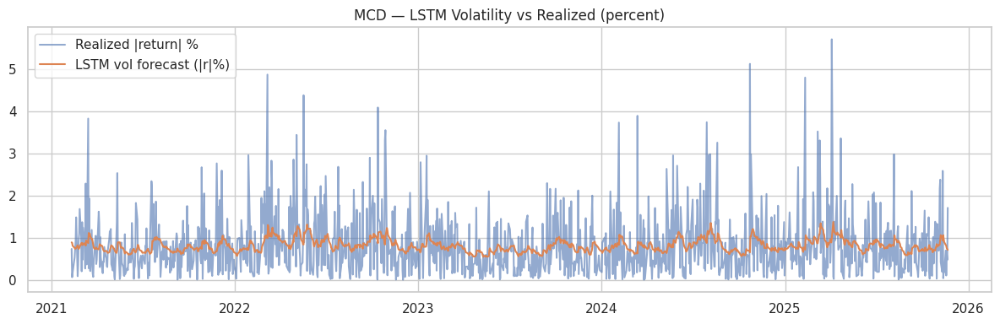

SBUX: LSTM volatility RMSE (|return|%): 1.488125


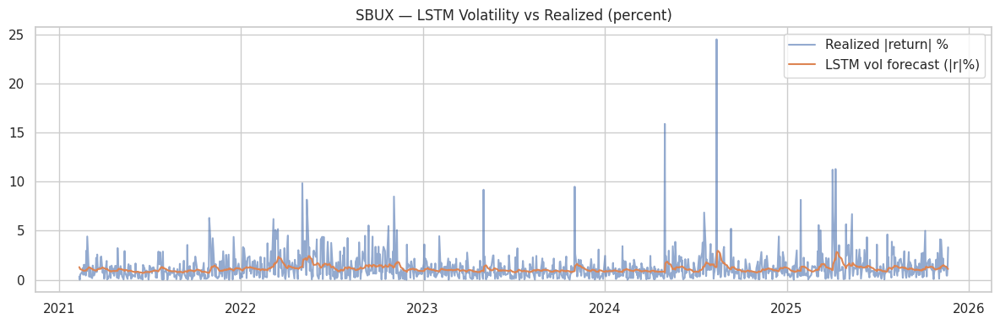


LSTM volatility RMSE (percent units):
AAPL    1.198945
EBAY    1.490523
MCD     0.718666
MSFT    1.093354
NVDA    2.212931
SBUX    1.488125
dtype: float64


In [ ]:
#Predict, inverse-transform to percent units, evaluate vs realized
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

lstm_vol_pred = {}   # predicted |r|% (percent)
lstm_vol_true = {}
lstm_vol_rmse = {}

for t in tickers:
    if t not in models_vol:
        continue

    X_te, Y_te = Xte_vol[t], Yte_vol[t]
    scaler     = scalers_vol[t]
    idx        = idx_tests_vol[t]

    # predict (scaled) -> inverse to percent
    yhat_sc = models_vol[t].predict(X_te, verbose=0)
    yhat    = scaler.inverse_transform(yhat_sc)
    ytrue   = scaler.inverse_transform(Y_te)

    m = min(len(ytrue), len(yhat))
    yhat, ytrue = yhat[:m], ytrue[:m]
    lstm_vol_pred[t], lstm_vol_true[t] = yhat, ytrue

    rmse = float(np.sqrt(mean_squared_error(ytrue, yhat)))
    lstm_vol_rmse[t] = rmse
    print(f"{t}: LSTM volatility RMSE (|return|%): {rmse:.6f}")

    # quick plot
    plt.figure(figsize=(12,4))
    plt.plot(idx[:m], ytrue[:m], label='Realized |return| %', alpha=0.6)
    plt.plot(idx[:m], yhat[:m],  label='LSTM vol forecast (|r|%)', linewidth=1.5)
    plt.title(f"{t} — LSTM Volatility vs Realized (percent)")
    plt.legend(); plt.tight_layout(); plt.show()

print("\nLSTM volatility RMSE (percent units):")
print(pd.Series(lstm_vol_rmse).sort_index().round(6))



Volatility RMSE comparison (percent units):
       Best_GARCH_Name  Best_GARCH_RMSE  LSTM_vol_RMSE  RollingStd30_RMSE
Ticker                                                                   
AAPL        GARCH(1,2)         1.321048       1.198945           1.309214
EBAY        GARCH(1,2)         1.607786       1.490523           1.642335
MCD         GARCH(1,1)         0.788600       0.718666           0.774280
MSFT        GARCH(2,2)         1.179683       1.093354           1.171501
NVDA        GARCH(2,1)         2.396218       2.212931           2.377734
SBUX        GARCH(2,1)         1.643275       1.488125           1.679728

Improvements (%): positive means LSTM better
        LSTM_vs_BestGARCH_impr_%  LSTM_vs_Baseline_impr_%
Ticker                                                   
AAPL                        9.24                     8.42
EBAY                        7.29                     9.24
MCD                         8.87                     7.18
MSFT                       

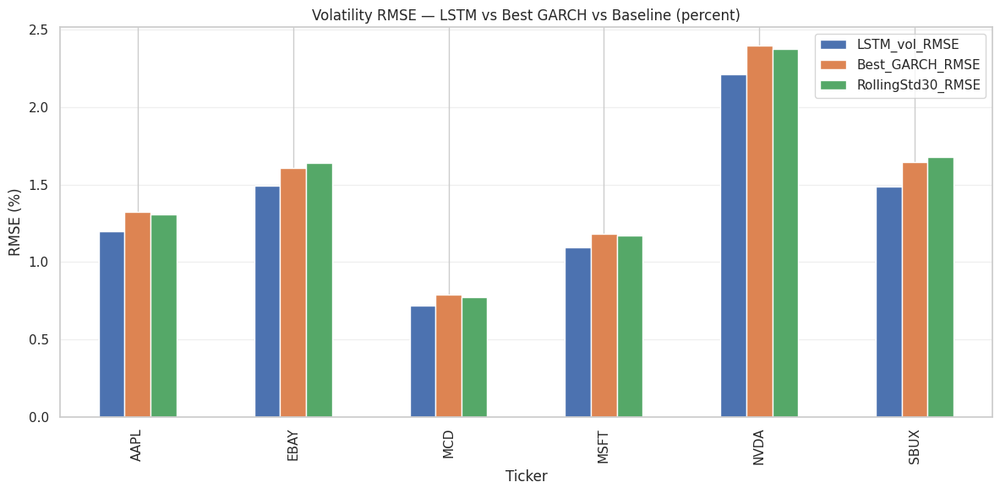

AAPL: Best GARCH = GARCH(1,2) (RMSE=1.321048)
EBAY: Best GARCH = GARCH(1,2) (RMSE=1.607786)
MCD: Best GARCH = GARCH(1,1) (RMSE=0.788600)
MSFT: Best GARCH = GARCH(2,2) (RMSE=1.179683)
NVDA: Best GARCH = GARCH(2,1) (RMSE=2.396218)
SBUX: Best GARCH = GARCH(2,1) (RMSE=1.643275)


In [ ]:
# === Build a clean comparison table ===
rows = []
for t in tickers:
    # Best GARCH for this ticker
    best_name, best_rmse = None, np.inf
    if t in fcasts_all:
        y_true = realized_all[t].values
        for name, yhat in fcasts_all[t].items():
            yhat = np.asarray(yhat)
            m = min(len(y_true), len(yhat))
            rmse_g = float(np.sqrt(mean_squared_error(y_true[:m], yhat[:m])))
            if rmse_g < best_rmse:
                best_rmse, best_name = rmse_g, name

    # Baseline
    y_true = realized_all[t].values
    base   = np.asarray(baseline_all[t])
    m2 = min(len(base), len(y_true))
    rmse_b = float(np.sqrt(mean_squared_error(y_true[:m2], base[:m2])))

    # LSTM vol (may be missing if not trained)
    rmse_lstm = lstm_vol_rmse.get(t, np.nan)

    rows.append({
        "Ticker": t,
        "Best_GARCH_Name": best_name,
        "Best_GARCH_RMSE": best_rmse,
        "LSTM_vol_RMSE": rmse_lstm,
        "RollingStd30_RMSE": rmse_b
    })

comp = pd.DataFrame(rows).set_index("Ticker").sort_index()
print("\nVolatility RMSE comparison (percent units):")
print(comp.round(6))

# === Optional: show % improvement of LSTM over best GARCH and baseline ===
comp["LSTM_vs_BestGARCH_impr_%"] = 100.0 * (comp["Best_GARCH_RMSE"] - comp["LSTM_vol_RMSE"]) / comp["Best_GARCH_RMSE"]
comp["LSTM_vs_Baseline_impr_%"] = 100.0 * (comp["RollingStd30_RMSE"] - comp["LSTM_vol_RMSE"]) / comp["RollingStd30_RMSE"]
print("\nImprovements (%): positive means LSTM better")
print(comp[["LSTM_vs_BestGARCH_impr_%", "LSTM_vs_Baseline_impr_%"]].round(2))

# === Bar plot with 3 comparable bars per ticker ===
ax = comp[["LSTM_vol_RMSE","Best_GARCH_RMSE","RollingStd30_RMSE"]].plot(kind="bar", figsize=(12,6))
ax.set_title("Volatility RMSE — LSTM vs Best GARCH vs Baseline (percent)")
ax.set_xlabel("Ticker"); ax.set_ylabel("RMSE (%)")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout(); plt.show()

# === (Optional) annotate which GARCH won per ticker ===
for t, row in comp.iterrows():
    print(f"{t}: Best GARCH = {row['Best_GARCH_Name']} (RMSE={row['Best_GARCH_RMSE']:.6f})")


# **HYBRID MODEL Y^=Weight* LSTM+weight*Garch**

Option A — Convex blend (simple & robust)
Constraint weights to a convex combo:
w∈[0,1], 𝑣=𝑤⋅𝑣^LSTM+(1−𝑤)⋅𝑣^GARCH Pick 𝑤 that minimises MSE on a fit slice (first 30% of your test window), then evaluate on the remaining 70%.

In [ ]:

garch_name = "GARCH(1,1)"   # or pick best per ticker if you prefer

hybrid_info = {}  # store weights & RMSEs

def align_three(idx_lstm, yhat_lstm, idx_garch, yhat_garch, y_true_series):
    df = pd.DataFrame({
        "lstm":  np.asarray(yhat_lstm).ravel(),
    }, index=idx_lstm).join(
        pd.DataFrame({"garch": np.asarray(yhat_garch).ravel()}, index=idx_garch),
        how="inner"
    ).join(
        y_true_series.rename("y_true"),
        how="inner"
    ).dropna()
    return df.index, df["y_true"].values.reshape(-1,1), df["lstm"].values.reshape(-1,1), df["garch"].values.reshape(-1,1)

def choose_w_grid(y_fit, x1_fit, x2_fit, step=0.01):
    best_w, best_rmse = 0.5, np.inf
    for w in np.arange(0.0, 1.0+step/2, step):
        yhat = w*x1_fit + (1.0-w)*x2_fit
        rmse = float(np.sqrt(mean_squared_error(y_fit, yhat)))
        if rmse < best_rmse:
            best_rmse, best_w = rmse, float(w)
    return best_w, 1.0-best_w, best_rmse

for t in tickers:
    # LSTM pieces (volatility)
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping"); continue
    idx_lstm  = idx_tests_vol[t]
    yhat_lstm = lstm_vol_pred[t]

    # GARCH forecast (percent) & dates
    if t not in fcasts_all or garch_name not in fcasts_all[t]:
        print(f"{t}: no {garch_name} — skipping"); continue
    idx_garch  = test_idx_all[t]
    yhat_garch = fcasts_all[t][garch_name]

    # Realized target (|return| in percent)
    y_true_ser = realized_all[t]

    # Align on common dates
    dates, y_true, x_lstm, x_garch = align_three(idx_lstm, yhat_lstm, idx_garch, yhat_garch, y_true_ser)
    m = len(dates)
    if m < 50:
        print(f"{t}: too few aligned points ({m}) — skipping"); continue

    # Split test into fit/eval (no leakage)
    k = max(10, int(0.30*m))
    y_fit, y_eval         = y_true[:k],  y_true[k:]
    x_lstm_fit, x_lstm_ev = x_lstm[:k],  x_lstm[k:]
    x_garc_fit, x_garc_ev = x_garch[:k], x_garch[k:]

    # Find convex weights on the fit slice
    w_lstm, w_garch, rmse_fit = choose_w_grid(y_fit, x_lstm_fit, x_garc_fit, step=0.01)

    # Evaluate
    rmse_lstm  = float(np.sqrt(mean_squared_error(y_eval, x_lstm_ev)))
    rmse_garch = float(np.sqrt(mean_squared_error(y_eval, x_garc_ev)))
    yhyb_ev    = w_lstm*x_lstm_ev + w_garch*x_garc_ev
    rmse_hyb   = float(np.sqrt(mean_squared_error(y_eval, yhyb_ev)))

    hybrid_info[t] = {
        "w_lstm": w_lstm, "w_garch": w_garch,
        "rmse_fit": rmse_fit,
        "rmse_eval_lstm": rmse_lstm,
        "rmse_eval_garch": rmse_garch,
        "rmse_eval_hybrid": rmse_hyb
    }
    print(f"{t}: w_lstm={w_lstm:.2f}, w_garch={w_garch:.2f} | eval RMSE — LSTM {rmse_lstm:.4f}, GARCH {rmse_garch:.4f}, HYBRID {rmse_hyb:.4f}")


AAPL: w_lstm=0.73, w_garch=0.27 | eval RMSE — LSTM 1.2268, GARCH 1.3700, HYBRID 1.2319
MSFT: w_lstm=0.74, w_garch=0.26 | eval RMSE — LSTM 1.1180, GARCH 1.2185, HYBRID 1.1204
NVDA: w_lstm=0.70, w_garch=0.30 | eval RMSE — LSTM 2.2666, GARCH 2.4885, HYBRID 2.2773
EBAY: w_lstm=0.66, w_garch=0.34 | eval RMSE — LSTM 1.4667, GARCH 1.6150, HYBRID 1.4708
MCD: w_lstm=1.00, w_garch=0.00 | eval RMSE — LSTM 0.7217, GARCH 0.7917, HYBRID 0.7217
SBUX: w_lstm=0.75, w_garch=0.25 | eval RMSE — LSTM 1.5793, GARCH 1.7577, HYBRID 1.5824


Option B — Learn weights by (ridge) regression

In [ ]:
from sklearn.linear_model import Ridge

hybrid_info_lr = {}

alpha = 1e-4  # small ridge

for t in tickers:
    if t not in lstm_vol_pred or t not in fcasts_all or garch_name not in fcasts_all[t]:
        continue

    idx_lstm  = idx_tests_vol[t]
    yhat_lstm = lstm_vol_pred[t]
    idx_garch = test_idx_all[t]
    yhat_garch = fcasts_all[t][garch_name]
    y_true_ser = realized_all[t]

    dates, y_true, x1, x2 = align_three(idx_lstm, yhat_lstm, idx_garch, yhat_garch, y_true_ser)
    m = len(dates)
    if m < 50:
        continue

    k = max(10, int(0.30*m))
    X_fit = np.hstack([x1[:k], x2[:k]])
    y_fit = y_true[:k]
    X_ev  = np.hstack([x1[k:], x2[k:]])
    y_ev  = y_true[k:]

    # Ridge regression
    reg = Ridge(alpha=alpha, fit_intercept=False)
    reg.fit(X_fit, y_fit.ravel())
    b1, b2 = map(float, reg.coef_)

    # Predictions
    yhat_l = x1[k:]
    yhat_g = x2[k:]
    yhat_h = X_ev @ np.array([b1, b2]).reshape(-1,1)

    rmse_l = float(np.sqrt(mean_squared_error(y_ev, yhat_l)))
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, yhat_g)))
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    hybrid_info_lr[t] = {"b_lstm": b1, "b_garch": b2,
                         "rmse_eval_lstm": rmse_l,
                         "rmse_eval_garch": rmse_g,
                         "rmse_eval_hybrid": rmse_h}
    print(f"{t}: β_lstm={b1:.3f}, β_garch={b2:.3f} | eval RMSE — LSTM {rmse_l:.4f}, GARCH {rmse_g:.4f}, HYBRID {rmse_h:.4f}")


AAPL: β_lstm=-0.803, β_garch=1.288 | eval RMSE — LSTM 1.2268, GARCH 1.3700, HYBRID 1.2556
MSFT: β_lstm=0.208, β_garch=0.637 | eval RMSE — LSTM 1.1180, GARCH 1.2185, HYBRID 1.1228
NVDA: β_lstm=0.074, β_garch=0.749 | eval RMSE — LSTM 2.2666, GARCH 2.4885, HYBRID 2.2979
EBAY: β_lstm=-0.013, β_garch=0.764 | eval RMSE — LSTM 1.4667, GARCH 1.6150, HYBRID 1.4772
MCD: β_lstm=0.563, β_garch=0.308 | eval RMSE — LSTM 0.7217, GARCH 0.7917, HYBRID 0.7203
SBUX: β_lstm=0.369, β_garch=0.489 | eval RMSE — LSTM 1.5793, GARCH 1.7577, HYBRID 1.5916


            LSTM     GARCH    Hybrid
Ticker                              
AAPL    1.226777  1.370006  1.255627
MSFT    1.118045  1.218462  1.122776
NVDA    2.266595  2.488502  2.297911
EBAY    1.466656  1.615004  1.477235
MCD     0.721745  0.791729  0.720340
SBUX    1.579340  1.757736  1.591566


<Figure size 1000x500 with 0 Axes>

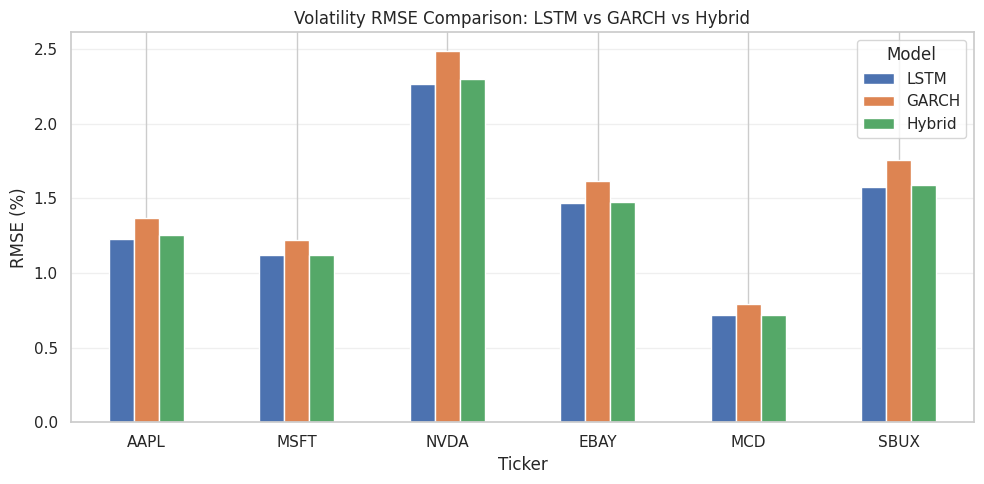

In [ ]:

# Build comparison DataFrame
plot_rows = []
for t in hybrid_info_lr:
    d = hybrid_info_lr[t]
    plot_rows.append({
        "Ticker": t,
        "LSTM": d["rmse_eval_lstm"],
        "GARCH": d["rmse_eval_garch"],
        "Hybrid": d["rmse_eval_hybrid"]
    })

df_plot = pd.DataFrame(plot_rows).set_index("Ticker")
print(df_plot.round(6))

# Bar chart
plt.figure(figsize=(10,5))
df_plot.plot(kind="bar", figsize=(10,5))

plt.title("Volatility RMSE Comparison: LSTM vs GARCH vs Hybrid")
plt.ylabel("RMSE (%)")
plt.xlabel("Ticker")
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model")
plt.tight_layout()
plt.show()


Option 1 — AdaBoost meta-learner (non-linear hybrid)

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

garch_name = "GARCH(2,2)"   # or pick per-ticker “best” first if you want

def align_three(idx_lstm, yhat_lstm, idx_garch, yhat_garch, y_true_series):
    df = pd.DataFrame({"lstm": np.asarray(yhat_lstm).ravel()}, index=idx_lstm).join(
        pd.DataFrame({"garch": np.asarray(yhat_garch).ravel()}, index=idx_garch), how="inner"
    ).join(y_true_series.rename("y_true"), how="inner").dropna()
    return df.index, df["y_true"].values.reshape(-1,1), df["lstm"].values.reshape(-1,1), df["garch"].values.reshape(-1,1)

ada_results = {}

for t in tickers:
    # need LSTM and GARCH forecasts
    if t not in lstm_vol_pred or t not in fcasts_all or garch_name not in fcasts_all[t]:
        continue

    idx_lstm, yh_lstm = idx_tests_vol[t], lstm_vol_pred[t]
    idx_garch, yh_garch = test_idx_all[t], fcasts_all[t][garch_name]
    y_true_ser = realized_all[t]

    dates, y_true, x1, x2 = align_three(idx_lstm, yh_lstm, idx_garch, yh_garch, y_true_ser)
    m = len(dates)
    if m < 60:  # need enough points
        continue

    # Optional third feature: RollingStd(30) aligned to same dates
    base = np.asarray(baseline_all[t]).reshape(-1,1)
    # align baseline to `dates`
    base_ser = pd.Series(base.flatten(), index=test_idx_all[t])  # baseline defined on test_idx_all
    base_aligned = base_ser.reindex(dates).values.reshape(-1,1)

    # Feature matrix X and target y
    X = np.hstack([x1, x2, base_aligned])   # [LSTM, GARCH, RollingStd]
    y = y_true

    # Train/validation split on test window (no leakage)
    k = max(10, int(0.30*m))
    X_fit, y_fit = X[:k], y[:k].ravel()
    X_ev,  y_ev  = X[k:], y[k:].ravel()

    # AdaBoost regressor
    ada = AdaBoostRegressor(
        estimator=DecisionTreeRegressor(max_depth=2),
        n_estimators=200,
        learning_rate=0.05,
        random_state=42
    )
    ada.fit(X_fit, y_fit)

    # Evaluate
    yhat_l = x1[k:].ravel()
    yhat_g = x2[k:].ravel()
    yhat_b = base_aligned[k:].ravel()
    yhat_h = ada.predict(X_ev)

    rmse_l = float(np.sqrt(mean_squared_error(y_ev, yhat_l)))
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, yhat_g)))
    rmse_b = float(np.sqrt(mean_squared_error(y_ev, yhat_b)))
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    ada_results[t] = {
        "rmse_lstm": rmse_l, "rmse_garch": rmse_g, "rmse_baseline": rmse_b, "rmse_ada": rmse_h,
        "n_eval": len(y_ev)
    }
    print(f"{t}: RMSE — LSTM {rmse_l:.4f} | GARCH {rmse_g:.4f} | Base {rmse_b:.4f} | AdaBoost {rmse_h:.4f}")


AAPL: RMSE — LSTM 1.2268 | GARCH 1.3662 | Base 1.3593 | AdaBoost 1.2610
MSFT: RMSE — LSTM 1.1180 | GARCH 1.2176 | Base 1.2122 | AdaBoost 1.1396
NVDA: RMSE — LSTM 2.2666 | GARCH 2.4884 | Base 2.4677 | AdaBoost 2.3430
EBAY: RMSE — LSTM 1.4667 | GARCH 1.6075 | Base 1.6418 | AdaBoost 1.7351
MCD: RMSE — LSTM 0.7217 | GARCH 0.7922 | Base 0.7761 | AdaBoost 0.7756
SBUX: RMSE — LSTM 1.5793 | GARCH 1.7702 | Base 1.7976 | AdaBoost 1.6235


In [ ]:
# After ada.fit(...)
fi = getattr(ada, "feature_importances_", None)
if fi is not None:
    print("Feature importances [LSTM, GARCH, RollingStd]:", fi)


Feature importances [LSTM, GARCH, RollingStd]: [0.68239713 0.24837788 0.06922499]


            LSTM     GARCH  Baseline  AdaBoost
Ticker                                        
AAPL    1.226777  1.366209  1.359268  1.260975
EBAY    1.466656  1.607541  1.641833  1.735055
MCD     0.721745  0.792190  0.776086  0.775634
MSFT    1.118045  1.217590  1.212181  1.139577
NVDA    2.266595  2.488361  2.467728  2.343040
SBUX    1.579340  1.770176  1.797606  1.623537


<Figure size 1000x500 with 0 Axes>

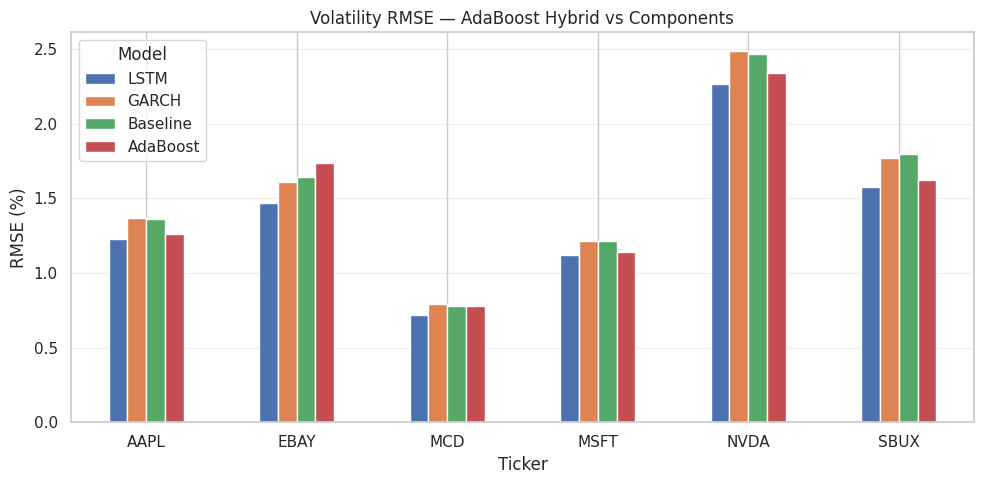

In [ ]:
# ---- Build DataFrame from ada_results ----
rows = []
for t, d in ada_results.items():
    rows.append({
        "Ticker": t,
        "LSTM": d["rmse_lstm"],
        "GARCH": d["rmse_garch"],
        "Baseline": d["rmse_baseline"],
        "AdaBoost": d["rmse_ada"],
    })
df_ada = pd.DataFrame(rows).set_index("Ticker").sort_index()
print(df_ada.round(6))

# ---- Grouped bar chart ----
plt.figure(figsize=(10,5))
df_ada.plot(kind="bar", figsize=(10,5))
plt.title("Volatility RMSE — AdaBoost Hybrid vs Components")
plt.ylabel("RMSE (%)"); plt.xlabel("Ticker")
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model")
plt.tight_layout()
plt.show()


In [ ]:
#Option 2 — If you need actual weights: Non-negative least squares (NNLS) or positive LinearRegression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

weights_results = {}

for t in tickers:
    if t not in lstm_vol_pred or t not in fcasts_all or garch_name not in fcasts_all[t]:
        continue

    idx_lstm, yh_lstm = idx_tests_vol[t], lstm_vol_pred[t]
    idx_garch, yh_garch = test_idx_all[t], fcasts_all[t][garch_name]
    y_true_ser = realized_all[t]

    dates, y_true, x1, x2 = align_three(idx_lstm, yh_lstm, idx_garch, yh_garch, y_true_ser)
    m = len(dates)
    if m < 60:
        continue

    # Optional baseline as a third column
    base_ser = pd.Series(np.asarray(baseline_all[t]).ravel(), index=test_idx_all[t])
    base_aligned = base_ser.reindex(dates).values.reshape(-1,1)

    X = np.hstack([x1, x2, base_aligned])  # columns: [LSTM, GARCH, RollingStd]
    y = y_true.ravel()

    k = max(10, int(0.30*m))
    X_fit, y_fit = X[:k], y[:k]
    X_ev,  y_ev  = X[k:], y[k:]

    # Linear regression with non-negative coefficients
    reg = LinearRegression(positive=True, fit_intercept=False)
    reg.fit(X_fit, y_fit)
    coefs = reg.coef_.astype(float)  # e.g., [w_lstm, w_garch, w_base] (all ≥ 0)

    # Optional: normalize to convex weights
    s = coefs.sum() if coefs.sum() > 0 else 1.0
    w = coefs / s

    yhat_h = X_ev @ w
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    # Baselines
    rmse_l = float(np.sqrt(mean_squared_error(y_ev, X_ev[:,0])))
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, X_ev[:,1])))
    rmse_b = float(np.sqrt(mean_squared_error(y_ev, X_ev[:,2])))

    weights_results[t] = {
        "weights_convex_[LSTM,GARCH,Base]": w.tolist(),
        "rmse_eval_hybrid": rmse_h,
        "rmse_eval_lstm": rmse_l,
        "rmse_eval_garch": rmse_g,
        "rmse_eval_base": rmse_b
    }
    print(f"{t}: weights(convex)={w} | RMSE — LSTM {rmse_l:.4f}, GARCH {rmse_g:.4f}, Base {rmse_b:.4f}, Hybrid {rmse_h:.4f}")


AAPL: weights(convex)=[0.        0.8949832 0.1050168] | RMSE — LSTM 1.2268, GARCH 1.3662, Base 1.3593, Hybrid 1.3624
MSFT: weights(convex)=[0.48259654 0.         0.51740346] | RMSE — LSTM 1.1180, GARCH 1.2176, Base 1.2122, Hybrid 1.1343
NVDA: weights(convex)=[0.47696026 0.         0.52303974] | RMSE — LSTM 2.2666, GARCH 2.4884, Base 2.4677, Hybrid 2.3122
EBAY: weights(convex)=[0.05838828 0.94161172 0.        ] | RMSE — LSTM 1.4667, GARCH 1.6075, Base 1.6418, Hybrid 1.5891
MCD: weights(convex)=[0.84156489 0.         0.15843511] | RMSE — LSTM 0.7217, GARCH 0.7922, Base 0.7761, Hybrid 0.7228
SBUX: weights(convex)=[0.40185045 0.59814955 0.        ] | RMSE — LSTM 1.5793, GARCH 1.7702, Base 1.7976, Hybrid 1.6398



NNLS Hybrid RMSE:
            LSTM     GARCH  Baseline    Hybrid
Ticker                                        
AAPL    1.226777  1.366209  1.359268  1.362410
EBAY    1.466656  1.607541  1.641833  1.589080
MCD     0.721745  0.792190  0.776086  0.722821
MSFT    1.118045  1.217590  1.212181  1.134255
NVDA    2.266595  2.488361  2.467728  2.312187
SBUX    1.579340  1.770176  1.797606  1.639833

Convex Weights (sum to 1):
        w_LSTM  w_GARCH  w_Base
Ticker                         
AAPL     0.000    0.895   0.105
EBAY     0.058    0.942   0.000
MCD      0.842    0.000   0.158
MSFT     0.483    0.000   0.517
NVDA     0.477    0.000   0.523
SBUX     0.402    0.598   0.000


<Figure size 1000x500 with 0 Axes>

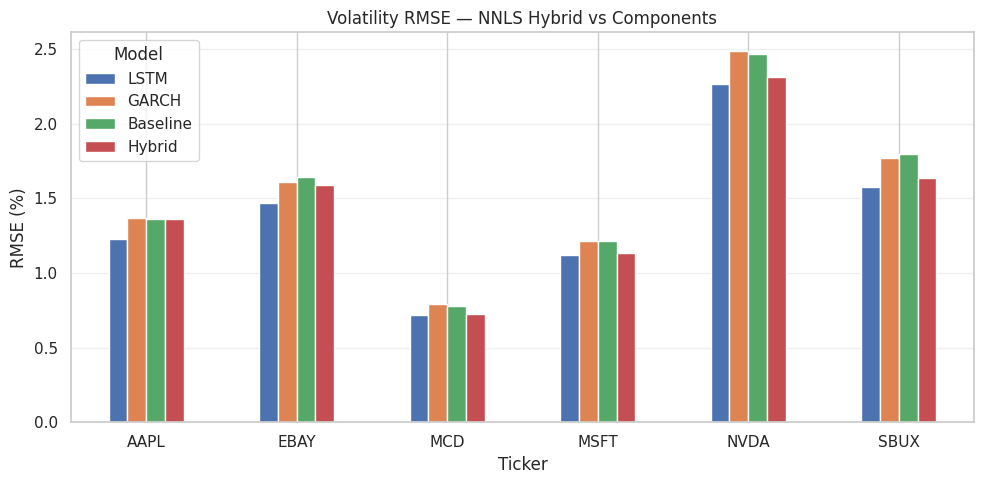

<Figure size 1000x500 with 0 Axes>

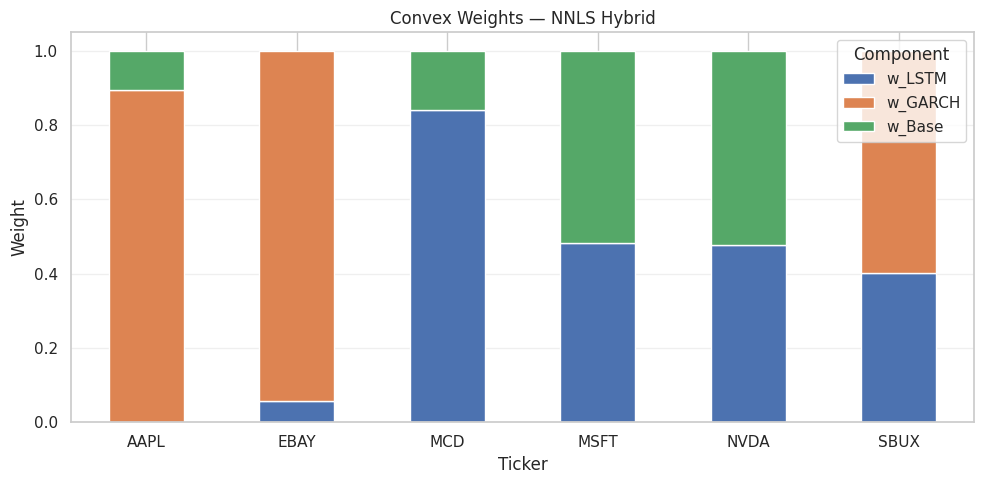

In [ ]:
# ---- RMSE comparison from weights_results ----
rows = []
w_rows = []
for t, d in weights_results.items():
    rows.append({
        "Ticker": t,
        "LSTM": d["rmse_eval_lstm"],
        "GARCH": d["rmse_eval_garch"],
        "Baseline": d["rmse_eval_base"],
        "Hybrid": d["rmse_eval_hybrid"],
    })
    # convex weights in order [LSTM, GARCH, Base]
    w = d["weights_convex_[LSTM,GARCH,Base]"]
    w_rows.append({"Ticker": t, "w_LSTM": w[0], "w_GARCH": w[1], "w_Base": w[2]})

df_w = pd.DataFrame(rows).set_index("Ticker").sort_index()
df_wts = pd.DataFrame(w_rows).set_index("Ticker").sort_index()

print("\nNNLS Hybrid RMSE:")
print(df_w.round(6))
print("\nConvex Weights (sum to 1):")
print(df_wts.round(3))

# ---- RMSE grouped bar ----
plt.figure(figsize=(10,5))
df_w.plot(kind="bar", figsize=(10,5))
plt.title("Volatility RMSE — NNLS Hybrid vs Components")
plt.ylabel("RMSE (%)"); plt.xlabel("Ticker")
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model")
plt.tight_layout()
plt.show()

# ---- Weights stacked bar (per ticker) ----
plt.figure(figsize=(10,5))
df_wts.plot(kind="bar", stacked=True, figsize=(10,5))
plt.title("Convex Weights — NNLS Hybrid")
plt.ylabel("Weight"); plt.xlabel("Ticker")
plt.ylim(0, 1.05)
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Component")
plt.tight_layout()
plt.show()


In [ ]:

rows_all = []

for t in tickers:

    # --- Base Models ---
    rmse_lstm = float(np.sqrt(mean_squared_error(realized_all[t], lstm_vol_pred[t][:len(realized_all[t])])))
    garch_name_best = garch_name if garch_name in fcasts_all[t] else list(fcasts_all[t].keys())[0]
    rmse_garch = float(np.sqrt(mean_squared_error(realized_all[t].values,
                             fcasts_all[t][garch_name_best][:len(realized_all[t])])))

    rmse_base = float(np.sqrt(mean_squared_error(realized_all[t].values,
                             baseline_all[t][:len(realized_all[t])])))

    rows_all.append({"Ticker": t, "Model": "LSTM_vol", "RMSE": rmse_lstm})
    rows_all.append({"Ticker": t, "Model": f"GARCH_best", "RMSE": rmse_garch})
    rows_all.append({"Ticker": t, "Model": "Baseline(30d)", "RMSE": rmse_base})

    # --- Hybrid A ---
    if t in hybrid_info:
        rows_all.append({"Ticker": t, "Model": "Hybrid_A_Convex",
                         "RMSE": hybrid_info[t]["rmse_eval_hybrid"]})

    # --- Hybrid B (Ridge) ---
    if t in hybrid_info_lr:
        rows_all.append({"Ticker": t, "Model": "Hybrid_B_Ridge",
                         "RMSE": hybrid_info_lr[t]["rmse_eval_hybrid"]})

    # --- Hybrid C (AdaBoost) ---
    if t in ada_results:
        rows_all.append({"Ticker": t, "Model": "Hybrid_C_AdaBoost",
                         "RMSE": ada_results[t]["rmse_ada"]})

    # --- Hybrid D (NNLS convex) ---
    if t in weights_results:
        rows_all.append({"Ticker": t, "Model": "Hybrid_D_NNLS",
                         "RMSE": weights_results[t]["rmse_eval_hybrid"]})

# Wide format
rmse_all_df = pd.DataFrame(rows_all)
rmse_all_wide = rmse_all_df.pivot(index="Ticker", columns="Model", values="RMSE")
rmse_all_wide = rmse_all_wide.sort_index()

print(rmse_all_wide.round(6))


Model   Baseline(30d)  GARCH_best  Hybrid_A_Convex  Hybrid_B_Ridge  \
Ticker                                                               
AAPL         1.309214    1.321049         1.231937        1.255627   
EBAY         1.642335    1.608001         1.470788        1.477235   
MCD          0.774280    0.789253         0.721745        0.720340   
MSFT         1.171501    1.179683         1.120367        1.122776   
NVDA         2.377734    2.398982         2.277311        2.297911   
SBUX         1.679728    1.652336         1.582431        1.591566   

Model   Hybrid_C_AdaBoost  Hybrid_D_NNLS  LSTM_vol  
Ticker                                              
AAPL             1.260975       1.362410  1.198945  
EBAY             1.735055       1.589080  1.490523  
MCD              0.775634       0.722821  0.718666  
MSFT             1.139577       1.134255  1.093354  
NVDA             2.343040       2.312187  2.212931  
SBUX             1.623537       1.639833  1.488125  


<Figure size 1600x700 with 0 Axes>

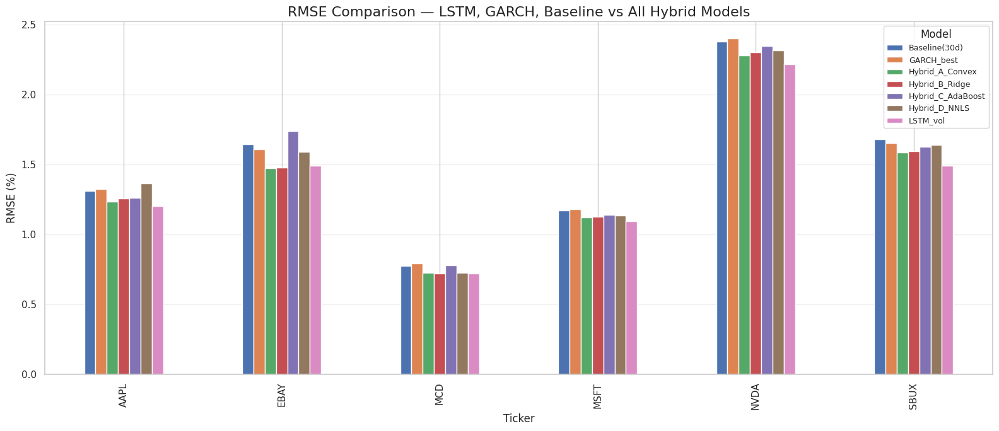

In [ ]:
plt.figure(figsize=(16, 7))
rmse_all_wide.plot(kind="bar", figsize=(16,7))

plt.title("RMSE Comparison — LSTM, GARCH, Baseline vs All Hybrid Models", fontsize=16)
plt.xlabel("Ticker")
plt.ylabel("RMSE (%)")
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model", fontsize=9)
plt.tight_layout()
plt.show()


# **LSTM Daily returns**

In [ ]:
# ==== SETUP ====
from datetime import datetime
from pandas_datareader import data as pdr

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error


import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

tickers = ["AAPL", "MSFT", "NVDA","EBAY","MCD", "SBUX"]

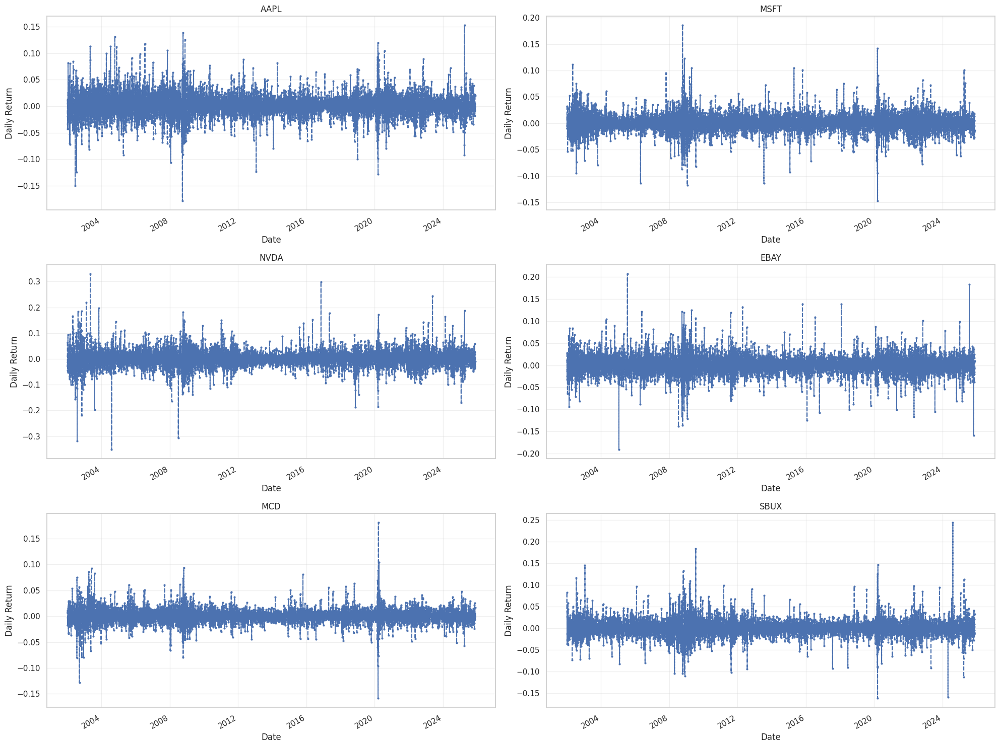

In [ ]:
# 1) Daily returns from your dataset (auto_adjust=True ⇒ use "Close")
returns = data1['Close'].pct_change().dropna()

# 2) Plot daily return percentage for all 7 tickers
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 15))
axes = axes.flatten()

for ax, ticker in zip(axes, tickers):
    returns[ticker].plot(ax=ax, legend=False, linestyle='--', marker='o', markersize=2)
    ax.set_title(ticker)
    ax.set_xlabel('Date')
    ax.set_ylabel('Daily Return')
    ax.grid(True, alpha=0.3)

fig.tight_layout()
plt.show()


In [ ]:

scaled_data = {}
scalers = {}

for t in returns.columns:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaled_data[t] = scaler.fit_transform(returns[t].values.reshape(-1,1))
    scalers[t] = scaler


In [ ]:
from statsmodels.tsa.stattools import adfuller
stationarity_results = {}

for t in returns.columns:
    series = returns[t].dropna()
    result = adfuller(series)
    p_value = result[1]
    status = "Stationary" if p_value < 0.05 else "Not Stationary"

    stationarity_results[t] = {
        "ADF Statistic": result[0],
        "p-value": p_value,
        "Conclusion": status
    }

for t, res in stationarity_results.items():
    print(f"{t}: p-value={res['p-value']:.5f} → {res['Conclusion']}")


AAPL: p-value=0.00000 → Stationary
EBAY: p-value=0.00000 → Stationary
MCD: p-value=0.00000 → Stationary
MSFT: p-value=0.00000 → Stationary
NVDA: p-value=0.00000 → Stationary
SBUX: p-value=0.00000 → Stationary


In [ ]:
lookback = 60
train_frac = 0.95

Xtrains, Ytrains = {}, {}
Xtests,  Ytests  = {}, {}
train_lens, idx_tests = {}, {}

def make_windows(arr_2d, L):
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    X = np.array(X).reshape(-1, L, 1)
    y = np.array(y).reshape(-1, 1)
    return X, y

for t in tickers:
    r_sc = scaled_data[t]                  # (N,1)
    n = len(r_sc)
    n_train = max(lookback + 1, int(np.ceil(train_frac * n)))
    train_lens[t] = n_train
    idx_tests[t]  = returns.index[n_train:]   # aligns to test labels

    # TRAIN windows
    Xtr, Ytr = make_windows(r_sc[:n_train, :], lookback)
    Xtrains[t], Ytrains[t] = Xtr, Ytr

    # TEST windows (with lookback context)
    Xte, Yte = make_windows(r_sc[n_train - lookback:, :], lookback)
    Xtests[t], Ytests[t] = Xte, Yte

    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape}  Xte{Xte.shape} Yte{Yte.shape}  n_train={n_train} n={n}")


AAPL: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)  n_train=5712 n=6012
MSFT: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)  n_train=5712 n=6012
NVDA: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)  n_train=5712 n=6012
EBAY: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)  n_train=5712 n=6012
MCD: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)  n_train=5712 n=6012
SBUX: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)  n_train=5712 n=6012


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

models = {}

for t in tickers:
    x_train = Xtrains[t]; y_train = Ytrains[t]
    if x_train.size == 0:
        print(f"{t}: skipped (no train windows)");
        continue

    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    es = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)

    # IMPORTANT: shuffle=False for time series
    model.fit(x_train, y_train,
              validation_split=0.1,
              epochs=60,
              batch_size=64,
              callbacks=[es],
              shuffle=False,          # <- add this
              verbose=0)

    models[t] = model
    print(f"{t} — training done")



AAPL — training done
MSFT — training done
NVDA — training done
EBAY — training done
MCD — training done
SBUX — training done


In [ ]:
preds, rmses = {}, {}

for t in tickers:
    scaler = scalers[t]
    r_sc   = scaled_data[t]                  # ✅ use the correct dict
    N      = r_sc.shape[0]
    training_data_len = train_lens[t]
    model  = models[t]

    if training_data_len < lookback:
        print(f"{t}: training_data_len < {lookback} — skipping")
        continue

    # Build test windows from scaled returns (we already have them!)
    x_test = Xtests[t]                       # ✅ reuse prepared windows
    n_windows = x_test.shape[0]

    # True y (UNSCALED returns) aligned to those windows
    y_all  = returns[[t]].values            # (N,1)
    y_test = y_all[training_data_len: training_data_len + n_windows, :]

    # Predict scaled, then inverse-transform to return units
    yhat_sc    = model.predict(x_test, verbose=0)
    predictions = scaler.inverse_transform(yhat_sc)

    # Align lengths defensively
    m = min(len(predictions), len(y_test))
    predictions = predictions[:m]
    y_test = y_test[:m]

    rmse = float(np.sqrt(np.mean((predictions - y_test) ** 2)))
    print(f"{t} RMSE: {rmse:.4f}")

    preds[t]  = predictions
    rmses[t]  = rmse


AAPL RMSE: 0.0195
MSFT RMSE: 0.0150
NVDA RMSE: 0.0303
EBAY RMSE: 0.0228
MCD RMSE: 0.0114
SBUX RMSE: 0.0199


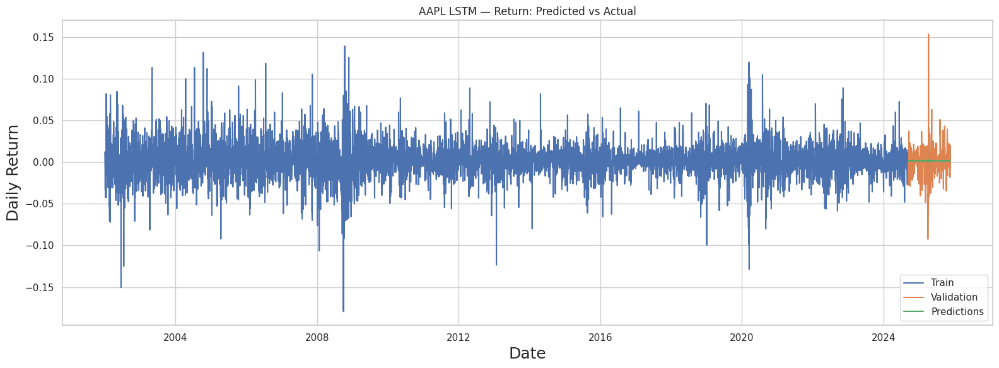

              Actual  Predictions
Date                             
2025-11-17 -0.018171     0.001507
2025-11-18 -0.000075     0.001673
2025-11-19  0.004188     0.001652
2025-11-20 -0.008601     0.001548
2025-11-21  0.019681     0.001560


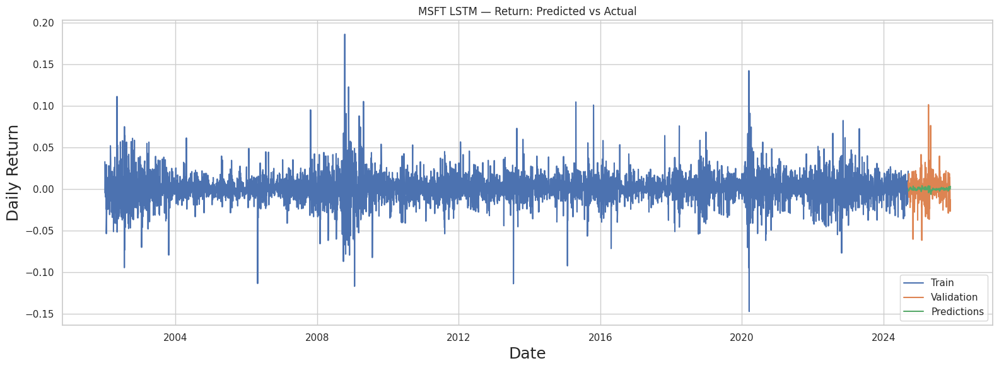

              Actual  Predictions
Date                             
2025-11-17 -0.005273    -0.000247
2025-11-18 -0.026996     0.000060
2025-11-19 -0.013508     0.001880
2025-11-20 -0.016001     0.002569
2025-11-21 -0.013189     0.003019


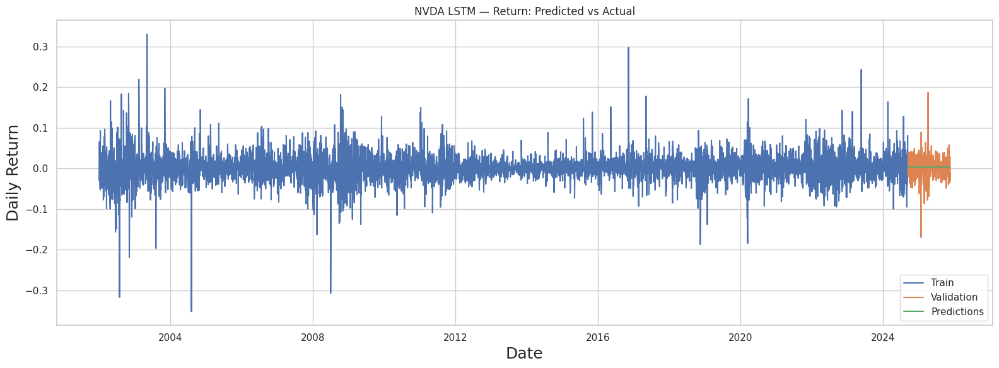

              Actual  Predictions
Date                             
2025-11-17 -0.018773     0.003843
2025-11-18 -0.028081     0.003807
2025-11-19  0.028452     0.003751
2025-11-20 -0.031525     0.003817
2025-11-21 -0.009743     0.003754


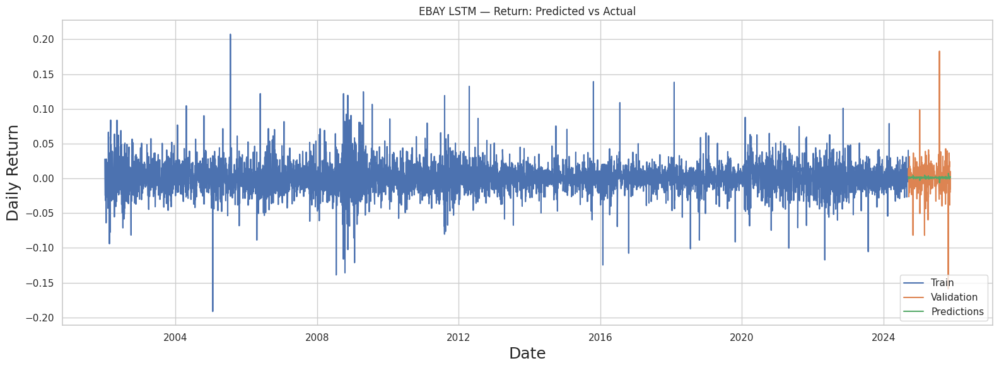

              Actual  Predictions
Date                             
2025-11-17 -0.020155     0.001896
2025-11-18 -0.004017     0.002244
2025-11-19 -0.006721     0.001650
2025-11-20 -0.015133     0.001535
2025-11-21  0.009869     0.001788


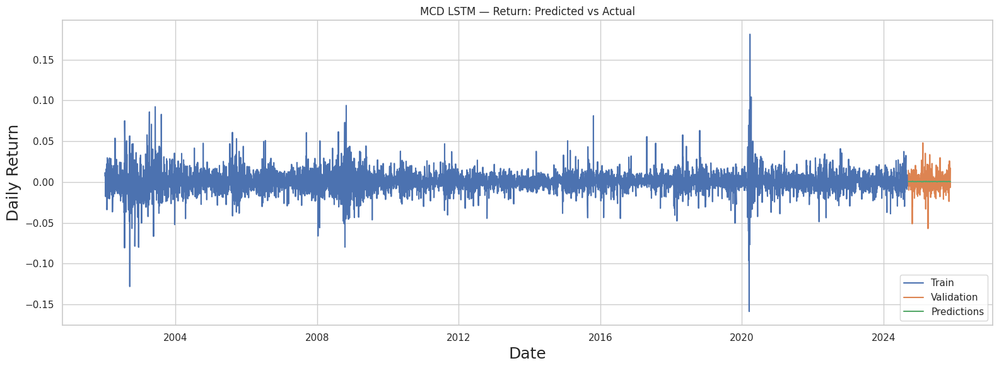

              Actual  Predictions
Date                             
2025-11-17 -0.006937     0.000439
2025-11-18 -0.001017     0.000517
2025-11-19 -0.006074     0.000569
2025-11-20  0.004691     0.000625
2025-11-21  0.017063     0.000620


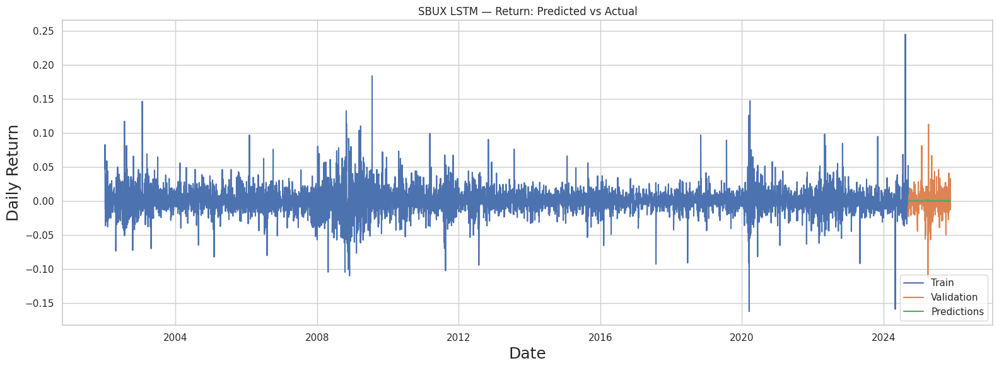

              Actual  Predictions
Date                             
2025-11-17 -0.012857     0.000241
2025-11-18 -0.004302     0.000533
2025-11-19  0.004200     0.000628
2025-11-20 -0.012667     0.000531
2025-11-21  0.033043     0.000626


In [ ]:
for t in tickers:
    ser = returns[t]
    predictions = preds[t].ravel()
    training_data_len = train_lens[t]

    train = ser.iloc[:training_data_len]
    valid = ser.iloc[training_data_len:].to_frame(name='Actual').copy()
    valid['Predictions'] = predictions[:len(valid)]

    plt.figure(figsize=(16,6))
    plt.title(f'{t} LSTM — Return: Predicted vs Actual')
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Daily Return', fontsize=18)
    plt.plot(train.index, train.values, label='Train')
    plt.plot(valid.index, valid['Actual'].values, label='Validation')
    plt.plot(valid.index, valid['Predictions'].values, label='Predictions')
    plt.legend(loc='lower right'); plt.tight_layout(); plt.show()

    print(valid.tail())


In [ ]:
from sklearn.preprocessing import MinMaxScaler

lookback   = 60
train_frac = 0.95  # matches your earlier style

scalers     = {}   # ticker -> MinMaxScaler(-1,1)
scaled      = {}   # ticker -> np.array (N,1) scaled returns
train_lens  = {}   # ticker -> n_train
idx_tests   = {}   # ticker -> DatetimeIndex for test

for t in tickers:
    r = returns[t].dropna().values.reshape(-1, 1)
    scaler = MinMaxScaler(feature_range=(-1, 1))
    r_sc   = scaler.fit_transform(r)

    scalers[t] = scaler
    scaled[t]  = r_sc

    n = len(r_sc)
    n_train = max(lookback + 1, int(np.ceil(train_frac * n)))
    train_lens[t] = n_train
    idx_tests[t]  = returns.index[n_train:]  # aligns with test labels later

    print(f"{t}: N={n}, n_train={n_train}")


AAPL: N=6012, n_train=5712
MSFT: N=6012, n_train=5712
NVDA: N=6012, n_train=5712
EBAY: N=6012, n_train=5712
MCD: N=6012, n_train=5712
SBUX: N=6012, n_train=5712


In [ ]:
#Build train/test windows from scaled returns
def make_windows(arr_2d, L):
    # arr_2d: (N,1) scaled; returns X:(N-L, L, 1), y:(N-L, 1)
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    X = np.array(X).reshape(-1, L, 1)
    y = np.array(y).reshape(-1, 1)
    return X, y

Xtrains, Ytrains = {}, {}
Xtests,  Ytests  = {}, {}

for t in tickers:
    r_sc   = scaled[t]
    n      = len(r_sc)
    n_train = train_lens[t]

    # train windows (only train slice)
    Xtr, Ytr = make_windows(r_sc[:n_train, :], lookback)
    Xtrains[t], Ytrains[t] = Xtr, Ytr

    # test windows (with lookback context from end of train)
    Xte, Yte = make_windows(r_sc[n_train - lookback:, :], lookback)
    Xtests[t], Ytests[t] = Xte, Yte

    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape}  Xte{Xte.shape} Yte{Yte.shape}")


AAPL: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)
MSFT: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)
NVDA: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)
EBAY: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)
MCD: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)
SBUX: Xtr(5652, 60, 1) Ytr(5652, 1)  Xte(300, 60, 1) Yte(300, 1)


Train an LSTM per ticker (on returns)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

models = {}

for t in tickers:
    X_tr, Y_tr = Xtrains[t], Ytrains[t]
    if X_tr.size == 0:
        print(f"{t}: skipped (no train windows)")
        continue

    model = Sequential([
        LSTM(64, input_shape=(lookback, 1), return_sequences=False),
        Dropout(0.2),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')

    es = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)
    model.fit(X_tr, Y_tr, validation_split=0.1, epochs=60, batch_size=64,
              callbacks=[es], verbose=0)

    models[t] = model
    print(f"{t}: training done")


AAPL: training done
MSFT: training done
NVDA: training done
EBAY: training done
MCD: training done
SBUX: training done


AAPL: LSTM RMSE (returns) = 0.019543


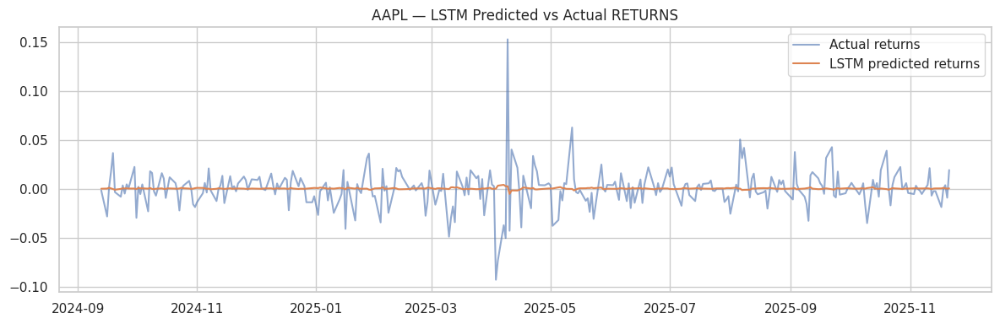

MSFT: LSTM RMSE (returns) = 0.015039


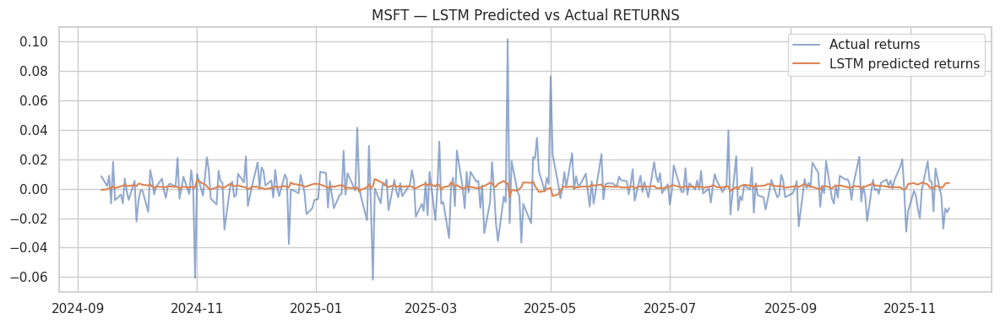

NVDA: LSTM RMSE (returns) = 0.030276


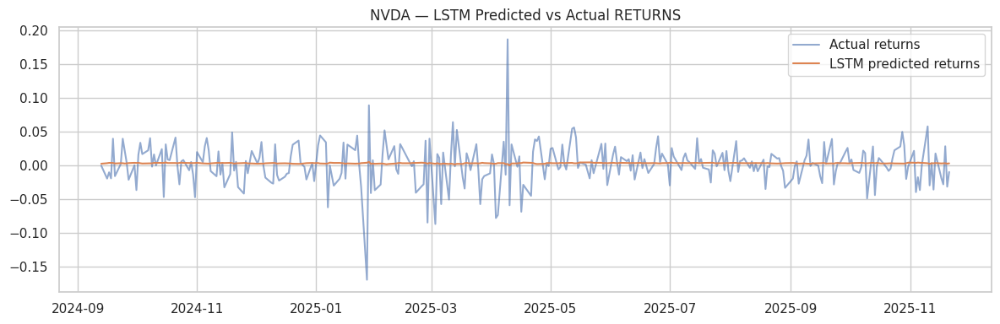

EBAY: LSTM RMSE (returns) = 0.022839


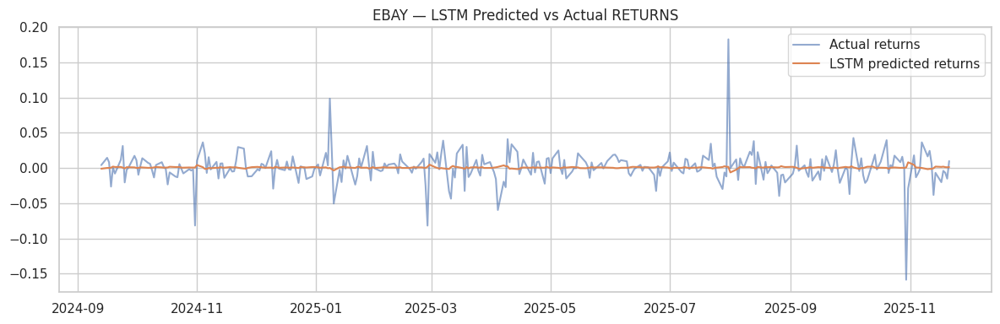

MCD: LSTM RMSE (returns) = 0.011417


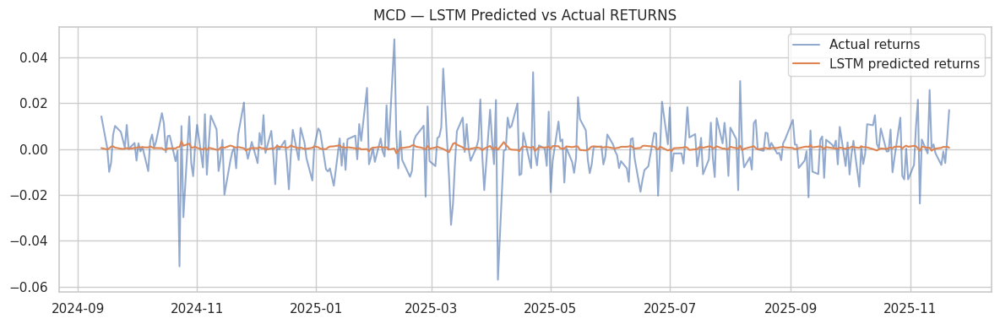

SBUX: LSTM RMSE (returns) = 0.019944


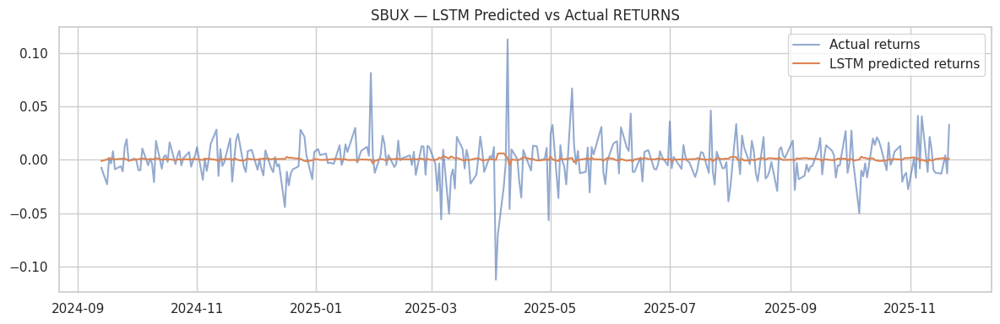


LSTM RMSE per ticker (return units):
AAPL    0.019543
EBAY    0.022839
MCD     0.011417
MSFT    0.015039
NVDA    0.030276
SBUX    0.019944
dtype: float64


In [ ]:
from sklearn.metrics import mean_squared_error
import pandas as pd
import matplotlib.pyplot as plt

lstm_returns_pred = {}   # ticker -> (n_test,1) predicted returns (unscaled)
lstm_returns_true = {}   # ticker -> (n_test,1) true returns (unscaled)
lstm_rmse_returns = {}   # ticker -> float

for t in tickers:
    model = models.get(t)
    if model is None:
        continue

    X_te, Y_te = Xtests[t], Ytests[t]
    scaler     = scalers[t]

    # predict scaled returns -> inverse-transform to return units
    yhat_sc = model.predict(X_te, verbose=0)
    yhat    = scaler.inverse_transform(yhat_sc)
    ytrue   = scaler.inverse_transform(Y_te)

    lstm_returns_pred[t] = yhat
    lstm_returns_true[t] = ytrue

    rmse_ret = float(np.sqrt(mean_squared_error(ytrue, yhat)))
    lstm_rmse_returns[t] = rmse_ret
    print(f"{t}: LSTM RMSE (returns) = {rmse_ret:.6f}")

    # returns plot
    idx = idx_tests[t]
    plt.figure(figsize=(12,4))
    plt.plot(idx, ytrue, label='Actual returns', alpha=0.6)
    plt.plot(idx, yhat,  label='LSTM predicted returns', linewidth=1.5)
    plt.title(f"{t} — LSTM Predicted vs Actual RETURNS")
    plt.legend(); plt.tight_layout(); plt.show()

# summary
rmse_series = pd.Series(lstm_rmse_returns).sort_index().round(6)
print("\nLSTM RMSE per ticker (return units):")
print(rmse_series)


# ***[Transformer Architecture]

In [ ]:
# If needed:
# !pip install torch==2.* transformers==4.* -q

import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from transformers import TimeSeriesTransformerConfig, TimeSeriesTransformerForPrediction
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error



2) Sliding-window dataset (univariate)

In [ ]:
class WindowDataset(Dataset):
    def __init__(self, series: np.ndarray, window: int = 60, horizon: int = 1):
        """
        series: 1D numpy array (train or test segment of target)
        window: lookback length
        horizon: predict next-step (default 1)
        """
        self.x = []
        self.y = []
        for i in range(window, len(series) - horizon + 1):
            self.x.append(series[i-window:i])          # [window]
            self.y.append(series[i:i+horizon])         # [horizon]
        self.x = np.asarray(self.x, dtype=np.float32)
        self.y = np.asarray(self.y, dtype=np.float32)

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        return self.x[idx], self.y[idx]


3) Collate to the HF model’s expected shapes

HF TimeSeriesTransformer expects shape (batch, time) (or with features).
We’ll keep it univariate and predict horizon=1 step-ahead.

In [ ]:
def collate(batch):
    X, Y = zip(*batch)                         # lists of [window] and [horizon]
    X = torch.tensor(np.stack(X))              # (B, window)
    Y = torch.tensor(np.stack(Y))              # (B, horizon)
    # Model expects (B, time, channels). For univariate channels=1.
    X = X.unsqueeze(-1)                        # -> (B, window, 1)
    Y = Y.unsqueeze(-1)                        # -> (B, horizon, 1)
    return X, Y


4) Helper: build train/test windows from your series & indices

In [ ]:
def build_train_test_windows(series: pd.Series, train_len: int, window=60, horizon=1):
    arr = series.values.astype(np.float32)
    train_arr = arr[:train_len]
    test_arr  = arr[train_len-window:]   # include overlap for windows

    dtrain = WindowDataset(train_arr, window, horizon)
    dtest  = WindowDataset(test_arr,  window, horizon)

    return dtrain, dtest


5) Configure the TimeSeriesTransformer

In [ ]:
def make_tst_config(context_length=60, prediction_length=1, d_model=64, n_heads=4, d_ff=128, dropout=0.1):
    return TimeSeriesTransformerConfig(
        prediction_length=prediction_length,
        context_length=context_length,
        d_model=d_model,
        encoder_layers=2,
        decoder_layers=2,
        num_attention_heads=n_heads,
        dropout=dropout,
        activation_function="gelu",
        # univariate
        input_size=1
    )


Train function (simple Adam loop)

In [ ]:
def train_tst_model(dtrain, config, epochs=20, batch_size=64, lr=1e-3, device=None):
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model = TimeSeriesTransformerForPrediction(config).to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    crit = nn.MSELoss()

    loader = DataLoader(dtrain, batch_size=batch_size, shuffle=True, collate_fn=collate)
    model.train()
    for ep in range(1, epochs+1):
        total = 0.0
        for X, Y in loader:
            X = X.to(device)                       # (B, ctx, 1)
            Y = Y.to(device)                       # (B, pred_len, 1)

            outputs = model(past_values=X, future_values=Y)  # teacher-forcing
            # HF model returns a tuple; first item has .loss if future_values provided
            loss = outputs.loss
            opt.zero_grad()
            loss.backward()
            opt.step()
            total += loss.item() * X.size(0)

        print(f"Epoch {ep:02d} | train MSE: {total/len(dtrain):.6f}")
    return model


# Predict on test windows & realign to your test index

In [ ]:
@torch.no_grad()
def predict_tst(model, dtest, device=None):
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    loader = DataLoader(dtest, batch_size=256, shuffle=False, collate_fn=collate)

    preds = []
    for X, _ in loader:
        X = X.to(device)
        out = model(past_values=X)
        # out.predictions: (B, prediction_length, input_size)
        yhat = out.predictions.squeeze(-1).cpu().numpy()   # (B, horizon)
        preds.append(yhat)
    preds = np.vstack(preds).ravel()  # horizon=1 -> (N,)
    return preds


# End-to-end per-ticker (Transformer + Hybrid)

In [ ]:
def run_transformer_and_hybrid(
    tickers, realized_all, train_lens, test_idx_all,
    lstm_vol_pred, fcasts_all, garch_name,
    window=60, horizon=1, epochs=20
):
    results = {}
    for t in tickers:
        if t not in realized_all or t not in train_lens:
            continue
        if t not in lstm_vol_pred or t not in fcasts_all or garch_name not in fcasts_all[t]:
            continue

        y_true_ser = realized_all[t]                       # pandas Series
        train_len   = train_lens[t]
        idx_test    = test_idx_all[t]                      # pandas DatetimeIndex for test
        y_true_full = y_true_ser.values.astype(np.float32)

        # Build datasets
        dtrain, dtest = build_train_test_windows(y_true_ser, train_len, window, horizon)

        # Train Transformer
        config = make_tst_config(context_length=window, prediction_length=horizon)
        model  = train_tst_model(dtrain, config, epochs=epochs)

        # Predict Transformer on test windows
        yhat_t = predict_tst(model, dtest)                # length = len(test) - window - horizon + 1

        # Align test segment length:
        # dtest uses series[train_len-window:], so number of predictions equals len(y_true_ser) - train_len
        # because horizon=1 and window alignment. Confirm lengths:
        n_test = len(y_true_ser) - train_len
        assert len(yhat_t) == n_test, (len(yhat_t), n_test)

        # Collect other model preds (assumed aligned to test index already)
        y_true = y_true_full[train_len:]                  # (n_test,)
        yhat_l = np.asarray(lstm_vol_pred[t], dtype=np.float32)
        yhat_g = np.asarray(fcasts_all[t][garch_name], dtype=np.float32)

        # In case of any trailing misalignment, clip to min length
        m = min(len(y_true), len(yhat_l), len(yhat_g), len(yhat_t))
        y_true = y_true[:m]; yhat_l = yhat_l[:m]; yhat_g = yhat_g[:m]; yhat_t = yhat_t[:m]

        # Metrics
        rmse_l = np.sqrt(mean_squared_error(y_true, yhat_l))
        rmse_g = np.sqrt(mean_squared_error(y_true, yhat_g))
        rmse_t = np.sqrt(mean_squared_error(y_true, yhat_t))

        # Hybrid (ridge with small L2 to stabilize)
        X = np.column_stack([yhat_l, yhat_g, yhat_t])     # (m, 3)
        ridge = Ridge(alpha=1e-4, fit_intercept=False, positive=True)  # nonnegative weights
        ridge.fit(X, y_true)
        w = ridge.coef_                                   # [w1, w2, w3]
        yhat_h = X @ w
        rmse_h = np.sqrt(mean_squared_error(y_true, yhat_h))

        results[t] = {
            "RMSE": {"LSTM": rmse_l, "GARCH": rmse_g, "Transformer": rmse_t, "Hybrid": rmse_h},
            "weights": {"w_LSTM": w[0], "w_GARCH": w[1], "w_Transformer": w[2]},
            "preds": {"true": y_true, "lstm": yhat_l, "garch": yhat_g, "tst": yhat_t, "hybrid": yhat_h},
            "test_index": idx_test[:m]   # align to first m test dates
        }

        print(f"{t}: RMSE  LSTM={rmse_l:.4f}  GARCH={rmse_g:.4f}  TST={rmse_t:.4f}  HYB={rmse_h:.4f}  "
              f" | w=({w[0]:.3f},{w[1]:.3f},{w[2]:.3f})")

    return results


In [ ]:
results

{'AAPL': {'rmse_arch': np.float64(1.5709141425801656),
  'rmse_baseline': np.float64(1.5716955952795792),
  'improvement_%': np.float64(0.049720359448779394)},
 'EBAY': {'rmse_arch': np.float64(1.7243451957593603),
  'rmse_baseline': np.float64(1.6405912235704843),
  'improvement_%': np.float64(-5.1051091207594546)},
 'MCD': {'rmse_arch': np.float64(0.9824825542281753),
  'rmse_baseline': np.float64(1.0465058769053106),
  'improvement_%': np.float64(6.117817786791868)},
 'MSFT': {'rmse_arch': np.float64(1.321034030339518),
  'rmse_baseline': np.float64(1.3587552877363527),
  'improvement_%': np.float64(2.7761626937016115)},
 'NVDA': {'rmse_arch': np.float64(2.506534523315954),
  'rmse_baseline': np.float64(2.4582490684814124),
  'improvement_%': np.float64(-1.964221423029766)},
 'SBUX': {'rmse_arch': np.float64(1.537340952741566),
  'rmse_baseline': np.float64(1.5518583743989067),
  'improvement_%': np.float64(0.9354862464794111)}}

In [ ]:

def plot_models_for_ticker(res, ticker):
    r = res[ticker]
    idx = r["test_index"]
    y  = r["preds"]["true"]
    yl = r["preds"]["lstm"]
    yg = r["preds"]["garch"]
    yt = r["preds"]["tst"]
    yh = r["preds"]["hybrid"]

    plt.figure(figsize=(12,5))
    plt.plot(idx, y, label="True")
    plt.plot(idx, yl, label="LSTM")
    plt.plot(idx, yg, label=f"GARCH")
    plt.plot(idx, yt, label="Transformer")
    plt.plot(idx, yh, label="Hybrid")
    plt.legend()
    plt.title(f"{ticker} — True vs Models")
    plt.tight_layout()
    plt.show()


# **Tranformer**

In [ ]:
# Uses your returns_percent_df from step 8
vol_targets = {t: returns_percent_df[t].abs().dropna() for t in tickers}

import numpy as np
from sklearn.preprocessing import MinMaxScaler

lookback   = 60
train_frac = 0.80  # match your GARCH split

def make_windows_1feat(arr_2d, L):
    X, y = [], []
    for i in range(L, len(arr_2d)):
        X.append(arr_2d[i-L:i, 0])
        y.append(arr_2d[i, 0])
    return np.array(X).reshape(-1, L, 1), np.array(y).reshape(-1, 1)

Xtr_vol, Ytr_vol = {}, {}
Xte_vol, Yte_vol = {}, {}
scalers_vol      = {}
train_lens_vol   = {}
idx_tests_vol    = {}

for t in tickers:
    y_raw = vol_targets[t].values.reshape(-1,1)     # |r| in percent (>=0)
    scaler = MinMaxScaler((0,1))                    # nonnegative target
    y_sc   = scaler.fit_transform(y_raw)
    scalers_vol[t] = scaler

    N = len(y_sc)
    n_train = max(lookback+1, int(np.floor(train_frac * N)))
    train_lens_vol[t] = n_train

    Xtr, Ytr = make_windows_1feat(y_sc[:n_train, :], lookback)
    Xte, Yte = make_windows_1feat(y_sc[n_train - lookback:, :], lookback)

    Xtr_vol[t], Ytr_vol[t] = Xtr, Ytr
    Xte_vol[t], Yte_vol[t] = Xte, Yte

    # test index aligned to Yte
    idx_tests_vol[t] = vol_targets[t].index[n_train:]
    print(f"{t}: Xtr{Xtr.shape} Ytr{Ytr.shape} | Xte{Xte.shape} Yte{Yte.shape} | N={N}, n_train={n_train}")


AAPL: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
MSFT: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
NVDA: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
EBAY: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
MCD: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809
SBUX: Xtr(4749, 60, 1) Ytr(4749, 1) | Xte(1203, 60, 1) Yte(1203, 1) | N=6012, n_train=4809


Define a small Transformer block in Keras

In [ ]:
#Define a small Transformer block in Keras
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Dense, Dropout, LayerNormalization, MultiHeadAttention
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Dense, Dropout, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D
)
from tensorflow.keras.models import Model

def build_vol_transformer(lookback, d_model=32, num_heads=4, ff_dim=64, dropout=0.1):
    """
    Simple Transformer encoder for 1D volatility time series.

    Input:  (batch, lookback, 1)  -> past |returns|% (scaled)
    Output: next |return|% (scaled)
    """
    inp = Input(shape=(lookback, 1))  # (B, L, 1)

    # Project scalar input to d_model dimensional space
    x = Dense(d_model)(inp)           # (B, L, d_model)

    # === Encoder block 1 ===
    attn_out = MultiHeadAttention(
        num_heads=num_heads,
        key_dim=d_model,
        dropout=dropout
    )(x, x)                           # self-attention

    x = LayerNormalization(epsilon=1e-6)(x + attn_out)

    ff = Dense(ff_dim, activation='relu')(x)
    ff = Dropout(dropout)(ff)
    ff = Dense(d_model)(ff)
    x = LayerNormalization(epsilon=1e-6)(x + ff)

    # === Encoder block 2 (optional, can remove if too heavy) ===
    attn_out2 = MultiHeadAttention(
        num_heads=num_heads,
        key_dim=d_model,
        dropout=dropout
    )(x, x)
    x = LayerNormalization(epsilon=1e-6)(x + attn_out2)

    ff2 = Dense(ff_dim, activation='relu')(x)
    ff2 = Dropout(dropout)(ff2)
    ff2 = Dense(d_model)(ff2)
    x = LayerNormalization(epsilon=1e-6)(x + ff2)

    # ⬇⬇⬇ THIS WAS tf.reduce_mean BEFORE ⬇⬇⬇
    # Pool over time using a proper Keras layer
    x = GlobalAveragePooling1D()(x)   # (B, d_model)

    # Final regression head: predict next volatility (scaled 0–1)
    out = Dense(1)(x)

    model = Model(inputs=inp, outputs=out)
    model.compile(optimizer='adam', loss='mse')

    return model


In [ ]:
#Train Transformer volatility models for each ticker

tform_vol_models = {}

for t in tickers:
    X_tr, Y_tr = Xtr_vol[t], Ytr_vol[t]
    if X_tr.size == 0:
        print(f"{t}: skipped Transformer (no train windows)")
        continue

    print(f"Training Transformer-vol for {t}  |  X_tr={X_tr.shape}, Y_tr={Y_tr.shape}")

    tf_model = build_vol_transformer(lookback=lookback,
                                     d_model=32,
                                     num_heads=4,
                                     ff_dim=64,
                                     dropout=0.1)

    es = EarlyStopping(monitor='val_loss',
                       patience=8,
                       restore_best_weights=True)

    tf_model.fit(
        X_tr, Y_tr,
        validation_split=0.1,
        epochs=60,
        batch_size=64,
        shuffle=False,      # IMPORTANT for time series
        callbacks=[es],
        verbose=0
    )

    tform_vol_models[t] = tf_model
    print(f"{t}: Transformer-vol trained")


Training Transformer-vol for AAPL  |  X_tr=(4749, 60, 1), Y_tr=(4749, 1)
AAPL: Transformer-vol trained
Training Transformer-vol for MSFT  |  X_tr=(4749, 60, 1), Y_tr=(4749, 1)
MSFT: Transformer-vol trained
Training Transformer-vol for NVDA  |  X_tr=(4749, 60, 1), Y_tr=(4749, 1)
NVDA: Transformer-vol trained
Training Transformer-vol for EBAY  |  X_tr=(4749, 60, 1), Y_tr=(4749, 1)
EBAY: Transformer-vol trained
Training Transformer-vol for MCD  |  X_tr=(4749, 60, 1), Y_tr=(4749, 1)
MCD: Transformer-vol trained
Training Transformer-vol for SBUX  |  X_tr=(4749, 60, 1), Y_tr=(4749, 1)
SBUX: Transformer-vol trained


AAPL: Transformer volatility RMSE (|return|%): 1.239682


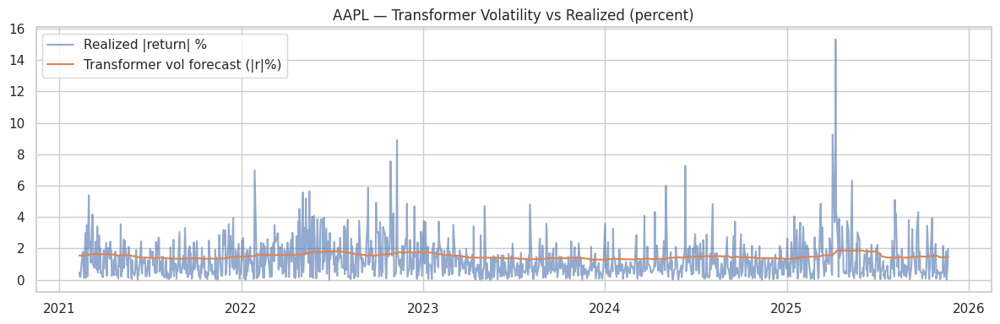

MSFT: Transformer volatility RMSE (|return|%): 1.091889


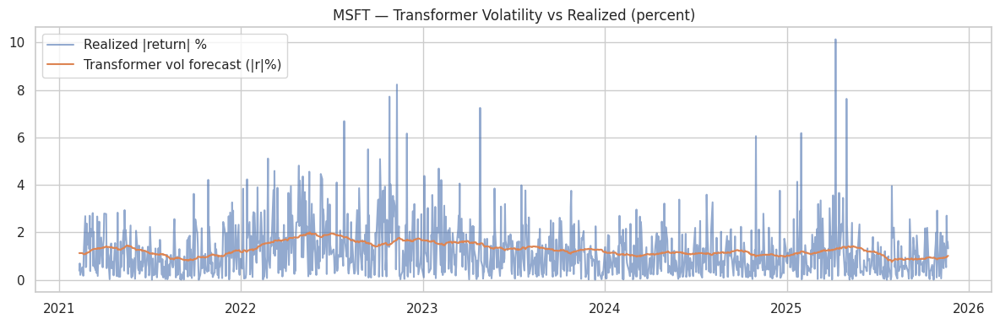

NVDA: Transformer volatility RMSE (|return|%): 2.288656


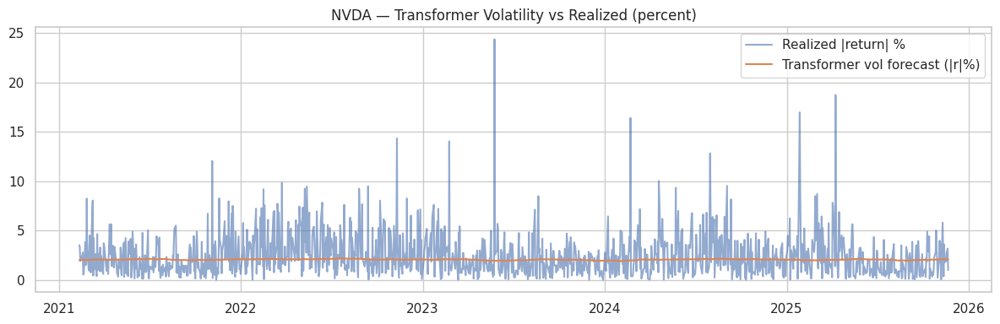

EBAY: Transformer volatility RMSE (|return|%): 1.475391


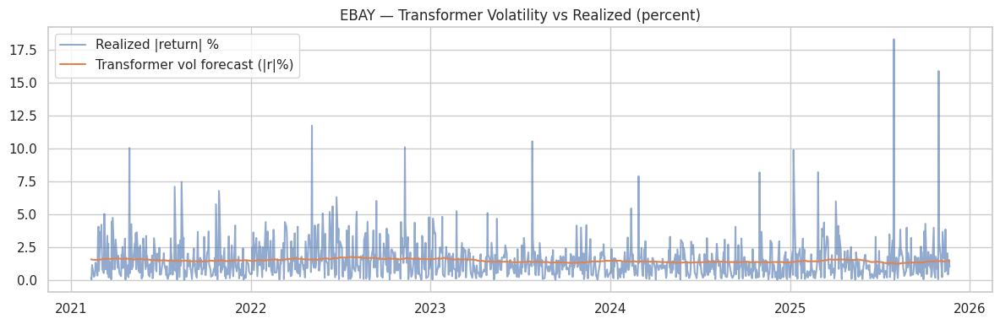

MCD: Transformer volatility RMSE (|return|%): 0.926351


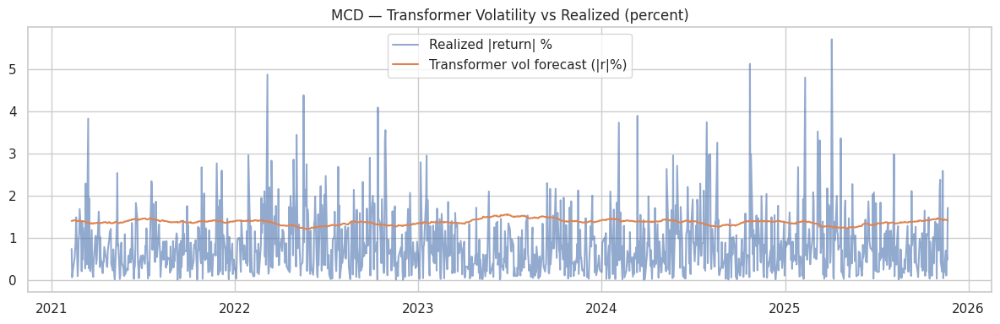

SBUX: Transformer volatility RMSE (|return|%): 1.557886


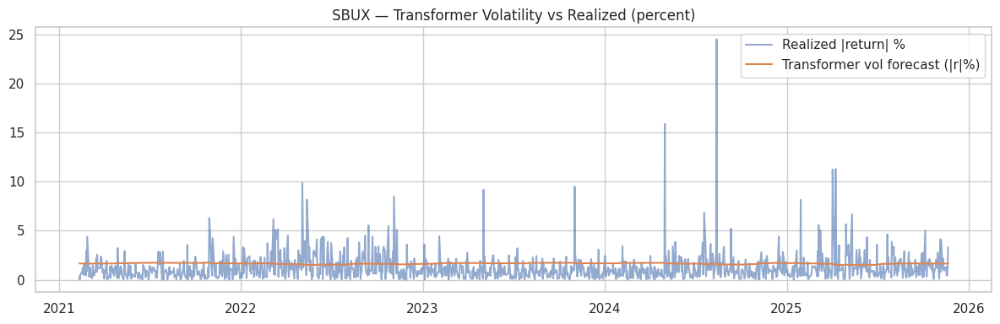


Transformer volatility RMSE (percent units):
AAPL    1.239682
EBAY    1.475391
MCD     0.926351
MSFT    1.091889
NVDA    2.288656
SBUX    1.557886
dtype: float64


In [ ]:
#Get Transformer volatility predictions and compute RMSE (percent units)
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

tform_vol_pred = {}   # ticker -> predicted |r|% (percent)
tform_vol_true = {}
tform_vol_rmse = {}

for t in tickers:
    if t not in tform_vol_models:
        continue

    model  = tform_vol_models[t]
    X_te   = Xte_vol[t]
    Y_te   = Yte_vol[t]
    scaler = scalers_vol[t]
    idx    = idx_tests_vol[t]

    # Predict (scaled) -> inverse-transform to percent
    yhat_sc = model.predict(X_te, verbose=0)
    yhat    = scaler.inverse_transform(yhat_sc)
    ytrue   = scaler.inverse_transform(Y_te)

    m = min(len(ytrue), len(yhat), len(idx))
    yhat  = yhat[:m]
    ytrue = ytrue[:m]
    idx_m = idx[:m]

    tform_vol_pred[t]  = yhat
    tform_vol_true[t]  = ytrue

    rmse = float(np.sqrt(mean_squared_error(ytrue, yhat)))
    tform_vol_rmse[t] = rmse

    print(f"{t}: Transformer volatility RMSE (|return|%): {rmse:.6f}")

    # quick plot
    plt.figure(figsize=(12,4))
    plt.plot(idx_m, ytrue, label='Realized |return| %', alpha=0.6)
    plt.plot(idx_m, yhat,  label='Transformer vol forecast (|r|%)', linewidth=1.5)
    plt.title(f"{t} — Transformer Volatility vs Realized (percent)")
    plt.legend(); plt.tight_layout(); plt.show()

print("\nTransformer volatility RMSE (percent units):")
print(pd.Series(tform_vol_rmse).sort_index().round(6))


In [ ]:
comp = pd.DataFrame(rows).set_index("Ticker").sort_index()


In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd

rows = []

for t in tickers:
    # --- Realized volatility (|r|%) ---
    if t not in realized_all:
        continue
    y_true = realized_all[t].values

    # --- Best GARCH RMSE per ticker ---
    best_name, best_rmse = None, np.inf
    if t in fcasts_all:
        for name, arr in fcasts_all[t].items():
            arr = np.asarray(arr)
            m = min(len(y_true), len(arr))
            if m == 0:
                continue
            rmse = float(np.sqrt(mean_squared_error(y_true[:m], arr[:m])))
            if rmse < best_rmse:
                best_name, best_rmse = name, rmse

    # --- Baseline (RollingStd30) ---
    base = np.asarray(baseline_all.get(t, []))
    if len(base) > 0:
        m2 = min(len(y_true), len(base))
        rmse_base = float(np.sqrt(mean_squared_error(y_true[:m2], base[:m2])))
    else:
        rmse_base = np.nan

    # --- LSTM volatility RMSE ---
    rmse_lstm = float(lstm_vol_rmse.get(t, np.nan))

    # --- Transformer volatility RMSE ---
    rmse_tform = float(tform_vol_rmse.get(t, np.nan))

    rows.append({
        "Ticker": t,
        "Best_GARCH_Name": best_name,
        "Best_GARCH_RMSE": best_rmse,
        "LSTM_vol_RMSE": rmse_lstm,
        "Transformer_vol_RMSE": rmse_tform,
        "RollingStd30_RMSE": rmse_base
    })

comp = pd.DataFrame(rows).set_index("Ticker").sort_index()

print("\nVolatility RMSE comparison (percent units) — with Transformer:")
print(comp[[
    "Best_GARCH_RMSE",
    "LSTM_vol_RMSE",
    "Transformer_vol_RMSE",
    "RollingStd30_RMSE"
]].round(6))



Volatility RMSE comparison (percent units) — with Transformer:
        Best_GARCH_RMSE  LSTM_vol_RMSE  Transformer_vol_RMSE  \
Ticker                                                         
AAPL           1.321048       1.198945              1.239682   
EBAY           1.607786       1.490523              1.475391   
MCD            0.788600       0.718666              0.926351   
MSFT           1.179683       1.093354              1.091889   
NVDA           2.396218       2.212931              2.288656   
SBUX           1.643275       1.488125              1.557886   

        RollingStd30_RMSE  
Ticker                     
AAPL             1.309214  
EBAY             1.642335  
MCD              0.774280  
MSFT             1.171501  
NVDA             2.377734  
SBUX             1.679728  


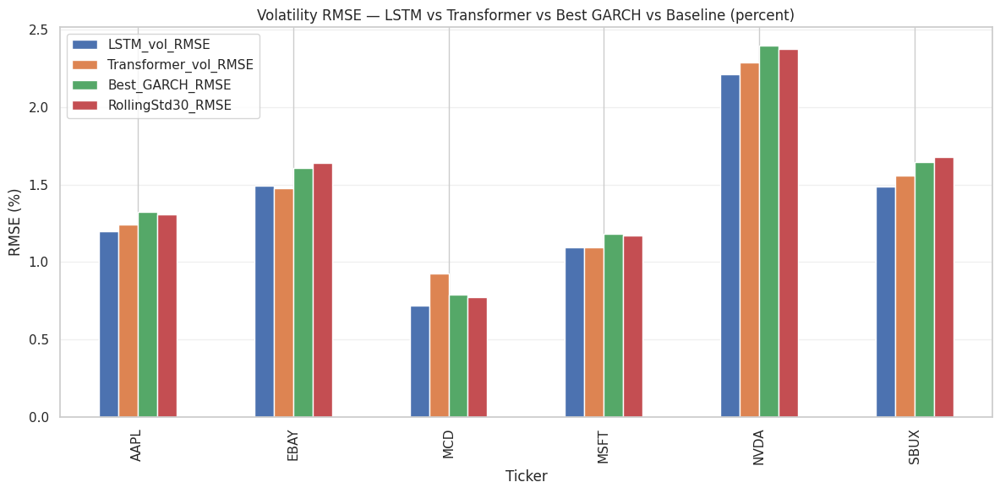

In [ ]:
ax = comp[[
    "LSTM_vol_RMSE",
    "Transformer_vol_RMSE",
    "Best_GARCH_RMSE",
    "RollingStd30_RMSE"
]].plot(kind="bar", figsize=(12,6))

ax.set_title("Volatility RMSE — LSTM vs Transformer vs Best GARCH vs Baseline (percent)")
ax.set_xlabel("Ticker")
ax.set_ylabel("RMSE (%)")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

def align_four(idx_lstm, yhat_lstm,
               idx_tf,   yhat_tf,
               idx_garch, yhat_garch,
               y_true_series):
    """
    Align LSTM, Transformer, GARCH forecasts and true |returns|
    on a common date index and return numpy arrays.
    """
    df = (
        pd.DataFrame({"lstm": np.asarray(yhat_lstm).ravel()}, index=idx_lstm)
        .join(
            pd.DataFrame({"trans": np.asarray(yhat_tf).ravel()}, index=idx_tf),
            how="inner"
        )
        .join(
            pd.DataFrame({"garch": np.asarray(yhat_garch).ravel()}, index=idx_garch),
            how="inner"
        )
        .join(
            y_true_series.rename("y_true"),
            how="inner"
        )
        .dropna()
    )

    dates = df.index
    y_true = df["y_true"].values.reshape(-1, 1)
    x_lstm = df["lstm"].values.reshape(-1, 1)
    x_tf   = df["trans"].values.reshape(-1, 1)
    x_g    = df["garch"].values.reshape(-1, 1)

    return dates, y_true, x_lstm, x_tf, x_g


In [ ]:
triple_weights_results = {}

for t in tickers:
    # need all three forecasts & realized volatility
    if t not in lstm_vol_pred:
        print(f"{t}: no LSTM-vol — skipping");
        continue
    if t not in tform_vol_pred:
        print(f"{t}: no Transformer-vol — skipping");
        continue
    if t not in fcasts_all or garch_name not in fcasts_all[t]:
        print(f"{t}: no {garch_name} for GARCH — skipping");
        continue
    if t not in realized_all:
        print(f"{t}: no realized_all — skipping");
        continue

    idx_lstm   = idx_tests_vol[t]
    yhat_lstm  = lstm_vol_pred[t]
    idx_tf     = idx_tests_vol[t]           # same index for Transformer
    yhat_tf    = tform_vol_pred[t]
    idx_garch  = test_idx_all[t]
    yhat_garch = fcasts_all[t][garch_name]
    y_true_ser = realized_all[t]

    dates, y_true, x_lstm, x_tf, x_g = align_four(
        idx_lstm, yhat_lstm,
        idx_tf,   yhat_tf,
        idx_garch, yhat_garch,
        y_true_ser
    )

    m = len(dates)
    if m < 60:
        print(f"{t}: too few aligned points ({m}) — skipping")
        continue

    # --- Train/test split on test window (no leakage) ---
    k = max(10, int(0.30 * m))

    X_fit = np.hstack([x_lstm[:k], x_tf[:k], x_g[:k]])   # [LSTM, TF, GARCH]
    y_fit = y_true[:k].ravel()

    X_ev  = np.hstack([x_lstm[k:], x_tf[k:], x_g[k:]])
    y_ev  = y_true[k:].ravel()

    # --- Non-negative linear regression (no intercept) ---
    reg = LinearRegression(positive=True, fit_intercept=False)
    reg.fit(X_fit, y_fit)

    coefs = reg.coef_.astype(float)   # [w_LSTM_raw, w_TF_raw, w_GARCH_raw]
    s = coefs.sum() if coefs.sum() > 0 else 1.0
    w = coefs / s                     # convex weights that sum to 1

    w_lstm, w_tf, w_g = w.tolist()

    # --- Hybrid predictions (convex combination) ---
    yhat_h = (w_lstm * X_ev[:, 0] +
              w_tf   * X_ev[:, 1] +
              w_g    * X_ev[:, 2])

    # --- Component RMSEs on eval slice ---
    rmse_l = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 0])))
    rmse_t = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 1])))
    rmse_g = float(np.sqrt(mean_squared_error(y_ev, X_ev[:, 2])))
    rmse_h = float(np.sqrt(mean_squared_error(y_ev, yhat_h)))

    triple_weights_results[t] = {
        "weights_[LSTM,TF,GARCH]": w.tolist(),
        "rmse_eval_lstm": rmse_l,
        "rmse_eval_tf":   rmse_t,
        "rmse_eval_garch": rmse_g,
        "rmse_eval_hybrid": rmse_h,
        "n_eval": len(y_ev)
    }

    print(
        f"{t}: weights(convex) = [LSTM={w_lstm:.3f}, TF={w_tf:.3f}, GARCH={w_g:.3f}] | "
        f"RMSE — LSTM {rmse_l:.4f}, TF {rmse_t:.4f}, GARCH {rmse_g:.4f}, HYBRID {rmse_h:.4f}"
    )


AAPL: weights(convex) = [LSTM=0.000, TF=0.000, GARCH=1.000] | RMSE — LSTM 1.2268, TF 1.2793, GARCH 1.3662, HYBRID 1.3662
MSFT: weights(convex) = [LSTM=0.495, TF=0.505, GARCH=0.000] | RMSE — LSTM 1.1180, TF 1.1183, GARCH 1.2176, HYBRID 1.1086
NVDA: weights(convex) = [LSTM=0.534, TF=0.000, GARCH=0.466] | RMSE — LSTM 2.2666, TF 2.3129, GARCH 2.4884, HYBRID 2.3044
EBAY: weights(convex) = [LSTM=0.113, TF=0.887, GARCH=0.000] | RMSE — LSTM 1.4667, TF 1.4567, GARCH 1.6075, HYBRID 1.4548
MCD: weights(convex) = [LSTM=0.635, TF=0.141, GARCH=0.224] | RMSE — LSTM 0.7217, TF 0.9336, GARCH 0.7922, HYBRID 0.7376
SBUX: weights(convex) = [LSTM=0.402, TF=0.000, GARCH=0.598] | RMSE — LSTM 1.5793, TF 1.6297, GARCH 1.7702, HYBRID 1.6398


In [ ]:
# RMSE table
rows = []
w_rows = []

for t, d in triple_weights_results.items():
    rows.append({
        "Ticker": t,
        "LSTM":   d["rmse_eval_lstm"],
        "TF":     d["rmse_eval_tf"],
        "GARCH":  d["rmse_eval_garch"],
        "Hybrid": d["rmse_eval_hybrid"],
    })
    wL, wT, wG = d["weights_[LSTM,TF,GARCH]"]
    w_rows.append({
        "Ticker": t,
        "w_LSTM": wL,
        "w_TF":   wT,
        "w_GARCH": wG
    })

df_rmse = pd.DataFrame(rows).set_index("Ticker").sort_index()
df_wts  = pd.DataFrame(w_rows).set_index("Ticker").sort_index()

print("\nTriple-Hybrid RMSE (percent units):")
print(df_rmse.round(6))

print("\nConvex Weights [LSTM, TF, GARCH]:")
print(df_wts.round(3))



Triple-Hybrid RMSE (percent units):
            LSTM        TF     GARCH    Hybrid
Ticker                                        
AAPL    1.226777  1.279327  1.366209  1.366209
EBAY    1.466656  1.456655  1.607541  1.454804
MCD     0.721745  0.933571  0.792190  0.737562
MSFT    1.118045  1.118300  1.217590  1.108615
NVDA    2.266595  2.312902  2.488361  2.304419
SBUX    1.579340  1.629736  1.770176  1.639833

Convex Weights [LSTM, TF, GARCH]:
        w_LSTM   w_TF  w_GARCH
Ticker                        
AAPL     0.000  0.000    1.000
EBAY     0.113  0.887    0.000
MCD      0.635  0.141    0.224
MSFT     0.495  0.505    0.000
NVDA     0.534  0.000    0.466
SBUX     0.402  0.000    0.598


<Figure size 1000x500 with 0 Axes>

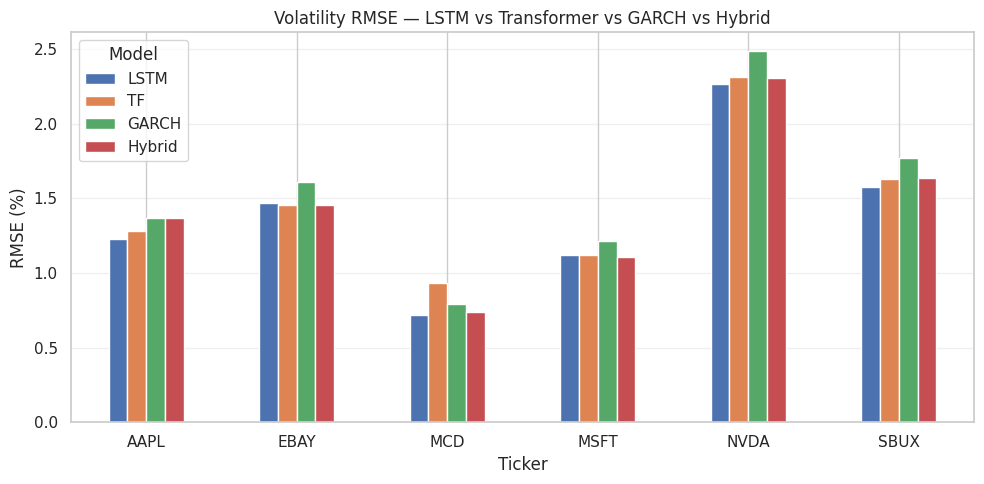

<Figure size 1000x500 with 0 Axes>

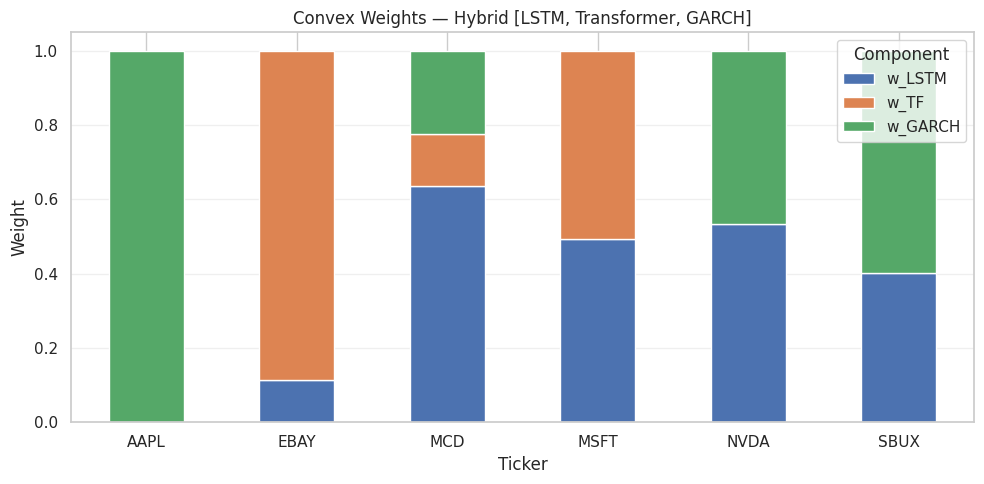

In [ ]:
# RMSE grouped bar
plt.figure(figsize=(10,5))
df_rmse.plot(kind="bar", figsize=(10,5))
plt.title("Volatility RMSE — LSTM vs Transformer vs GARCH vs Hybrid")
plt.ylabel("RMSE (%)"); plt.xlabel("Ticker")
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Model")
plt.tight_layout()
plt.show()

# Weights stacked bar
plt.figure(figsize=(10,5))
df_wts.plot(kind="bar", stacked=True, figsize=(10,5))
plt.title("Convex Weights — Hybrid [LSTM, Transformer, GARCH]")
plt.ylabel("Weight"); plt.xlabel("Ticker")
plt.ylim(0, 1.05)
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title="Component")
plt.tight_layout()
plt.show()
